# Photonic Crystal Slab Template

## Configuration

In [ ]:
## Define the materials
from phc_nzi.photonic_crystal_maker import (Material, Geometry, PhotonicCrystal, 
                                        ScriptParam, ScriptParamVector3, BaseDielectricDistribution,
                                        HexagonalLattice)
import phc_nzi.photonic_crystal_maker as phc_mkr
import meep as mp
from phc_nzi.mpb_configurator import *
from phc_nzi.simulation_handler import LSFJobConfiguration, MPBDataOptions, Simulation
from phc_nzi.optimization_data_analyzer import OptimizationDataAnalyzer
from phc_nzi.simulation_viewer import SimulationViewer
from phc_nzi.lsf_sweeper import LSFSweeper

import numpy as np
import matplotlib.pyplot as plt
import os
from matplotlib.patches import FancyArrow
from matplotlib.legend_handler import HandlerPatch
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
import joblib
from matplotlib.ticker import FormatStrFormatter, LogFormatterSciNotation, LogLocator
import matplotlib.colors as mcolors
import pandas as pd
from phc_nzi.mpi_bayesian_optimization import MPIBayesianOptimizator

# import tqdm for progress bars
from tqdm import tqdm
plt.rcParams["font.size"] = 15

n_si = 3.48
print(n_si)
eps_si = round(n_si**2, 2)
print("Epsilon of Si: ", eps_si)

si = Material(epsilon=eps_si)
air = Material(epsilon=1)
# Simulation Name: 
name = "C6v_pillars_"

# Define the geometry
radius1 = ScriptParam("r1", 0.3)
radius2 = ScriptParam("r2", 0.2)
height_supercell = 3
height_slab = ScriptParam("h", 0.4)
slab_block_size = ScriptParamVector3(1e20, 1e20, "h", z_def=0.4)

# Define the lattice

lattice_2D = phc_mkr.HexagonalLattice()
lattice_slab = phc_mkr.HexagonalLattice(supercell_height=4)

k_points = lattice_2D.get_high_symmetry_k_points(centered_in_gamma=True)
distance = 0.1
k_points_around_gamma = lattice_2D.get_k_points_around_gamma(distance=distance)

print(k_points)

center = mp.Vector3(0,0,0)
dist = BaseDielectricDistribution(eps_bulk=1, eps_atoms=eps_si)
atoms_1 = dist.make_C6v_1a(radius=dist._radius1) 
atoms_2 = dist.make_C6v_3c(radius=dist._radius2)
molecule_geometry = dist.make_superposition([atoms_1, atoms_2])
photonic_crystal_2D = PhotonicCrystal(lattice=lattice_2D, atoms=molecule_geometry)
crystal_symmetries = r"$C_{6v}:\;1a \oplus 3c$"

def calculate_filling_factor(r1, r2, a=1):
    """
    Calculates the dielectric filling fraction for a 2D hexagonal lattice 
    with pillars at Wyckoff positions 1a (radius r1) and 3c (radius r2).
    
    Formula: f = (Total Pillar Area) / (Unit Cell Area)
             f = (pi * r1^2 + 3 * pi * r2^2) / (sqrt(3)/2 * a^2)
    """
    # Total area of pillars in the primitive cell
    pillar_area = np.pi * (r1**2 + 3 * r2**2)
    # Area of the hexagonal unit cell (a^2 * sin(60 degrees))
    unit_cell_area = (np.sqrt(3) / 2) * (a**2)
    filling_fraction = pillar_area / unit_cell_area
    return filling_fraction

import numpy as np

def calculate_filling_factor_from_distribution(eps_grid, eps_th):
    """
    Calculates the filling factor from a dielectric distribution grid.
    
    Parameters:
    eps_grid (np.array): 2D array of epsilon values.
    eps_th (float): Threshold value (e.g., 1.5 if dielectric is 12 and air is 1).
    
    Returns:
    float: The filling factor f.
    """
    # Create a boolean mask where epsilon is greater than the threshold
    dielectric_mask = eps_grid > eps_th
    
    # Count the number of 'True' values and divide by total grid size
    filling_factor = np.sum(dielectric_mask) / eps_grid.size
    
    return filling_factor


dist_slab = BaseDielectricDistribution(eps_bulk=1  , eps_atoms=eps_si, height_slab=0.4)
atoms_1_slab = dist_slab.make_C6v_2b(radius=dist_slab._radius1)
atoms_2_slab = dist_slab.make_C6v_3c(radius=dist_slab._radius2)
molecule_geometry_slab = dist_slab.make_superposition([atoms_1_slab, atoms_2_slab])
photonic_crystal_slab = PhotonicCrystal(lattice=lattice_slab, atoms=molecule_geometry_slab)

RESOLUTION = 65
## Define the simulation
configuration_options_2D = dict(
    resolution = RESOLUTION,
    num_bands=10,
    k_points=k_points["k_points_values"],
    k_points_interpolation_factor = 30,
    extra_runner_command = "fix-efield-phase output-hfield output-efield display-symmetries-c6v",
)

delta_k = 0.1
k_points_2D_optimized_values = [
    mp.Vector3(delta_k, 0, 0),                       # Point toward K
    mp.Vector3(0, 0, 0),                             # Gamma
    mp.Vector3(delta_k * np.cos(np.pi/6),            # Point toward M (30 deg)
               delta_k * np.sin(np.pi/6), 0)
]
k_points_2D_optimized_labels = [r"K $\leftarrow$", r"$\Gamma$", r"$\rightarrow$ M"]

k_points_2D_optimized = {"k_points_values": k_points_2D_optimized_values, "k_points_labels": k_points_2D_optimized_labels}
configuration_options_2D_optimized = dict(
    resolution = RESOLUTION,
    num_bands=18,
    k_points=k_points_2D_optimized["k_points_values"],
    k_points_interpolation_factor = 20,
    extra_runner_command = "fix-efield-phase output-hfield output-efield display-symmetries-c6v",
)


RESOLUTION_SLAB = 32
configuration_options_slab = dict(
    resolution = RESOLUTION_SLAB,
    num_bands=15,
    k_points=k_points["k_points_values"],
    k_points_interpolation_factor = 20,
    mesh_size = 7,
    extra_runner_command = "(output-at-kpoint (vector3 0 0 0) fix-efield-phase output-efield)",
)

configuration_options_slab_centered = dict(
    resolution = RESOLUTION_SLAB,
    num_bands=15,
    k_points=k_points_2D_optimized["k_points_values"],
    k_points_interpolation_factor = 20,
    mesh_size = 7,
    extra_runner_command = "(output-at-kpoint (vector3 0 0 0) fix-efield-phase output-efield)",
)

configuration_options_optimization = dict(
    resolution = RESOLUTION,
    num_bands=8,
    k_points = [mp.Vector3(0,0,0)],
    extra_runner_command = "fix-efield-phase display-symmetries-c6v" 
)

configuration_options_optimization_slab = dict(
    resolution = RESOLUTION_SLAB,
    num_bands=10,
    k_points = [mp.Vector3(0,0,0)], 
)

configuration_options_sweep = dict( 
    resolution = RESOLUTION,
    num_bands=10,
    k_points=[mp.Vector3(0,0,0)],
)




mpb_configuration_2D=MPBSchemeConfigurator(
    photonic_crystal_2D, ["te", "tm"], **configuration_options_2D)
mpb_configuration_slab=MPBSchemeConfigurator(
    photonic_crystal_slab, ["zodd"], **configuration_options_slab)
mpb_configuration_2D_opt=MPBSchemeConfigurator(
    photonic_crystal_2D, ["tm"], **configuration_options_optimization)
mpb_configuration_2D_optimized=MPBSchemeConfigurator(
    photonic_crystal_2D, ["tm"], **configuration_options_2D_optimized)
mpb_configuration_2D_sweep=MPBSchemeConfigurator(
    photonic_crystal_2D, ["tm"], **configuration_options_sweep)
mpb_configuration_slab_opt=MPBSchemeConfigurator(
    photonic_crystal_slab, ["zodd"], **configuration_options_optimization_slab)
mpb_configuration_slab_sweep=MPBSchemeConfigurator(
    photonic_crystal_slab, ["zodd"], **configuration_options_sweep)
mpb_configuration_slab_opt_centered=MPBSchemeConfigurator(
    photonic_crystal_slab, ["zodd"], **configuration_options_slab_centered)

script_2D = mpb_configuration_2D.get_scheme_config(join_newline=True)
script_slab = mpb_configuration_slab.get_scheme_config(join_newline=True)
script_2D_opt = mpb_configuration_2D_opt.get_scheme_config(join_newline=True)
script_2D_optimized = mpb_configuration_2D_optimized.get_scheme_config(join_newline=True)
script_2D_sweep = mpb_configuration_2D_sweep.get_scheme_config(join_newline=True)
script_slab_opt = mpb_configuration_slab_opt.get_scheme_config(join_newline=True)
script_slab_sweep = mpb_configuration_slab_sweep.get_scheme_config(join_newline=True)
script_slab_opt_centered = mpb_configuration_slab_opt_centered.get_scheme_config(join_newline=True)


name_2D = name  + "_2D"
name_slab = name + "_slab"


name_2D_opt = name + "_2D_opt"
name_2D_sweep = name + "_2D_sweep"

name_slab_opt = name + "_slab_opt"
name_slab_sweep = name + "_slab_sweep"
name_slab_opt_centered = name + "_slab_opt_centered"

name_2D_optimized = name + "_2D_optimized"

data_rooth = "/work3/enrva/phc_nzi_data/MPB_data"
if not os.path.exists(data_rooth):
    os.makedirs(data_rooth)

simulation_2D = Simulation(
    simulation_name=name_2D,
    script = script_2D,
    directory= os.path.join(data_rooth, name_2D)
    )



simulation_2D_opt_345 = Simulation(
    simulation_name=name_2D_opt + "_345",
    script = script_2D_opt,
    directory= os.path.join(data_rooth, name_2D_opt + "_345")
    )

simulation_2D_sweep = Simulation(
    simulation_name=name_2D_sweep,
    script = script_2D_sweep,
    directory= os.path.join(data_rooth, name_2D_sweep)
    )

simulation_2D_optimized = Simulation(
    simulation_name=name_2D_optimized,
    script = script_2D_optimized,
    directory= os.path.join(data_rooth, name_2D_optimized)
    )


simulation_slab = Simulation(
    simulation_name=name_slab,
    script = script_slab,
    directory= os.path.join(data_rooth, name_slab)
    )


simulation_slab_opt = Simulation(
    simulation_name=name_slab_opt,
    script = script_slab_opt,
    directory= os.path.join(data_rooth, name_slab_opt)  
    )

simulation_slab_opt_centered = Simulation(
    simulation_name=name_slab_opt_centered,
    script = script_slab_opt_centered,
    directory= os.path.join(data_rooth, name_slab_opt_centered)  
    )

simulation_slab_sweep = Simulation(
    simulation_name=name_slab_sweep,
    script = script_slab_sweep,
    directory= os.path.join(data_rooth, name_slab_sweep)  
    )


numproc= 28
pop = numproc // 2
lsf_config = LSFJobConfiguration(num_processors=numproc, span_option="hosts", span_value=1, queue="hpc",   mem = "1GB")

figure_path = "figures"

figure_path = os.path.abspath("/zhome/2f/7/202918//article1/pics")  
if not os.path.exists(figure_path):
    os.makedirs(figure_path)

Using MPI version 4.1, 1 processes
3.48
Epsilon of Si:  12.11
{'k_points_values': [Vector3<-0.3333333333333333, 0.3333333333333333, 0.0>, Vector3<0.0, 0.0, 0.0>, Vector3<0.0, 0.5, 0.0>, Vector3<-0.3333333333333333, 0.3333333333333333, 0.0>], 'k_points_labels': ['K', '$\\Gamma$', 'M', 'K']}
COMMANDS ['(define-param h 1e+20)', '(define-param r1 0.1)', '(define-param r2 0.2)']
COMMANDS ['(define-param h 0.4)', '(define-param r1 0.1)', '(define-param r2 0.2)']
COMMANDS ['(define-param h 1e+20)', '(define-param r1 0.1)', '(define-param r2 0.2)']
COMMANDS ['(define-param h 1e+20)', '(define-param r1 0.1)', '(define-param r2 0.2)']
COMMANDS ['(define-param h 1e+20)', '(define-param r1 0.1)', '(define-param r2 0.2)']
COMMANDS ['(define-param h 0.4)', '(define-param r1 0.1)', '(define-param r2 0.2)']
COMMANDS ['(define-param h 0.4)', '(define-param r1 0.1)', '(define-param r2 0.2)']
COMMANDS ['(define-param h 0.4)', '(define-param r1 0.1)', '(define-param r2 0.2)']


In [ ]:
# Dictionary of standard scientific plotting parameters
SINGLE_COLUMN_WIDTH = 3.3 # inches
DOUBLE_COLUMN_WIDTH = 6.9
GOLDEN_RATIO = 1.618  # Standard proportion for scientific plots
ROW_HEIGHT = SINGLE_COLUMN_WIDTH / GOLDEN_RATIO  # Approx 2.16 inches
publication_params = {
    # --- Figure Dimensions & Output ---
    "figure.figsize": (SINGLE_COLUMN_WIDTH, ROW_HEIGHT),
    "figure.dpi": 300,              # High resolution for rasterized rendering
    "savefig.bbox": "tight",        # Prevents clipping of axis labels
    "savefig.pad_inches": 0.05,     # Removes excess white space margins
    
    # --- Fonts & Text ---
    "font.family": "serif",            # Standard for academic journals
    "font.serif": ["Times New Roman", "DejaVu Serif", "Computer Modern Roman"],
    "font.size": 9,                    # Set base font size to 9pt (perfect mid-range for 8-10pt rule)
    "axes.labelsize": 9,               # Axis label size
    "axes.titlesize": 9,               # Plot title size
    "xtick.labelsize": 8,              # X-axis tick label size (matches 8pt minimum)
    "ytick.labelsize": 8,              # Y-axis tick label size (matches 8pt minimum)
    "legend.fontsize": 8,              # Legend text size
    "axes.labelsize": 9,
    
    # --- Axes & Lines ---
    "axes.linewidth": 1.0,          # Thicker bounding box
    "lines.linewidth": 1.1,         # Thicker lines for visibility when printed
    "lines.markersize": 4,          # Clear, readable data markers
    
    # --- Ticks ---
    "xtick.direction": "in",        # Ticks point inward (standard in science)
    "ytick.direction": "in",
    "xtick.top": True,              # Top axis ticks visible
    "ytick.right": True,            # Right axis ticks visible
    "xtick.minor.visible": True,    # Enable minor ticks for precision
    "ytick.minor.visible": True,
    
    # --- Legend ---
    "legend.frameon": False,        # Remove the box around the legend to save ink
    
    # --- Mathtext / LaTeX ---
    "mathtext.fontset": "cm",       # Computer Modern for math rendering
    # "text.usetex": True,          # Uncomment if you have a local LaTeX engine installed!
}

# Apply the configurations globally
plt.rcParams.update(publication_params)


## 2D
### Unoptimized


In [3]:
SIMULATE = False
r1 = 0.2
r2 = 0.15

In [4]:
# Run or load the unoptimized 2D simulation to get the data for plotting
data_line = rf"$r_1={r1:0.3f}a$, $r_2={r2:0.3f}a$, $FF={calculate_filling_factor(r1, r2):0.3f}$ $\varepsilon={eps_si}$"

# make a new simulation just for this purpose, to avoid overwriting the original one with the new parameters
simulation_2D_unoptimized = Simulation(
    simulation_name=name_2D + "_unoptimized",
    script = script_2D,
    directory= os.path.join(data_rooth, name_2D + "_unoptimized")
    )
if SIMULATE is True:
    print("2D simulation started")
    simulation_2D_unoptimized.run_hpc(mpb_command_line_params=dict(r1 = r1, r2 = r2), mpi = False, version = "mpb-dev/1.11.2-dev")
    print("Done.")
print("Collecting results forom ", simulation_2D_unoptimized.directory)


In [5]:

# Extract TM symmetry data
symmetry_results = simulation_2D_unoptimized.get_symmetry_by_parity("tm")

if symmetry_results:
    print(f"{'Band':<6} | {'Irrep':<26} | Projections")
    print("-" * 80)
    for band, chars in symmetry_results.items():
        # 1. Compute the full projection set
        projections = simulation_2D_unoptimized.compute_projections(chars, group="C6v")
        
        # 2. Identify the base label
        best_match = simulation_2D_unoptimized.identify_irrep(projections)
        max_proj = projections.get(best_match, 0.0)
        
        # 3. Handle formatting and confidence warnings entirely within the loop
        if max_proj < 0.85:
            label = f"{best_match} (Low Conf: {max_proj:.2f})"
        else:
            label = best_match
        
        # 4. Format the projections for display
        proj_str = ", ".join([f"{k}:{v:+.2f}" for k, v in projections.items() if abs(v) > 0.05])
        
        print(f"{band:<6} | {label:<26} | {proj_str}")

Band   | Irrep                      | Projections
--------------------------------------------------------------------------------
1      | E_1                        | A_1:+0.37, A_2:-0.37, B_1:+0.12, B_2:-0.12, E_1:+1.00
2      | A_1                        | A_1:+1.00
3      | E_2                        | A_1:-0.13, A_2:+0.13, B_1:+0.37, B_2:-0.37, E_2:+1.00
4      | E_2                        | A_1:+0.13, A_2:-0.13, B_1:-0.37, B_2:+0.37, E_2:+1.00
5      | E_1                        | A_1:-0.38, A_2:+0.38, B_1:+0.12, B_2:-0.12, E_1:+1.00
6      | E_1                        | A_1:+0.38, A_2:-0.38, B_1:-0.12, B_2:+0.12, E_1:+1.00
7      | B_2                        | B_2:+1.00
8      | E_1                        | A_1:-0.37, A_2:+0.37, B_1:+0.13, B_2:-0.13, E_1:+1.00
9      | E_1                        | A_1:+0.37, A_2:-0.37, B_1:-0.12, B_2:+0.13, E_1:+1.00
10     | B_1                        | B_1:+1.00


(68.68285203004635, 126.31714796995365, 51.3254535323641, 117.67454646763589)

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


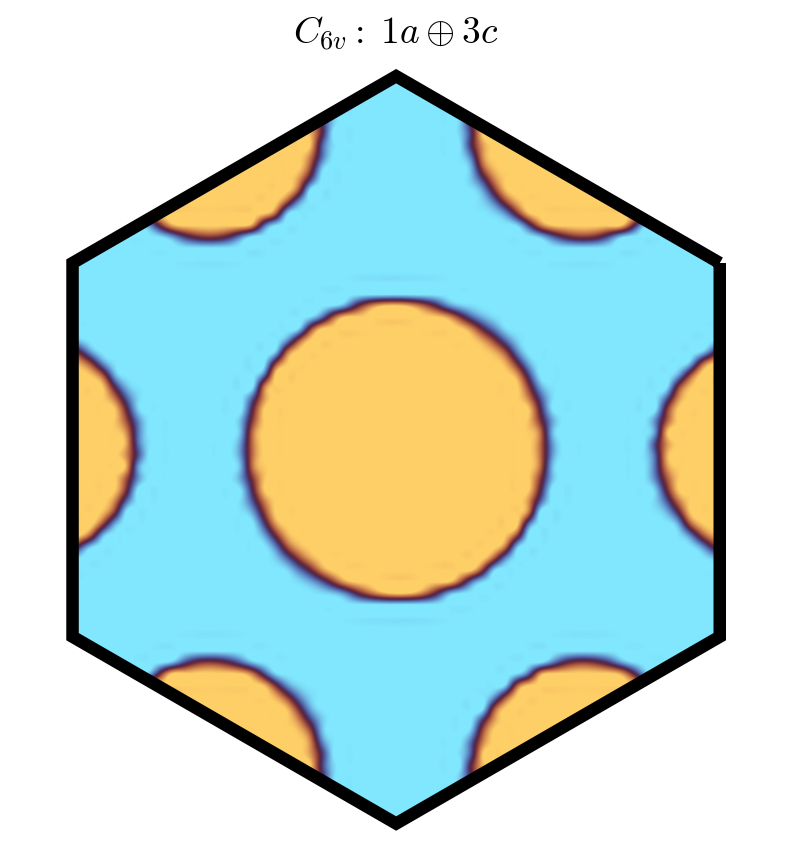

In [6]:
import phc_nzi.simulation_viewer as sv



# -- 2. TOP RIGHT PANEL: Crystal Structure
opt_3x3 = MPBDataOptions(rectify=True, periods=3, resolution=65)
eps_3x3 = simulation_2D_unoptimized.load_and_convert_epsilon_data(options=opt_3x3)
plt.figure(figsize=(3.3, 3.3))
# Plotting the dielectric distribution directly to avoid automatic colorbars/ticks
sv.plot_epsilon_on_ax(eps_3x3, lattice_type="hexagonal", interpolation = "spline36")

plt.xticks([])
plt.yticks([])
plt.title(crystal_symmetries)
ax = plt.gca()
plt.xlabel([])
plt.ylabel([])  
ax.set_box_aspect(1)
ax.axis('off')

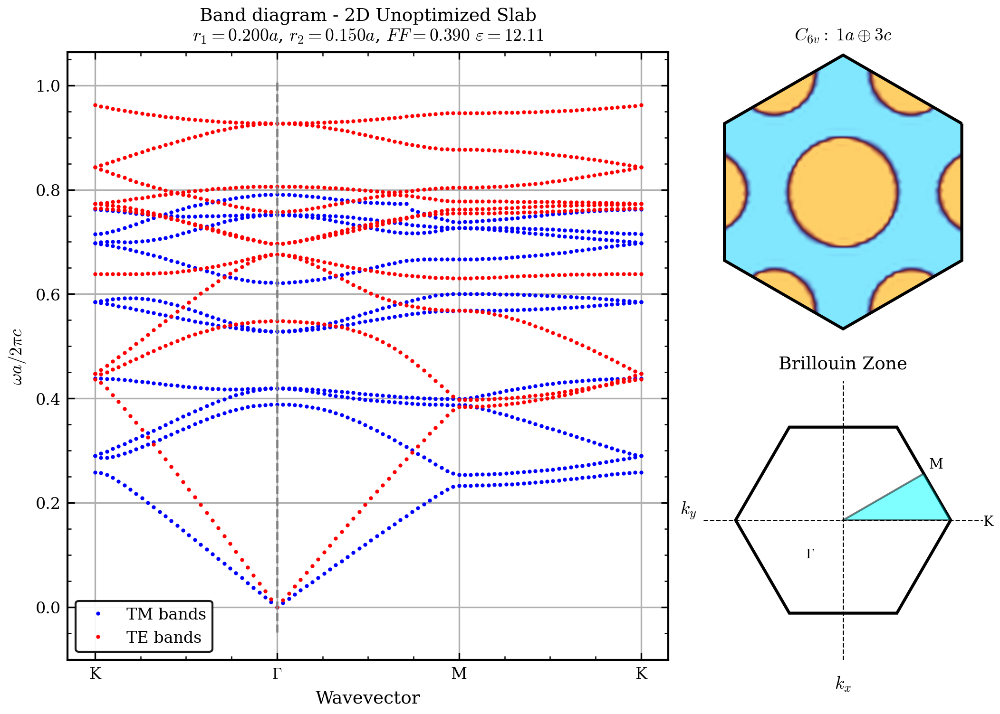

0.39076923076923076

In [7]:
# Plot the band diagram and the unit cell
df_tm = simulation_2D_unoptimized.load_frequency_data("tm")
df_target_idx = df_tm.loc[(df_tm["k1"] == 0) & (np.abs(df_tm["k2"]) == 0), "k1"].idxmin()
k_idx_for_field_plot = df_tm.loc[df_target_idx, "k index"]
plot_options = dict(linestyle='', marker='o', markersize=1)

# Create a figure with a custom grid layout
fig = plt.figure(figsize=(7,5), constrained_layout=True)
gs = gridspec.GridSpec(2, 3, figure=fig)

# -- 1. LEFT PANEL: Band Diagram --
ax_band = fig.add_subplot(gs[:, 0:2])
plt.sca(ax_band) # Set current axis for the viewer
plot_options = dict(linestyle='', marker='o', markersize=1)

# viewer_2D uses the currently active axis (plt.gca())
viewer_2D = sv.SimulationViewer(simulation_2D_unoptimized)
viewer_2D.plot_band_diagram("tm", k_points_path=k_points, color="blue", plot_options=plot_options)
viewer_2D.plot_band_diagram("te", k_points_path=k_points, color="red", plot_options=plot_options)
ax_band.set_ylabel(r"$\omega a/2\pi c$")
ax_band.set_title("Band diagram - 2D Unoptimized Slab\n" + data_line)
ymin, ymax = ax_band.get_ylim()
ax_band.vlines(k_idx_for_field_plot, ymin, ymax, colors="gray", linestyles="--", label=None)


# -- 2. TOP RIGHT PANEL: Crystal Structure
ax_lat = fig.add_subplot(gs[0, 2])
plt.sca(ax_lat)
# Plotting the dielectric distribution directly to avoid automatic colorbars/ticks
sv.plot_epsilon_on_ax(eps_3x3, lattice_type="hexagonal", ws_lw = 1.5, interpolation = "spline36")
plt.xticks([])
plt.yticks([])
plt.title(crystal_symmetries)
plt.xlabel([])
plt.ylabel([])  
ax_lat.set_aspect('equal')
ax_lat.axis('off')


# --3. BOTTOM LEFT PANEL: Brillouin Zone with IBZ highlighted
ax_bz = fig.add_subplot(gs[1, 2])
# Define Hexagon vertices (Pointy-topped to match your K-vector on x-axis)
angles = np.linspace(0, 2*np.pi, 7)
hexagon_vertices = [[np.cos(a), np.sin(a)] for a in angles]
bz_hexagon = patches.Polygon(hexagon_vertices, fill=False, edgecolor='black', linewidth=1.5)
ax_bz.add_patch(bz_hexagon)

# Define Irreducible Brillouin Zone (IBZ) triangle: Gamma -> K -> M
# K is at (1, 0)
# M is at 30 degrees at distance cos(30) = sqrt(3)/2
m_x, m_y = np.cos(np.pi/6) * (np.sqrt(3)/2), np.sin(np.pi/6) * (np.sqrt(3)/2)
ibz_vertices = [[0, 0], [1, 0], [m_x, m_y]]
ibz_triangle = patches.Polygon(ibz_vertices, closed=True, fill=True, facecolor='cyan', alpha=0.5, edgecolor='black')
ax_bz.add_patch(ibz_triangle)

# Add crosshair lines through the origin
ax_bz.axhline(0, color='black', linewidth=0.6, linestyle='--')
ax_bz.axvline(0, color='black', linewidth=0.6, linestyle='--')

# Add High-Symmetry point labels
ax_bz.text(-0.35, -0.35, r'$\Gamma$', fontsize=7,)
ax_bz.text(1.3, -0.05, 'K', fontsize=7)    
ax_bz.text(m_x + 0.05, m_y + 0.05, 'M', fontsize=7, )

# Format axes
limit = 1.3
ax_bz.set_xlim(-limit, limit)
ax_bz.set_ylim(-limit, limit)
ax_bz.set_aspect('equal')

# 1. Turn off the default subplot bounding box
for spine in ax_bz.spines.values():
    spine.set_visible(False)

# 2. Turn off all tick marks
ax_bz.tick_params(which='both', bottom=False, top=False, left=False, right=False)

# 3. No tick labels
ax_bz.set_xticklabels([])
ax_bz.set_yticklabels([])

ax_bz.set_xlabel(r"$k_x$")
ax_bz.set_ylabel(r"$k_y$", rotation=0)
ax_bz.set_title("Brillouin Zone")

fig7a = plt.gcf()  
# Save and show
plt.savefig(os.path.join(figure_path, "figure_7a.pdf"))
plt.show()


eps = simulation_2D_unoptimized.load_and_convert_epsilon_data(options=MPBDataOptions(rectify=False))
calculate_filling_factor_from_distribution(eps, (1 + 12.11)/2)

/tmp/pbs.662387.hnode41/ipykernel_1567427/809134010.py:74: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(bottom=max(bottom_margin, 0.12))


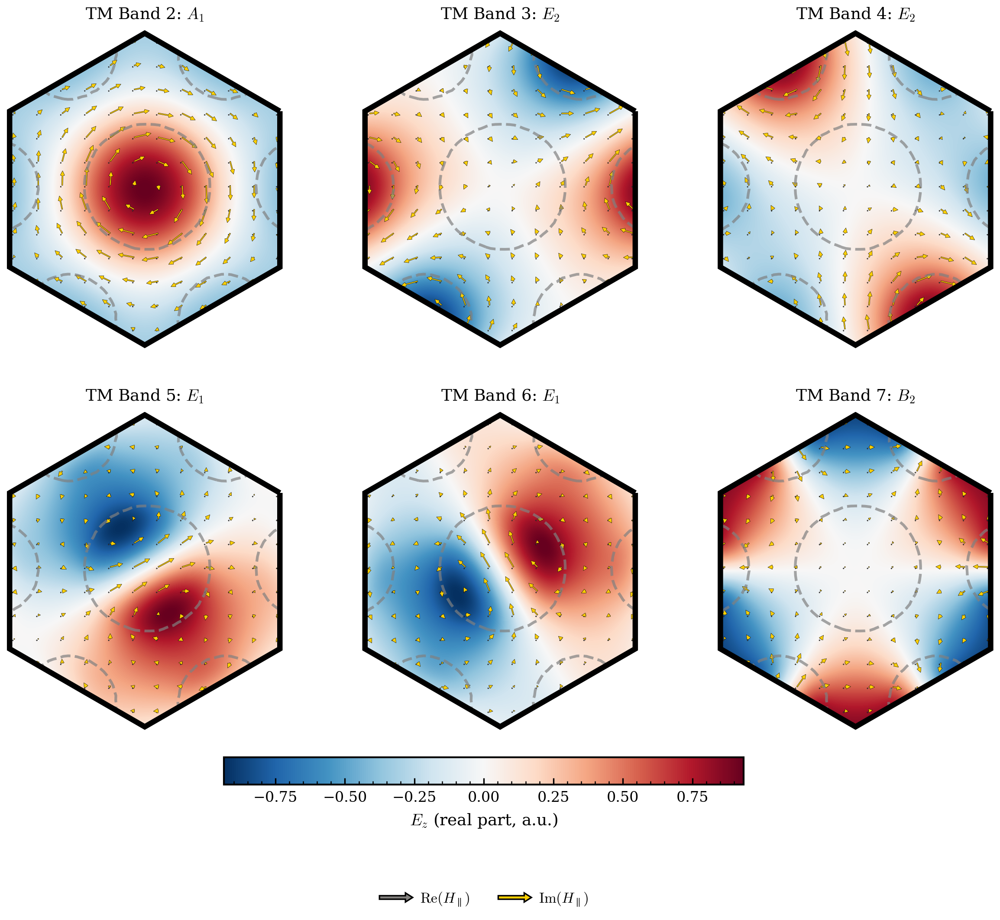

In [8]:
# Plot the eigen fields 
# Plot bands in a 2x2 grid (band 6 gets its own panel)
fig, axes = plt.subplots(2, 3, figsize=(10, 7), constrained_layout=True)
band_indices = [2,3, 4, 5, 6, 7]

import phc_nzi.simulation_viewer as sv


# ==========================================
# 1. DATA LOADING
# ==========================================
conv_opt = MPBDataOptions(rectify=True, periods=3, transpose=False, resolution=65)

loaded_fields = {}
global_vmax = 0

try:
    eps_data = simulation_2D_unoptimized.load_and_convert_epsilon_data(options=conv_opt)
except Exception:
    eps_data = None

for b_idx in band_indices:
    fz = simulation_2D_unoptimized.load_and_convert_field_data(
        k_idx_for_field_plot, b_idx, "z", "tm", "e", conversion_options=conv_opt, overwrite=True)
    fx = simulation_2D_unoptimized.load_and_convert_field_data(
        k_idx_for_field_plot, b_idx, "x", "tm", "h", conversion_options=conv_opt, overwrite=True)
    fy = simulation_2D_unoptimized.load_and_convert_field_data(
        k_idx_for_field_plot, b_idx, "y", "tm", "h", conversion_options=conv_opt, overwrite=True)
    
    loaded_fields[b_idx] = {'z': fz, 'x': fx, 'y': fy}
    
    local_max = np.max(np.abs(np.real(fz)))
    if local_max > global_vmax:
        global_vmax = local_max

# Identify the Irrep of these modes
irreps = simulation_2D_unoptimized.identify_irrep_by_band_indices(band_indices, "tm", "C6v")

axes_flat = axes.flatten()

# Plot bands 
for ax, b_idx, irrep in zip(axes_flat[:6], band_indices, irreps):
    data = loaded_fields[b_idx]
    im = sv.plot_field_quiver_on_ax(        
        field_z=data['z'],
        field_x=data['x'],
        field_y=data['y'],
        eps_data=eps_data,
        ax = ax, 
        lattice_type="hexagonal",
        step = 5
    )
    ax.set_title(f"TM Band {b_idx}: ${irrep}$")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_aspect('equal')
    ax.axis('off')

# Shared colorbar for all panels, placed at the bottom center, but not spanning the full width

# Get the position of the bottom row of axes for reference
bottom_axes = axes[1, :]


# Disable constrained layout and reserve space for the horizontal colorbar so it doesn't overlap plots
cbar_width = 0.4
cbar_height = 0.03
cbar_left = 0.5 - cbar_width / 2
cbar_bottom = 0.05
fig.set_constrained_layout(False)
bottom_margin = cbar_bottom + cbar_height + 0.02
fig.subplots_adjust(bottom=max(bottom_margin, 0.12))

# Add colorbar axes and create the shared horizontal colorbar
cbar_ax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal') 
cbar.set_label(r"$E_{z}$ (real part, a.u.)")
# # increase the font size of the colorbar ticks
# cbar.ax.tick_params(labelsize=10)
# # increase the font size of the colorbar label
# cbar.ax.xaxis.label.set_size(10)

# Arrow legend at the lower center, below the colorbar
sv.add_arrow_legend(
    fig,
    field="H",
    is_figure=True,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.1),
    # fontsize=10
)

fig7b = plt.gcf()
plt.savefig(os.path.join(figure_path, "figure_7b.pdf"))
plt.show()

### Optimization


In [9]:
# Configurations for single point evaluation
configuration_options = dict(
    resolution = RESOLUTION,
    num_bands=8,
    k_points=k_points_2D_optimized["k_points_values"],
    k_points_interpolation_factor = 20,
    extra_runner_command = "fix-efield-phase output-hfield output-efield display-symmetries-c6v display-group-velocities",
)

mpb_configuration=MPBSchemeConfigurator(
    photonic_crystal_2D, ["tm"], **configuration_options)

script = mpb_configuration.get_scheme_config(join_newline=True)

def run_simulation_task(entry, which_sim = "sim", which_param_1 = "r1", which_param_2 = "r2", mpi = False, version = "mpb-dev/1.11.2-dev"):
    return entry[which_sim].run_hpc(
        mpb_command_line_params=dict(r1=entry[which_param_1], r2=entry[which_param_2]), 
        mpi=mpi, 
        version=version
    )

# Gamma-only configuration
config_gamma_degeneracy = dict(
    resolution=RESOLUTION,
    num_bands=8,
    k_points=[mp.Vector3(0, 0, 0)],
)
mpb_config_gamma_degeneracy= MPBSchemeConfigurator(photonic_crystal_2D, ["tm"], **config_gamma_degeneracy)
script_deg = mpb_config_gamma_degeneracy.get_scheme_config(join_newline=True)


def run_sweeper_and_analyze(entry, n_r2_sweep, b_idx_top, b_idx_bot):
    try:
        data_old = entry["sim"].load_frequency_data("tm")
        # Calculate gaps at Gamma (k=0)
        # Note: Ensuring we only look at k=0 if your sweep contains multiple k-points
        gamma_data = data_old[(data_old['k1'] == 0) & (data_old['k2'] == 0)]
        gap = (gamma_data[f'tm band {b_idx_top}'] - gamma_data[f'tm band {b_idx_bot}']).abs().values[0]
        entry["gap"] = gap
        sw = entry['sweeper']
        
        # Load or Run
        if SIMULATE:
            sw.run() 
            
        # Data Extraction
        data = sw.data if len(sw.data) > 0 else sw.load_df()
        data = sw.data if len(sw.data) > 0 else sw.load_df()

        gaps = (data[f'band_{b_idx_top}'] - data[f'band_{b_idx_bot}']).abs().values

        best = int(np.argmin(gaps))
        r2_corr = entry['r2_sweep'][best]

        # Update entry with results
        entry['gap_corrected'] = gaps[best]
        entry['r2_corrected'] = r2_corr
        entry['delta_r2'] = r2_corr - entry['r2']
        entry['edge_warning'] = (best == 0 or best == n_r2_sweep - 1)

        
        return None, None
    except Exception as e:
        return None, f"Error at r1={entry['r1']}: {str(e)}"

COMMANDS ['(define-param h 1e+20)', '(define-param r1 0.1)', '(define-param r2 0.2)']
COMMANDS ['(define-param h 1e+20)', '(define-param r1 0.1)', '(define-param r2 0.2)']


#### Bands A_1 E_1

##### Find degeneracy points

In [10]:
SIMULATE = False

In [11]:
# Run Bayesian Optimization
numproc = 32
lsf_config = LSFJobConfiguration(num_processors=numproc, span_option="ptile", span_value=4, queue="hpc",   mem = "1GB")
bo_options = {
    "dimensions": [(0.05, 0.3), (0.05, 0.25)],
    "acq_func": "LCB",
    "acq_func_kwargs": {"kappa": 1},
    "n_initial_points": numproc * 10,
    "initial_point_generator": "lhs"
}

optimizer_A1_E1 = MPIBayesianOptimizator(
    simulation_name=simulation_2D_opt_345.simulation_name,
    scheme_script=simulation_2D_opt_345.script, 
    directory=simulation_2D_opt_345.directory,
    maxiter=14, 
    batch_size=numproc,
    param_names=["r1", "r2"],
    polarization="tm",
    symmetry_group="C6v",
    target_irreps=["A_1", "E_1", "E_1"], 
    irrep_occurrences=[1, 1, 1],
    bo_options=bo_options,
)
if SIMULATE is True:
    optimizer_A1_E1.erease_data_file()
    optimizer_A1_E1.submit_lsf_job(lsf_config, conda_env_name="mpb-nzi-env")

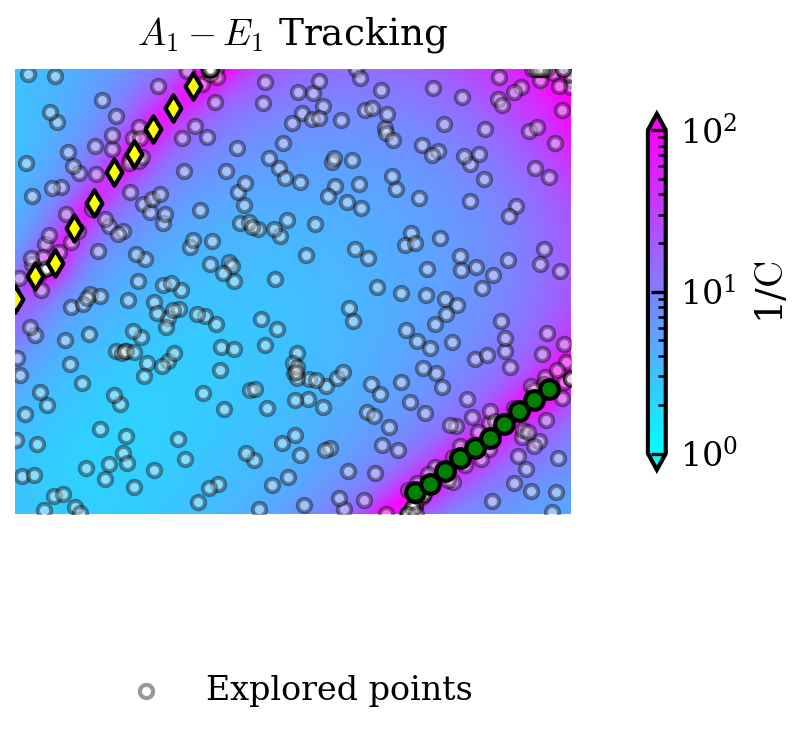

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as pe
from matplotlib.ticker import FormatStrFormatter, LogLocator, LogFormatterSciNotation
import joblib
import os

import phc_nzi.simulation_viewer as sv

# -- Left PANEL: Crystal Structure
opt_3x3 = MPBDataOptions(rectify=True, periods=3, resolution=65)
eps_3x3 = simulation_2D_unoptimized.load_and_convert_epsilon_data(options=opt_3x3)
plt.figure()
sv.plot_epsilon_on_ax(eps_3x3, lattice_type="hexagonal", interpolation = "spline36")


plt.xticks([])
plt.yticks([])
plt.title(crystal_symmetries)
ax = plt.gca()
plt.xlabel([])
plt.ylabel([])  
ax.set_aspect('equal')
ax.axis('off')

# Central Panel

# 1. Load Data and Optimizer
analyzer = OptimizationDataAnalyzer(optimizer_A1_E1.data_file)
analyzer.load_data()
loaded_optimizer = joblib.load(optimizer_A1_E1.model_file)

# Prepare predictions from the GP
gp_model = loaded_optimizer.models[-1]
valid = (analyzer.cost_vals > 0) & (~np.isnan(analyzer.cost_vals))
X_train = np.c_[analyzer.param1_vals[valid], analyzer.param2_vals[valid]]

# Setup grids for the map
r1_grid = np.linspace(0.05, 0.3, 200)
r2_grid = np.linspace(0.05, 0.25, 200)
R1, R2 = np.meshgrid(r1_grid, r2_grid)
grid_points = np.c_[R1.ravel(), R2.ravel()]

grid_points_transformed = loaded_optimizer.space.transform(grid_points)
predicted_cost = gp_model.predict(grid_points_transformed)

# Calculate the Figure of Merit
predicted_cost_safe = np.clip(predicted_cost, a_min=1e-6, a_max=None)
Predicted_FOM_2D = (1.0 / predicted_cost_safe).reshape(R1.shape)

# --- NEW: FIND 10 OPTIMAL SAMPLES FOR 0.05 < r1 < 0.14 ---
r1_samples_1 = np.linspace(0.05, 0.13, 10)
r1_samples_2 = np.linspace(0.23, 0.29, 10)
optimal_r2_points_1 = []
optimal_r2_points_2 = []    

# Dense r2 search space for high-precision extraction
r2_search = np.linspace(0.05, 0.25, 500)

for r1_val in r1_samples_1:
    # Build test points for this specific r1
    test_points = np.c_[np.full(len(r2_search), r1_val), r2_search]
    test_transformed = loaded_optimizer.space.transform(test_points)
    
    # Predict and find minimum cost (exploitation)
    costs = gp_model.predict(test_transformed)
    best_r2 = r2_search[np.argmin(costs)]
    optimal_r2_points_1.append([r1_val, best_r2])

for r1_val in r1_samples_2:
    # Build test points for this specific r1
    test_points = np.c_[np.full(len(r2_search), r1_val), r2_search]
    test_transformed = loaded_optimizer.space.transform(test_points)
    
    # Predict and find minimum cost (exploitation)
    costs = gp_model.predict(test_transformed)
    best_r2 = r2_search[np.argmin(costs)]
    optimal_r2_points_2.append([r1_val, best_r2])

branch_1 = np.array(optimal_r2_points_1)
branch_2 = np.array(optimal_r2_points_2)

# Setup LogNorm
vmin, vmax = 1e0, 1e2
log_norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)

# Initialize figure2



# ---------------------------------------------------------
# Plot: GP Surrogate
# ---------------------------------------------------------
levels = np.logspace(np.log10(vmin), np.log10(vmax), 200)
heatmap = ax.contourf(R1, R2, Predicted_FOM_2D, levels=levels, cmap="cool", norm=log_norm, extend='both')

# Plot Sampled Points (Training data)
ax.scatter(X_train[:, 0], X_train[:, 1], c='white', edgecolors='black', 
           s=10, alpha=0.4, label="Explored points")

# Plot the Optimal Samples extracted from the GP
ax.scatter(branch_1[:, 0], branch_1[:, 1], 
           color='yellow', marker='d', s=20, edgecolors='black', 
           label=None, zorder=15)
ax.scatter(branch_2[:, 0], branch_2[:, 1], 
           color='g', marker='o', s=20, edgecolors='black', 
           label=None, zorder=15)

ax.set_xlabel("$r_1/a$")
ax.set_ylabel("$r_2/a$")
ax.set_title(r"$A_1-E_1$ Tracking")
ax.grid(alpha=0.3)
ax.set_aspect('equal')
ax.set_xlim(0.05, 0.3)
ax.set_ylim(0.05, 0.25)

# Formatting ticks
ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

# Colorbar setup
cbar = plt.gcf().colorbar(heatmap, ax=plt.gca(), extend='both', fraction=0.046, pad=0.1, shrink=0.8, format=LogFormatterSciNotation())
cbar.set_label(r"1/$\mathrm{C}$")
cbar.locator = LogLocator(base=10.0, numticks=6)
cbar.update_ticks()
cbar.ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(2, 10), numticks=12))
plt.tight_layout(pad=1.5, w_pad=0.35)

# Legend
ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.5), ncol=1, framealpha=0.95, edgecolor='black')

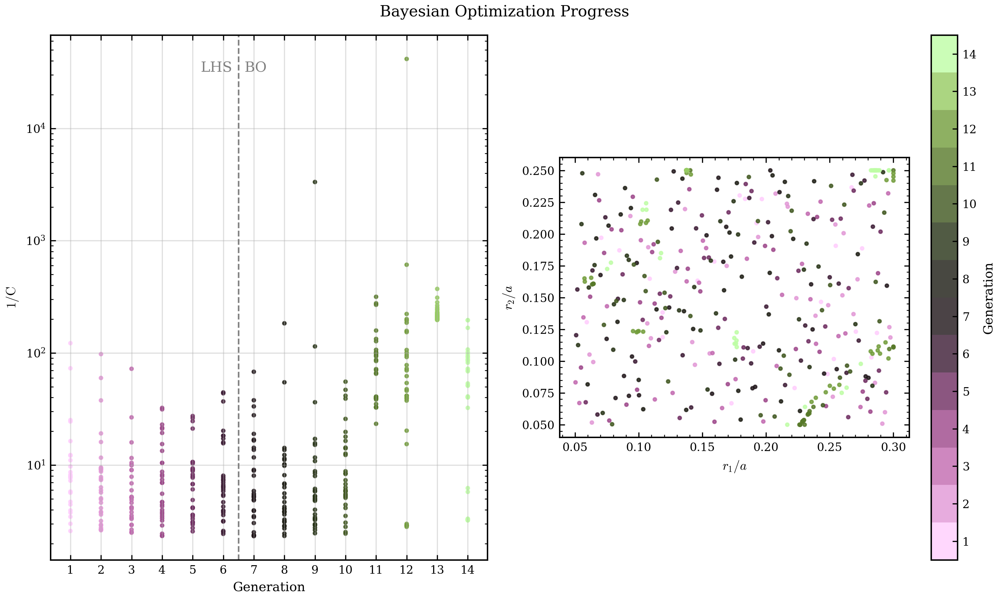

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.ticker import MultipleLocator, NullLocator

# Plot the points in the r1-r2 plane, colored by the generation in which they were evaluated
plt.figure(figsize=(10,6))
analyzer.load_data()  # Ensure data is loaded before plotting
df = analyzer.get_points_above_treshold(0)

# Count generations from 1 instead of 0
if df["Gen"].min() == 0:
    df["Gen"] = df["Gen"] + 1

s = 5
# Suptitle
plt.suptitle(
    "Bayesian Optimization Progress"
)

# Determine strictly integer min and max generations
min_gen = int(df["Gen"].min())
max_gen = max(int(df["Gen"].max()), 10)

# Pad vmin and vmax by 0.5. 
v_min = min_gen - 0.5
v_max = max_gen + 0.5

# Use standard Normalize instead of TwoSlopeNorm for uniformly spaced ticks
norm = mcolors.Normalize(vmin=v_min, vmax=v_max)

# Calculate exact number of distinct color blocks needed
num_colors = max_gen - min_gen + 1
cmap = plt.get_cmap("vanimo", num_colors)  

# --- LEFT PLOT ---
plt.subplot(1, 2, 1)
plt.scatter(df["Gen"], 1/(df["cost"]), c=df["Gen"], cmap=cmap, norm=norm, s=s, alpha=0.8)

plt.xlabel("Generation")
plt.ylabel(r"$1/\mathrm{C}$")
plt.yscale('log')
plt.grid(alpha=0.4)

# Force x-axis to tick exactly at every integer and remove minor ticks
plt.gca().xaxis.set_major_locator(MultipleLocator(1))
plt.gca().xaxis.set_minor_locator(NullLocator())

# Vertical line at 6.5 to show start of BO phase (after 6 initial random points)
plt.axvline(6.5, color='gray', linestyle='--')
# "LHS" to the left of the line
plt.text(6.3, 0.95, "LHS", ha='right', va='top', fontsize=10, 
        color='gray', transform=plt.gca().get_xaxis_transform())

# "BO" to the right of the line
plt.text(6.7, 0.95, "BO", ha='left', va='top', fontsize=10, 
        color='gray', transform=plt.gca().get_xaxis_transform())

# --- RIGHT PLOT ---
plt.subplot(1, 2, 2)
scatter = plt.scatter(df["r1"], df["r2"], c=df["Gen"], cmap=cmap, norm=norm, s=s, alpha=0.8)

# Colorbar tick centering and minor tick removal
cbar = plt.colorbar(scatter, label="Generation")
cbar.set_ticks(np.arange(min_gen, max_gen + 1))
cbar.ax.yaxis.set_minor_locator(NullLocator())

plt.xlabel("$r_1/a$")
plt.ylabel("$r_2/a$")
plt.gca().set_aspect('equal')

plt.tight_layout()
plt.show()

In [14]:
import os
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.auto import tqdm

# --- 1. Prevent HDF5 locking collisions ---
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"

# Initialize the entries
# For these entries the band gap is almost closed but is better to fine tune the parameters
entries_branch_1 = []
for pt in branch_1:
    r1, r2 = pt
    folder_name = name_2D_optimized + "_r1_{r1:.3f}_r2_{r2:.3f}".format(r1=r1, r2=r2)
    sim = Simulation(
        simulation_name=folder_name,
        script=script,
        directory=os.path.join(data_rooth, folder_name)
    )
    entries_branch_1.append({
        "r1": r1,
        "r2": r2,
        "sim": sim
    })

entries_branch_2 = []
for pt in branch_2:
    r1, r2 = pt
    folder_name = name_2D_optimized + "_r1_{r1:.3f}_r2_{r2:.3f}".format(r1=r1, r2=r2)
    sim = Simulation(
        simulation_name=folder_name,
        script=script,
        directory=os.path.join(data_rooth, folder_name)
    )
    entries_branch_2.append({
        "r1": r1,
        "r2": r2,
        "sim": sim
    })


# Execute concurrently
if SIMULATE is True:
    # Set worker count (adjust based on your machine's capabilities)
    N_WORKERS = 20
    
    with ThreadPoolExecutor(max_workers=N_WORKERS) as executor:
        # Create a dictionary mapping futures to entries
        futures = {executor.submit(run_simulation_task, entry): entry for entry in entries_branch_1+entries_branch_2}
        
        # Wrap the completion generator with tqdm for the progress bar
        for future in tqdm(as_completed(futures), total=len(futures), desc="Running Simulations"):
            entry = futures[future]
            try:
                future.result() 
            except Exception as e:
                # Use tqdm.write to avoid breaking the progress bar visually
                tqdm.write(f"Simulation failed for r1={entry['r1']}, r2={entry['r2']}: {e}")


# Display the irreps for the target bands so that we can make sure to close the gap 
# between the correct bands in the next optimization iteration
for entry in entries_branch_1 + entries_branch_2:
    sim = entry["sim"]
    irreps = sim.identify_irrep_by_band_indices([2,3,4,5,6,7], "tm", "C6v")
    entry["irreps"] = irreps
    print(f"r1={entry['r1']:.3f}, r2={entry['r2']:.3f} -> Irreps: {irreps}")


r1=0.050, r2=0.147 -> Irreps: ['E_2', 'E_2', 'B_2', 'E_1', 'E_1', 'A_1']
r1=0.059, r2=0.157 -> Irreps: ['E_2', 'E_2', 'B_2', 'E_1', 'E_1', 'A_1']
r1=0.068, r2=0.163 -> Irreps: ['E_2', 'E_2', 'B_2', 'A_1', 'E_1', 'E_1']
r1=0.077, r2=0.179 -> Irreps: ['E_2', 'E_2', 'B_2', 'A_1', 'E_1', 'E_1']
r1=0.086, r2=0.190 -> Irreps: ['E_2', 'E_2', 'B_2', 'A_1', 'E_1', 'E_1']
r1=0.094, r2=0.204 -> Irreps: ['E_2', 'E_2', 'B_2', 'E_1', 'E_1', 'A_1']
r1=0.103, r2=0.212 -> Irreps: ['E_2', 'E_2', 'B_2', 'A_1', 'E_1', 'E_1']
r1=0.112, r2=0.223 -> Irreps: ['E_2', 'E_2', 'B_2', 'E_1', 'E_1', 'A_1']
r1=0.121, r2=0.233 -> Irreps: ['E_2', 'E_2', 'B_2', 'E_1', 'E_1', 'A_1']
r1=0.130, r2=0.242 -> Irreps: ['E_2', 'E_2', 'B_2', 'E_1', 'E_1', 'A_1']
r1=0.230, r2=0.060 -> Irreps: ['A_1', 'E_1', 'E_1', 'E_2', 'E_2', 'E_2']
r1=0.237, r2=0.064 -> Irreps: ['E_1', 'E_1', 'A_1', 'E_2', 'E_2', 'E_2']
r1=0.243, r2=0.069 -> Irreps: ['E_1', 'E_1', 'A_1', 'E_2', 'E_2', 'E_2']
r1=0.250, r2=0.075 -> Irreps: ['A_1', 'E_1', 'E_1',

In [15]:
for entry in entries_branch_1: 
    entry["target_b_idxes"] = [5,6,7]
for entry in entries_branch_2:
    entry["target_b_idxes"] = [2,3,4]

Sweeping r2 for 20 entries (SIMULATE=False)


Refining Degeneracy:   0%|          | 0/20 [00:00<?, ?it/s]

[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]


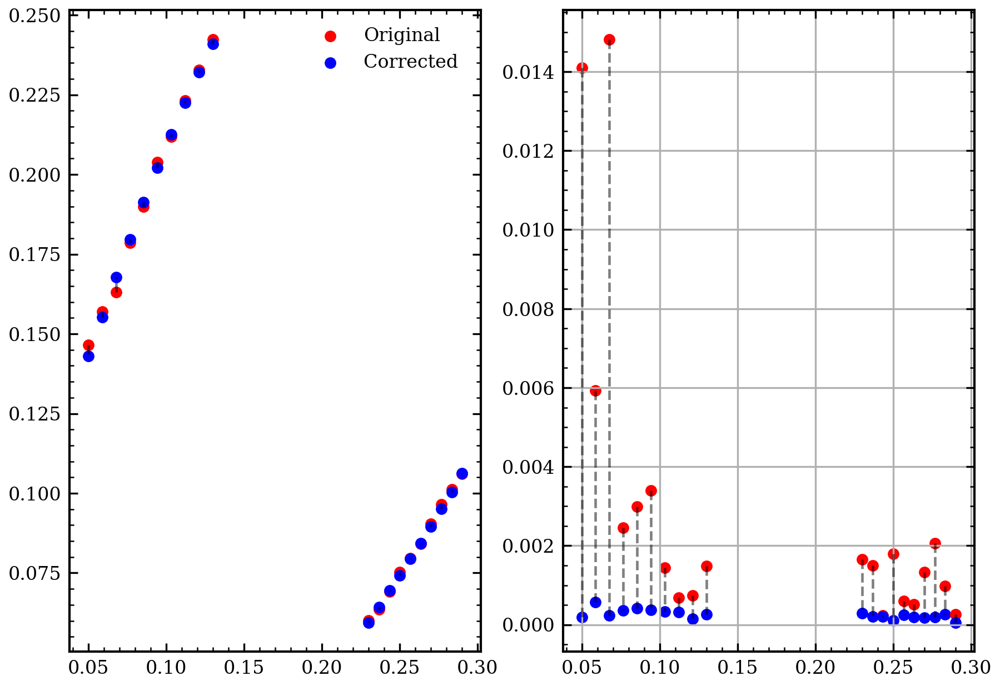

In [16]:
import time
import pandas as pd
import numpy as np
import os
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.auto import tqdm 
from phc_nzi.sweeper import ParamSweeper

entries = entries_branch_1 + entries_branch_2

n_r2_sweep = 50          # number of r2 values per point
r2_half_width = 0.01     # search range: r2_original ± this
N_WORKERS = 32           # number of sweepers to run in parallel

# Prepare entries with sweepers
for i, entry in enumerate(entries_branch_1 + entries_branch_2):
    r1_i = entry['r1']
    r2_orig = entry['r2']
    r2_lo, r2_hi = (r2_orig - r2_half_width), (r2_orig + r2_half_width)
    r2_sweep = np.linspace(r2_lo, r2_hi, n_r2_sweep)
    
    folder_name = f"{name_2D_optimized}_r1_{r1_i:.3f}_r2_{r2_orig:.3f}_deg"
    
    sim_deg = Simulation(
        simulation_name=folder_name,
        script=script_deg,
        directory=os.path.join(data_rooth, folder_name)
    )
    
    entry['sweeper'] = ParamSweeper(
        simulation=sim_deg,
        param_name="r2",
        values=r2_sweep.tolist(),
        polarization="tm",
        bands=entry["target_b_idxes"],
        other_command_line_params={"r1": r1_i}
    )
    entry['r2_sweep'] = r2_sweep
    entry['idx'] = i

# --- 3. PARALLEL EXECUTION ---

print(f"Sweeping r2 for {len(entries)} entries (SIMULATE={SIMULATE})")

with ThreadPoolExecutor(max_workers=N_WORKERS) as pool:
    # Submit tasks
    future_to_entry = {pool.submit(run_sweeper_and_analyze, e, n_r2_sweep, np.max(e["target_b_idxes"]), np.min(e["target_b_idxes"])): e for e in entries}
    # Progress bar
    with tqdm(total=len(entries), desc="Refining Degeneracy") as pbar:
        for fut in as_completed(future_to_entry):
            res, error = fut.result()
            if error:
                tqdm.write(f"Error: {error}")
            pbar.update(1)

plt.figure(figsize=(7,5))
plt.subplot(1, 2, 1)
for i, entry in enumerate(entries):
    plt.scatter(entry['r1'], entry['r2'], c= "r", label=f"Original" if i == 0 else None)
    plt.scatter(entry['r1'], entry['r2_corrected'], c="b", label=f"Corrected " if i==0 else None)
    plt.plot([entry['r1'], entry['r1']], [entry['r2'], entry['r2_corrected']], 'k--', alpha=0.5, label = None)
    plt.legend()

plt.subplot(1, 2, 2)
for entry in entries:
    plt.scatter(entry['r1'], entry['gap'], c= "r", label=None)
    plt.scatter(entry['r1'], entry['gap_corrected'], c="b", label=None)
    plt.plot([entry['r1'], entry['r1']], [entry['gap'], entry['gap_corrected']], 'k--', alpha=0.5, label = None)
    plt.yscale("linear")
    plt.grid(True)
print([e["edge_warning"] for e in entries])

In [17]:
import os
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.auto import tqdm

# --- 1. Prevent HDF5 locking collisions ---
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"

# --- 2. Prepare entries with UNIQUE directories ---
for entry in entries:
    r1_val = entry['r1']
    r2_val = entry['r2_corrected']
    
    # Generate a unique folder for each thread to prevent file locks
    unique_folder = f"{name_2D_optimized}_r1_{r1_val:.3f}_r2_{r2_val:.3f}_corr"
    
    sim = Simulation(
        simulation_name=unique_folder,
        script=script, 
        directory=os.path.join(data_rooth, unique_folder)
    )
    entry["sim_corrected"] = sim

# --- 3. Execute concurrently with Threads ---
if SIMULATE is True:
    # Set worker count (adjust this if 32 is too heavy for your RAM)
    N_WORKERS = 32
    
    with ThreadPoolExecutor(max_workers=N_WORKERS) as executor:
        # Create a dictionary mapping futures to entries
        futures = {
            executor.submit(run_simulation_task, entry, "sim_corrected", "r1", "r2_corrected"): entry 
            for entry in entries
        }
        
        # Wrap the completion generator with tqdm for the progress bar
        for future in tqdm(as_completed(futures), total=len(futures), desc="Running Corrected Sims"):
            entry = futures[future]
            try:
                future.result() 
            except Exception as e:
                # Use tqdm.write to avoid breaking the progress bar visually
                tqdm.write(f"Simulation failed for r1={entry['r1']}, r2={entry['r2_corrected']}: {e}")



In [18]:
def extract_group_velocity(self, which_parity:str, k_idx:int, b_idx:int):
    """
    Extracts the group velocity vector for a specific k-point and band from an MPB log file.
    
    Parameters:
        filepath (str): Path to the MPB output log file.
        which_parity (str): either "te" "tm" "zeven" "zodd"
        k_idx (int): The 1-based index of the k-point (as printed in the file).
        b_idx (int): The 1-based index of the band.
        
    Returns:
        tuple: (v_x, v_y, v_z) as floats, or None if not found.
    """
    filepath = os.path.join(self.directory, self.output_filename)
    with open(filepath, 'r') as file:
        for line in file:
            # Look for lines containing the velocity data
            if line.startswith(f"{which_parity}velocity:,"):
                parts = line.strip().split(',')
                
                # parts[0] is the prefix, parts[1] is the k_idx
                current_k_index = int(parts[1].strip())
                
                if current_k_index == k_idx:
                    # The band vectors start at index 2. 
                    # So, Band 1 -> parts[2], Band 2 -> parts[3], etc.
                    try:
                        vector_str = parts[b_idx + 1].strip()
                    except IndexError:
                        raise ValueError(f"Band {b_idx} not found for k-point {k_idx}.")
                    
                    # Clean the string: remove '#(' and ')' then split by spaces
                    vector_str = vector_str.replace("#(", "").replace(")", "").strip()
                    v_x, v_y, v_z = vector_str.split()
                    
                    return float(v_x), float(v_y), float(v_z)
                    
    print(f"k-point {k_idx} not found in the file.")
    return None



vgs = []
ffs = []
df = entries[0]["sim_corrected"].load_frequency_data("tm")
gamma_idx = df.loc[(df["k1"] == 0) & (df["k2"] == 0), "k index"].iloc[0]
k_vg_idx = gamma_idx - 1
for entry in entries:
    try:
        r1 = entry["r1"]
        r2 = entry["r2_corrected"]
        eps = entry["sim_corrected"].load_and_convert_epsilon_data(MPBDataOptions(rectify=False))
        # Compute the filling fraction where eps>1.2 vs total area of eps
        filling_fraction = calculate_filling_factor_from_distribution(eps, (1+eps_si)/2)
        vg = extract_group_velocity(entry["sim_corrected"],"tm",k_idx=k_vg_idx, b_idx=np.max(entry["target_b_idxes"]))
        entry["group_velocity"] = vg
        vgs.append(np.sqrt(vg[0]**2 + vg[1]**2 + vg[2]**2))
        entry["filling_factor"] = filling_fraction
        ffs.append(filling_fraction)
    except:
        print(f"Failed to extract data for r1={r1}, r2={r2}")

ffs_branch_1 = ffs[:len(entries_branch_1)]   
ffs_branch_2 = ffs[len(entries_branch_1):len(entries_branch_1)+len(entries_branch_2)]
vgs_branch_1 = vgs[:len(entries_branch_1)]
vgs_branch_2 = vgs[len(entries_branch_1):len(entries_branch_1)+len(entries_branch_2)]

##### Figure 8

/zhome/2f/7/202918/miniconda3/envs/mpb-nzi-env/lib/python3.11/site-packages/IPython/core/events.py:96: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  func(*args, **kwargs)
/zhome/2f/7/202918/miniconda3/envs/mpb-nzi-env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


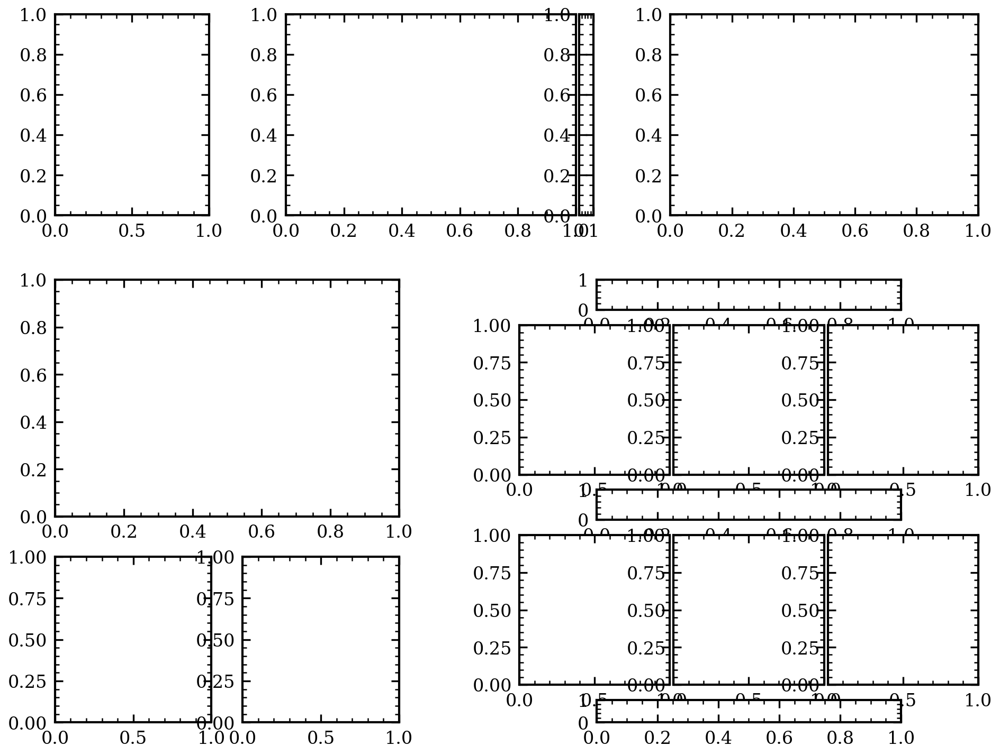

In [19]:

fig8 = plt.figure(figsize = (7.5,5.8), layout = "constrained")



# fig8.get_layout_engine().set(w_pad=0.2, h_pad=0.2)
gs_master = fig8.add_gridspec(2, 3, hspace = 0.2, height_ratios=[1, 2.2])

# One subgrid for each of the 6 panels (a-f)
wr = [1, 0.05]
gs_top = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=gs_master[0, :], width_ratios=[1, 2, 2], wspace = 0.3)
gs_bot = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_master[1, :], width_ratios=[1.5, 2], wspace = 0.3)
gs_d = gridspec.GridSpecFromSubplotSpec(2, 2, subplot_spec=gs_bot[0, 0], height_ratios=[1, 0.7])
gs_e = gridspec.GridSpecFromSubplotSpec(5, 6, subplot_spec=gs_bot[0,1], height_ratios = [0.2, 1, 0.2, 1, 0.15],wspace=0.05)

gs_b = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_top[0, 1], width_ratios=wr, wspace = 0.02)

ax_a = fig8.add_subplot(gs_top[0, 0])
ax_b = fig8.add_subplot(gs_b[0, 0])
ax_b_cax = fig8.add_subplot(gs_b[0,1]) 
ax_c = fig8.add_subplot(gs_top[0, 2])   
ax_d_band = fig8.add_subplot(gs_d[0, 0:2])
ax_d_lat = fig8.add_subplot(gs_d[1,0])
ax_d_bz  = fig8.add_subplot(gs_d[1,1])
ax_e_t1 = fig8.add_subplot(gs_e[0, 1:5])
ax_e1_bb = fig8.add_subplot(gs_e[1, 0:2])
ax_e1_bm = fig8.add_subplot(gs_e[1, 2:4])
ax_e1_bt = fig8.add_subplot(gs_e[1, 4:6])
ax_e_t2 = fig8.add_subplot(gs_e[2, 1:5])
ax_e2_bb = fig8.add_subplot(gs_e[3, 0:2])
ax_e2_bm = fig8.add_subplot(gs_e[3, 2:4])
ax_e2_bt = fig8.add_subplot(gs_e[3, 4:6])
ax_e_cax = fig8.add_subplot(gs_e[4,1:5])



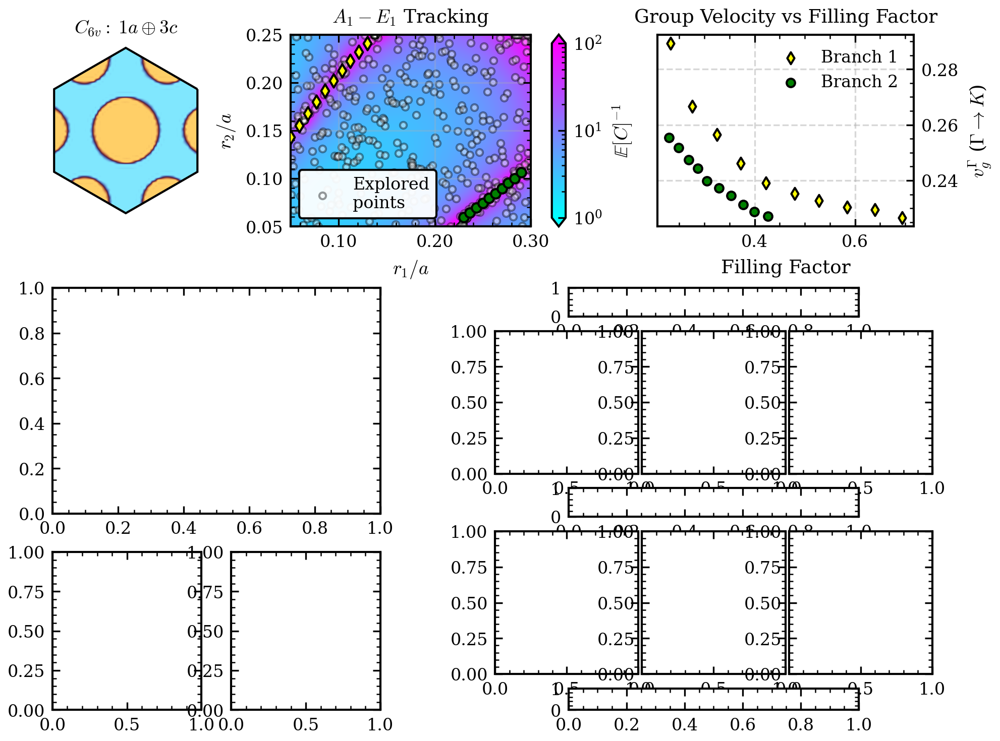

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as pe
from matplotlib.ticker import FormatStrFormatter, LogLocator, LogFormatterSciNotation
import joblib
import os
import matplotlib.gridspec as gridspec
import phc_nzi.simulation_viewer as sv

# --- PLOTTING ROW 1 ---

# Left PANEL: Crystal Structure
opt_3x3 = MPBDataOptions(rectify=True, periods=3, resolution=65)
eps_3x3 = simulation_2D_unoptimized.load_and_convert_epsilon_data(options=opt_3x3)
ax_a.clear()
ax_b.clear()
ax_c.clear()
plt.sca(ax_a) 
sv.plot_epsilon_on_ax(eps_3x3, lattice_type="hexagonal", interpolation="spline36", ws_lw = 1)
plt.xticks([])
plt.yticks([])
plt.title(crystal_symmetries)
ax_a.set_aspect('equal')
ax_a.axis('off')

# Central Panel GP Surrogate Map
plt.sca(ax_b)
levels = np.logspace(np.log10(vmin), np.log10(vmax), 200)
heatmap = plt.contourf(R1, R2, Predicted_FOM_2D, levels=levels, cmap="cool", norm=log_norm, extend='both')
plt.scatter(X_train[:, 0], X_train[:, 1], c='white', edgecolors='black', s=10, alpha=0.4, label="Explored\npoints")

for entry in entries_branch_1:
    plt.scatter(entry['r1'], entry['r2_corrected'], marker="d", c="yellow", edgecolors='black', s=20, zorder=15)
for entry in entries_branch_2:
    plt.scatter(entry['r1'], entry['r2_corrected'], marker="o", c="g", edgecolors='black', s=20, zorder=15)

ax_b.set_xlabel("$r_1/a$")
ax_b.set_ylabel("$r_2/a$")
ax_b.set_title(r"$A_1-E_1$ Tracking")
ax_b.grid(alpha=0.3)
ax_b.set_aspect('equal')
ax_b.set_xlim(0.05, 0.3)
ax_b.set_ylim(0.05, 0.25)
ax_b.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_b.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

cbar = fig8.colorbar(heatmap, cax=ax_b_cax, extend='both', fraction=0.046, pad=0.1, shrink=0.8, format=LogFormatterSciNotation())
cbar.set_label(r"$\mathbb{E}[C]^{-1}$")
cbar.locator = LogLocator(base=10.0, numticks=6)
cbar.update_ticks()
cbar.ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(2, 10), numticks=12))
ax_b.legend(loc='lower left', frameon=True, framealpha=0.95, edgecolor='black')

# Right panel: Group Velocity vs Filling Factor
plt.sca(ax_c)
ax_c.set_axisbelow(True)
plt.scatter(ffs_branch_1, vgs_branch_1, marker='d', color="yellow", edgecolors="black", label="Branch 1")
plt.scatter(ffs_branch_2, vgs_branch_2, marker='o', color="green", edgecolors="black", label="Branch 2")
plt.legend()
plt.grid(linestyle='--', alpha=0.5)
plt.xlabel("Filling Factor")
plt.ylabel(r"$v_{g}^\Gamma$ ($\Gamma \to K$)")
plt.yscale("linear")
plt.title("Group Velocity vs Filling Factor")
ax_c.set_box_aspect(0.75)
plt.gca().yaxis.set_label_position("right")
plt.gca().yaxis.tick_right()
display(fig8)

22
4
Analytical Cartesian vg_x slopes: [ 3.64892863e-02 -3.64871013e-02  6.54317221e-07]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
/zhome/2f/7/202918/miniconda3/envs/mpb-nzi-env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


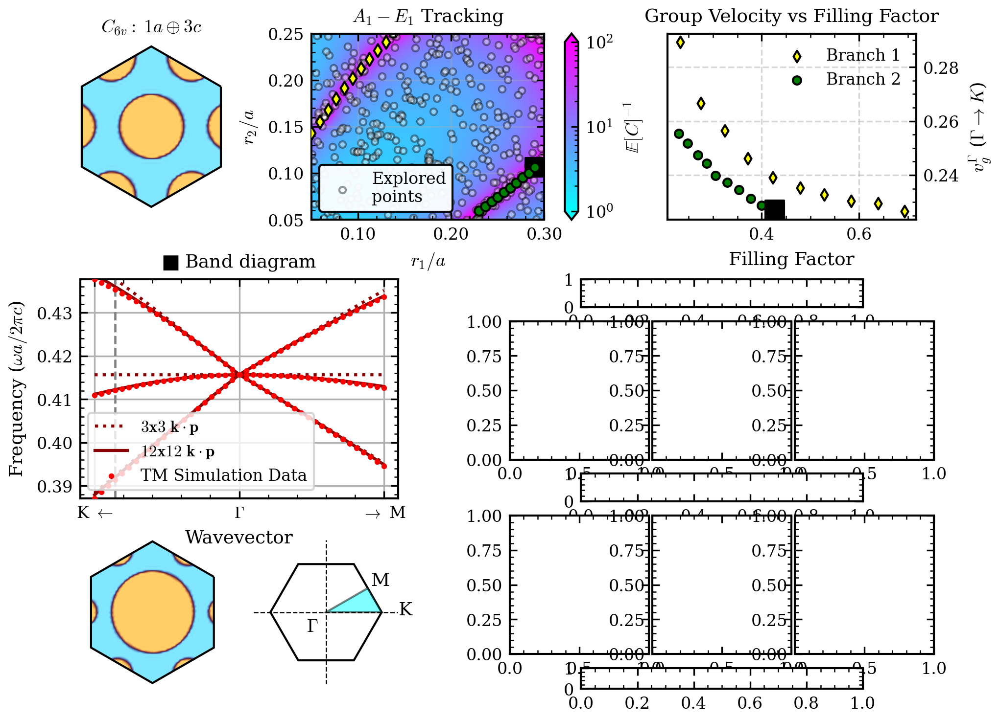

/zhome/2f/7/202918/miniconda3/envs/mpb-nzi-env/lib/python3.11/site-packages/IPython/core/events.py:96: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  func(*args, **kwargs)


In [21]:
import phc_nzi.pt_solver as pt_solver
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches

ax_d_band.clear()
ax_d_lat.clear()
ax_d_bz.clear()

# Find idx of the entry with the highest group velocity
i = np.argmax(ffs_branch_2)
entry = entries_branch_2[i]
sim = entry["sim_corrected"]
df = sim.load_frequency_data("tm")
irrpes = sim.identify_irrep_by_band_indices([1,2,3,4,5,6,7], "tm", "C6v")
gamma_idx_condition = (df["k1"] == 0) & (df["k2"] == 0)
gamma_idx = df.loc[gamma_idx_condition, "k index"].values[0]
idx_max = np.argmin(np.abs(df["kmag/2pi"]-0.1))
far_k_idx = int(df.iloc[idx_max]["k index"])
far_k_kmag2pi = df.iloc[idx_max]["kmag/2pi"]
r1 = entry["r1"]
r2 = entry["r2_corrected"]
data_line = rf"$r_1={r1:0.3f}a$, $r_2={r2:0.3f}a$, $FF={calculate_filling_factor(r1, r2):0.3f}$ $\varepsilon={eps_si}$"

print(gamma_idx)
print(far_k_idx)

# --- Configuration ---
b_idxes = [2, 3, 4, 5, 6, 7, 8]
triplet_bands = entry["target_b_idxes"]
parity = "tm"
lattice = "hexagonal"

# Map the physical band numbers to their index in the matrix
triplet_indices = [b_idxes.index(b) for b in triplet_bands]

# --- 1. Get Gamma State & Matrices ---
omega_0s = [df.loc[df["k index"] == gamma_idx, f"{parity} band {b}"].values[0] for b in b_idxes]

fields, eps_data = pt_solver.load_mpb_data(sim, gamma_idx, b_idxes, parity)
p_matrix, q_matrix = pt_solver.calculate_pt_matrices(fields, eps_data, parity, lattice)

# --- 2. Calculate Dispersion (Full & Reduced) ---
bands_full = pt_solver.calculate_perturbed_bands(
    p_matrix, q_matrix, omega_0s, 
    k1_arr=df["k1"].values, k2_arr=df["k2"].values, 
    kmag_arr=df["kmag/2pi"].values, lattice_type=lattice
)

bands_reduced = pt_solver.calculate_reduced_bands(
    p_matrix, omega_0s, 
    k1_arr=df["k1"].values, k2_arr=df["k2"].values, 
    kmag_arr=df["kmag/2pi"].values, 
    lattice_type=lattice, target_indices=triplet_indices
)

# --- 3. Cartesian Group Velocity ---
vg_x, vg_y = pt_solver.calculate_group_velocity_tensor(p_matrix, omega_0s, triplet_indices)
print(f"Analytical Cartesian vg_x slopes: {np.real(np.linalg.eigvals(vg_x))}")

import matplotlib.gridspec as gridspec
import matplotlib.patches as patches

# -- 0. Calculate Unified X-Axis for Path --
kx_mpb = df["k1"].values
ky_mpb = df["k2"].values

dkx = np.diff(kx_mpb); dky = np.diff(ky_mpb)
x_plot = np.concatenate(([0], np.cumsum(np.sqrt(dkx**2 + dky**2))))
x_plot -= x_plot[np.argmin(kx_mpb**2 + ky_mpb**2)]

target_x = x_plot[far_k_idx-1]

# Create a figure
# fig = plt.figure(figsize=(WIDTH_1*1.3, HEIGHT_1), constrained_layout=True, dpi=600)
# gs = gridspec.GridSpec(2, 3, figure=fig)

# ==========================================
# -- 1. LEFT PANEL: Band Diagram --
# ==========================================
plt.sca(ax_d_band)

# Plot REDUCED Linear Theory bands
plt.plot(x_plot, bands_reduced[:, 0], ':', color='darkred', linewidth=1.5, 
         label=r"$\mathbf{3x3 \ k \cdot p}$")
plt.plot(x_plot, bands_reduced[:, 1:], ':', color='darkred', linewidth=1.5)

# Plot FULL Perturbation Theory bands (Solid Dark Red)
plt.plot(x_plot, bands_full[:, 0], '-', color='darkred', linewidth=1.5, 
         label=r"$\mathbf{12x12 \ k \cdot p}$")
plt.plot(x_plot, bands_full[:, 1:], '-', color='darkred', linewidth=1.5)

# Plot ALL original MPB simulation data points
for i, b in enumerate(b_idxes):
    lbl = "TM Simulation Data" if i == 0 else None
    plt.scatter(x_plot, df[f"tm band {b}"], color='r', s=3, zorder=3, label=lbl)

ymin = np.min(df[f"tm band {np.min(entry['target_b_idxes'])}"].values)
ymax = np.max(df[f"tm band {np.max(entry['target_b_idxes'])}"].values)
plt.ylim(ymin, ymax)

plt.xlabel('Wavevector')
plt.ylabel(r'Frequency ($\omega a / 2\pi c$)')
plt.xticks([x_plot.min(), 0, x_plot.max()], ['K $\leftarrow$', r'$\Gamma$', r'$\rightarrow$ M'])
plt.grid(True)
plt.legend(frameon=True, fontsize=8, loc='best')

plt.title(r"$\blacksquare$ Band diagram")
plt.vlines(target_x, ymin, ymax, colors="gray", linestyles="--", label=None)

# ==========================================
# -- 2. TOP RIGHT: Square Lattice --
# ==========================================
opt = MPBDataOptions(rectify=True, periods=3, resolution = 65)
eps = sim.load_and_convert_epsilon_data(options=opt)
plt.sca(ax_d_lat)
sv.plot_epsilon_on_ax(eps, lattice_type="hexagonal", ws_lw = 1, interpolation = "spline36")
plt.xticks([])
plt.yticks([])
plt.xlabel([])
plt.ylabel([])  
plt.gca().set_box_aspect(1)
plt.gca().axis('off')

# ==========================================
# -- 3. BOTTOM RIGHT: Brillouin Zone --
# ==========================================
plt.sca(ax_d_bz)
angles = np.linspace(0, 2*np.pi, 7)
plt.gca().add_patch(patches.Polygon([[np.cos(a), np.sin(a)] for a in angles], fill=False, edgecolor='black', linewidth=1))

m_x, m_y = np.cos(np.pi/6) * (np.sqrt(3)/2), np.sin(np.pi/6) * (np.sqrt(3)/2)
plt.gca().add_patch(patches.Polygon([[0, 0], [1, 0], [m_x, m_y]], closed=True, fill=True, facecolor='cyan', alpha=0.5, edgecolor='black'))

plt.axhline(0, color='black', linewidth=0.6, linestyle='--')
plt.axvline(0, color='black', linewidth=0.6, linestyle='--')

plt.text(-0.35, -0.35, r'$\Gamma$')
plt.text(1.3, -0.05, 'K')    
plt.text(m_x + 0.05, m_y + 0.05, 'M')

limit = 1.3
plt.xlim(-limit, limit); plt.ylim(-limit, limit)
plt.gca().set_box_aspect(1)

ax_bz = plt.gca()
for spine in ax_bz.spines.values(): spine.set_visible(False)
ax_bz.tick_params(which='both', bottom=False, top=False, left=False, right=False)
ax_bz.set_xticklabels([]); ax_bz.set_yticklabels([])
ax_bz.set_xlabel(r"$k_x$"); ax_bz.set_ylabel(r"$k_y$", rotation=0)
ax_bz.axis('off')


# Highlight the point with a star in ax_b and ax_c
ax_b.scatter(entry['r1'], entry['r2_corrected'], marker='s', color='black', s=80, zorder=10)
ax_c.scatter(entry['filling_factor'], np.linalg.norm(entry['group_velocity']), marker='s', color='black', s=80, zorder=10)


display(fig8)

In [22]:

# ==========================================
# 1. DATA LOADING
# ==========================================
conv_opt = MPBDataOptions(rectify=True, periods=3, transpose=False, resolution=65)

loaded_fields = {}
loaded_fields_far_k = {}
global_vmax = 0

try:
    eps_data = sim.load_and_convert_epsilon_data(options=conv_opt)
except Exception:
    eps_data = None

# Extract data at Gamma
for b_idx in entry["target_b_idxes"]:
    fz = sim.load_and_convert_field_data(
        gamma_idx, b_idx, "z", "tm", "e", conversion_options=conv_opt, overwrite=True)
    
    
    loaded_fields[b_idx] = {'z': fz, 'x': None, 'y': None}
    
    local_max = np.max(np.abs(np.real(fz)))
    if local_max > global_vmax:
        global_vmax = local_max

# Identify the Irrep of these modes
irreps = sim.identify_irrep_by_band_indices(entry["target_b_idxes"], "tm", "C6v")

#Extract data for far k point
for b_idx in entry["target_b_idxes"]:
    fz = sim.load_and_convert_field_data(
        far_k_idx, b_idx, "z", "tm", "e", conversion_options=conv_opt, overwrite=True)

    
    loaded_fields_far_k[b_idx] = {'z': fz, 'x': None, 'y': None}
    
    local_max = np.max(np.abs(np.real(fz)))
    if local_max > global_vmax:
        global_vmax = local_max



Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


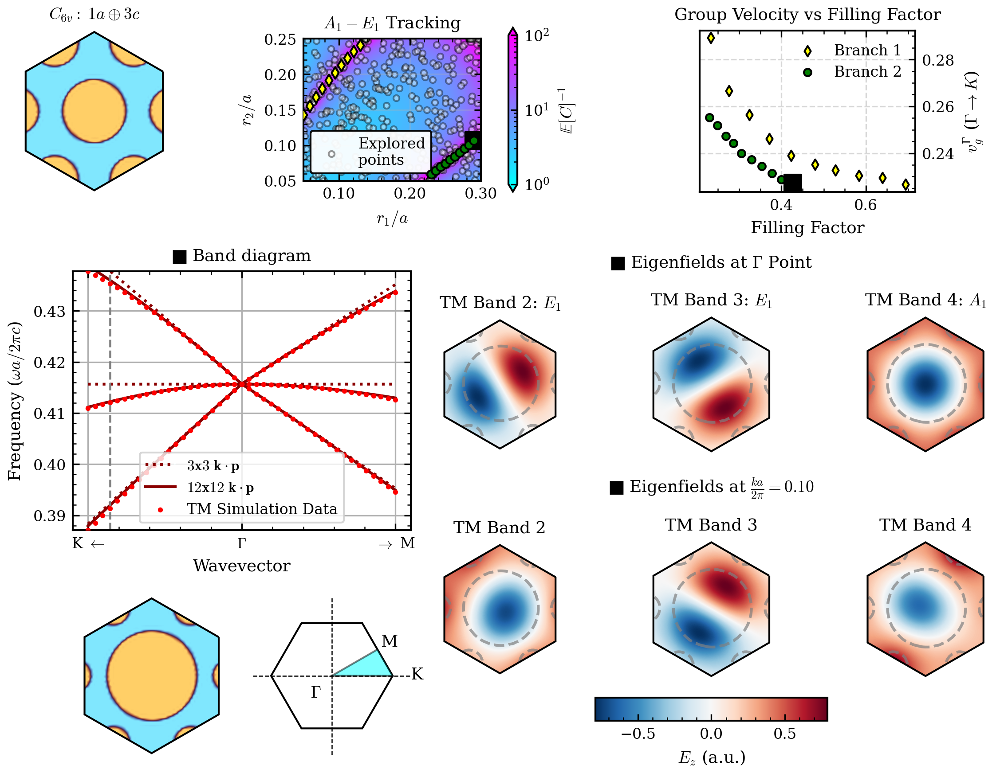

In [23]:
import phc_nzi.simulation_viewer as sv
# ---------------------------------------------------------
# PLOTTING LOGIC FOR PANEL (e)
# ---------------------------------------------------------
# Create 2 rows inside the subfigure
ax_e_t1.clear()
ax_e_t2.clear()
ax_e_t1.set_axis_off()
ax_e_t2.set_axis_off()
ax_e_t1.annotate(r"$\blacksquare$ " + r"Eigenfields at $\Gamma$ Point", 
                 xy=(0.5, 0.5), xycoords='axes fraction', 
                 ha='center', va='center')

ax_e_t2.annotate(r"$\blacksquare$ " + rf"Eigenfields at $\frac{{ka}}{{2\pi}} = {far_k_kmag2pi:0.2f}$", 
                 xy=(0.5, 0.5), xycoords='axes fraction', 
                 ha='center', va='center')


for ax in [ax_e1_bb, ax_e1_bm, ax_e1_bt, ax_e2_bb, ax_e2_bm, ax_e2_bt]:
    ax.clear()
    ax.set_axis_off()
# Plot bands at Gamma in the first 3 panels 
for ax, b_idx, irrep in zip([ax_e1_bb, ax_e1_bm, ax_e1_bt], entry["target_b_idxes"], irreps):
    data = loaded_fields[b_idx]
    im = sv.plot_field_quiver_on_ax(        
        field_z=data['z'],
        field_x=data['x'],
        field_y=data['y'],
        eps_data=eps_data,
        ax = ax, 
        lattice_type="hexagonal",
        step = 5,
        ws_lw = 1,
    )
    ax.set_title(f"TM Band {b_idx}: ${irrep}$")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_box_aspect(1)
    ax.axis('off')


# Plot bands at far k point in the last 3 panels
for ax, b_idx in zip([ax_e2_bb, ax_e2_bm, ax_e2_bt], entry["target_b_idxes"]):
    data = loaded_fields_far_k[b_idx]
    im = sv.plot_field_quiver_on_ax(        
        field_z=data['z'],
        field_x=data['x'],
        field_y=data['y'],
        eps_data=eps_data,
        ax = ax, 
        lattice_type="hexagonal",
        step = 5,
        ws_lw = 1,
    )
    ax.set_title(rf"TM Band {b_idx}")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_box_aspect(1)
    ax.axis('off')

cbar = fig8.colorbar(im, cax=ax_e_cax, orientation='horizontal', fraction = 0.3)
cbar.ax.set_box_aspect(0.1)
cbar.set_label(r"$E_{z}$ (a.u.)", fontsize=9)
display(fig8)


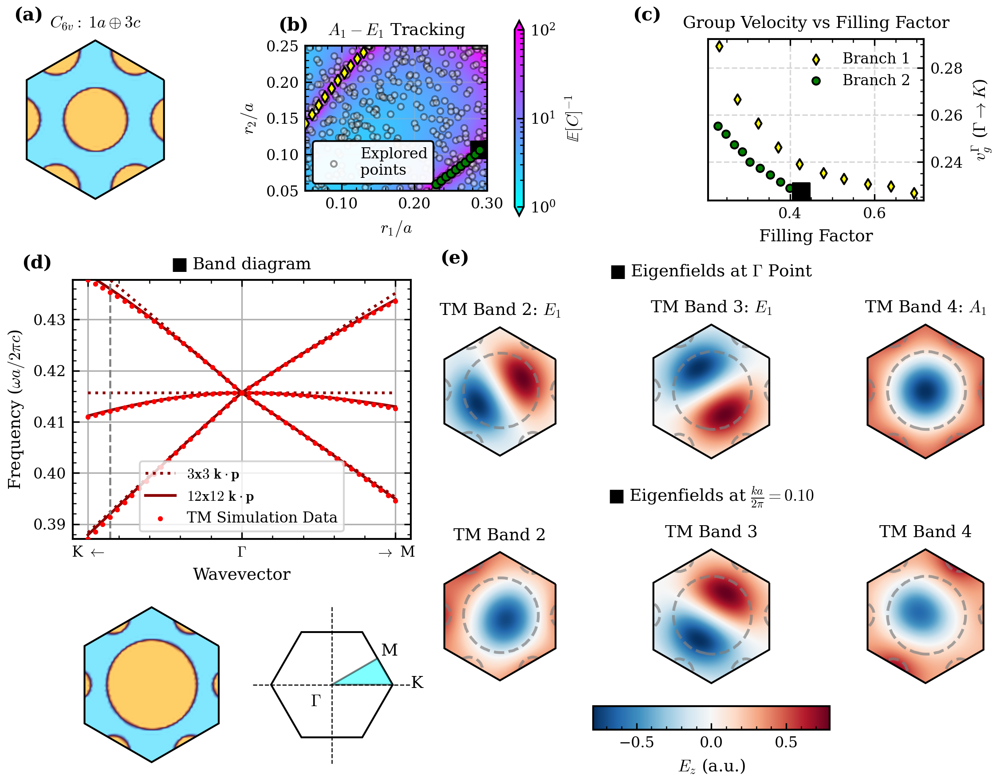

In [24]:
def add_panel_labels(axes_list, labels, xys, fontsize=10):
    for ax, lab, xy in zip(axes_list, labels, xys):
        # remove old text/annotations
        
        ax.annotate(
            lab,
            xy=xy, xycoords='axes fraction',
            ha='left', va='top',
            fontsize=fontsize, fontweight='bold',
            annotation_clip=False,
            #bbox=dict(facecolor='white', alpha=0.6, edgecolor='none', pad=1)
        )

# Example: label the main panels (adjust list/order as needed)
add_panel_labels([ax_a, ax_b, ax_c, ax_d_band, ax_e_t1],
                 ['(a)', '(b)', '(c)', '(d)', '(e)'],
                 [(-0.08, 1.2), (-0.15, 1.2), (-0.35, 1.2), (-0.15, 1.1), (-0.25, 1.2)]
)  
display(fig8)

In [25]:
figure_path

'/zhome/2f/7/202918/article1/pics'

In [26]:
fig8.savefig(os.path.join(figure_path, "figure_8.pdf"), 
             bbox_inches='tight')

/tmp/pbs.662387.hnode41/ipykernel_1567427/1447402862.py:1: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig8.savefig(os.path.join(figure_path, "figure_8.pdf"),
/zhome/2f/7/202918/miniconda3/envs/mpb-nzi-env/lib/python3.11/site-packages/IPython/core/events.py:96: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  func(*args, **kwargs)


#### Bands A1 E2

In [27]:
SIMULATE = True

In [28]:
simulation_2D_opt_A1E2E2 = Simulation(
    simulation_name=name_2D_opt + "_A1E2E2",
    script = script_2D_opt,
    directory= os.path.join(data_rooth, name_2D_opt + "_A1E2E2")
    )

# Run Bayesian Optimization
numproc = 32
lsf_config = LSFJobConfiguration(num_processors=numproc, span_option="ptile", span_value=4, queue="hpc",   mem = "1GB")
bo_options = {
    "dimensions": [(0.05, 0.3), (0.05, 0.25)],
    "acq_func": "LCB",
    "acq_func_kwargs": {"kappa": 5},
    "n_initial_points": numproc * 6,
    "initial_point_generator": "lhs"
}

optimizer_A1E2E2 = MPIBayesianOptimizator(
    simulation_name=simulation_2D_opt_A1E2E2.simulation_name,
    scheme_script=simulation_2D_opt_A1E2E2.script, 
    directory=simulation_2D_opt_A1E2E2.directory,
    maxiter=11, 
    batch_size=numproc,
    param_names=["r1", "r2"],
    polarization="tm",
    symmetry_group="C6v",
    # Pass the irreps instead of bands:
    target_irreps=["B_2", "E_1", "E_1"], 
    # Use the first occurrence of B_2, and the first occurrence of the E_1 doublet
    irrep_occurrences=[1, 1, 1],
    bo_options=bo_options,
)

if SIMULATE is True:
    optimizer_A1E2E2.erease_data_file()
    optimizer_A1E2E2.submit_lsf_job(lsf_config, conda_env_name="mpb-nzi-env")

LSF job script written to: /work3/enrva/phc_nzi_data/MPB_data/C6v_pillars__2D_opt_A1E2E2/C6v_pillars__2D_opt_A1E2E2.sh
Job submitted successfully. Submission output:
Job <28396838> is submitted to queue <hpc>.

Waiting for job 28396838 to finish...
Job 28396838 status: PEND, elapsed time: 0 sec


Job 28396838 status: RUN, elapsed time: 60 sec
Job 28396838 status: RUN, elapsed time: 120 sec
Job 28396838 status: RUN, elapsed time: 180 sec
Job 28396838 status: RUN, elapsed time: 240 sec
Job 28396838 status: RUN, elapsed time: 300 sec
Job 28396838 status: RUN, elapsed time: 360 sec
Job 28396838 status: RUN, elapsed time: 420 sec
Job 28396838 status: RUN, elapsed time: 480 sec
Job 28396838 status: RUN, elapsed time: 540 sec
Job 28396838 status: RUN, elapsed time: 600 sec
Job 28396838 status: RUN, elapsed time: 660 sec
Job 28396838 status: RUN, elapsed time: 721 sec
Job 28396838 status: DONE, elapsed time: 781 sec
Job 28396838 finished.


In [29]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as pe
from matplotlib.ticker import FormatStrFormatter, LogLocator, LogFormatterSciNotation
import joblib
import os

# 1. Load Data and Optimizer
analyzer = OptimizationDataAnalyzer(optimizer_B2_E1.data_file)
analyzer.load_data()
loaded_optimizer = joblib.load(optimizer_B2_E1.model_file)

# Prepare predictions from the GP
gp_model = loaded_optimizer.models[-1]
valid = (analyzer.cost_vals > 0) & (~np.isnan(analyzer.cost_vals))
X_train = np.c_[analyzer.param1_vals[valid], analyzer.param2_vals[valid]]

# Setup grids for the map
r1_grid = np.linspace(0.05, 0.3, 200)
r2_grid = np.linspace(0.05, 0.25, 200)
R1, R2 = np.meshgrid(r1_grid, r2_grid)
grid_points = np.c_[R1.ravel(), R2.ravel()]

grid_points_transformed = loaded_optimizer.space.transform(grid_points)
predicted_cost = gp_model.predict(grid_points_transformed)

# Calculate the Figure of Merit
predicted_cost_safe = np.clip(predicted_cost, a_min=1e-6, a_max=None)
Predicted_FOM_2D = (1.0 / predicted_cost_safe).reshape(R1.shape)

# --- NEW: FIND 10 OPTIMAL SAMPLES FOR 0.05 < r1 < 0.14 ---
r1_samples = np.linspace(0.14, 0.30, 10)
optimal_r2_points = []

# Dense r2 search space for high-precision extraction
r2_search = np.linspace(0.05, 0.25, 500)

for r1_val in r1_samples:
    # Build test points for this specific r1
    test_points = np.c_[np.full(len(r2_search), r1_val), r2_search]
    test_transformed = loaded_optimizer.space.transform(test_points)
    
    # Predict and find minimum cost (exploitation)
    costs = gp_model.predict(test_transformed)
    best_r2 = r2_search[np.argmin(costs)]
    optimal_r2_points.append([r1_val, best_r2])

optimal_r2_points = np.array(optimal_r2_points)

# Setup LogNorm
vmin, vmax = 1e0, 1e2
log_norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)

# Initialize figure
fig, ax = plt.subplots(1, 1, figsize=ROW1_COL1_SIZE)

# ---------------------------------------------------------
# Plot: GP Surrogate
# ---------------------------------------------------------
levels = np.logspace(np.log10(vmin), np.log10(vmax), 200)
heatmap = ax.contourf(R1, R2, Predicted_FOM_2D, levels=levels, cmap="cool", norm=log_norm, extend='both')

# Plot Sampled Points (Training data)
ax.scatter(X_train[:, 0], X_train[:, 1], c='white', edgecolors='black', 
           s=10, alpha=0.4, label="Explored Points")

# Plot the 10 Optimal Samples extracted from the GP
ax.scatter(optimal_r2_points[:, 0], optimal_r2_points[:, 1], 
           color='yellow', marker='d', s=20, edgecolors='black', 
           label=r"Samples for $v_g$ analysis", zorder=15)

ax.set_xlabel("$r_1/a$")
ax.set_ylabel("$r_2/a$")
ax.set_title("$B_2-E_1$ Tracking")
ax.grid(alpha=0.3)
ax.set_aspect('equal')
ax.set_xlim(0.05, 0.3)
ax.set_ylim(0.05, 0.25)

# Formatting ticks
ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

# Colorbar setup
cbar = fig.colorbar(heatmap, ax=ax, fraction=0.046, pad=0.04, extend='both', format=LogFormatterSciNotation())
cbar.set_label(r"1/$\mathrm{C}$")
cbar.locator = LogLocator(base=10.0, numticks=6)
cbar.update_ticks()
cbar.ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(2, 10), numticks=12))

# Legend
ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.4), ncol=1, framealpha=0.95, edgecolor='black')

FIG_8B = plt.gcf()
plt.savefig(os.path.join(figure_path, "figure_8b"), bbox_inches='tight')
plt.show()

NameError: name 'optimizer_B2_E1' is not defined

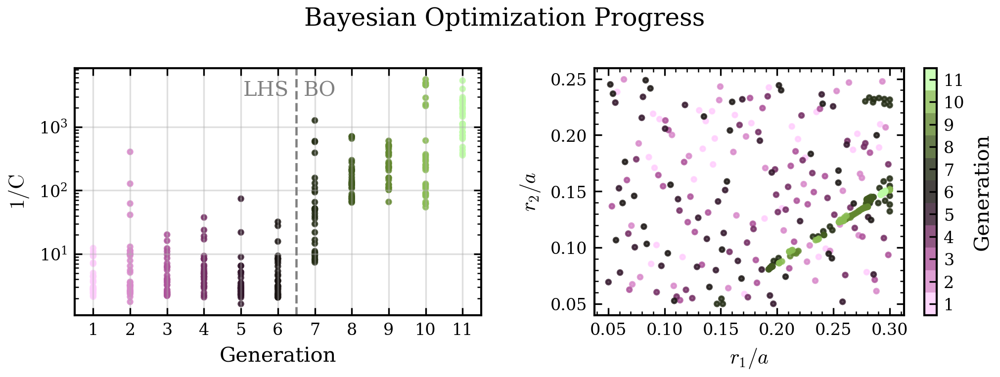

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.ticker import MultipleLocator, NullLocator

# Plot the points in the r1-r2 plane, colored by the generation in which they were evaluated
plt.figure(figsize=ROW1_COL2_SIZE)
analyzer.load_data()  # Ensure data is loaded before plotting
df = analyzer.get_points_above_treshold(0)

# Count generations from 1 instead of 0
if df["Gen"].min() == 0:
    df["Gen"] = df["Gen"] + 1

s = 5
# Suptitle
plt.suptitle(
    "Bayesian Optimization Progress"
)

# Determine strictly integer min and max generations
min_gen = int(df["Gen"].min())
max_gen = max(int(df["Gen"].max()), 10)

# Pad vmin and vmax by 0.5. 
v_min = min_gen - 0.5
v_max = max_gen + 0.5

# Use standard Normalize instead of TwoSlopeNorm for uniformly spaced ticks
norm = mcolors.Normalize(vmin=v_min, vmax=v_max)

# Calculate exact number of distinct color blocks needed
num_colors = max_gen - min_gen + 1
cmap = plt.get_cmap("vanimo", num_colors)  

# --- LEFT PLOT ---
plt.subplot(1, 2, 1)



plt.scatter(df["Gen"], 1/(df["cost"]), c=df["Gen"], cmap=cmap, norm=norm, s=s, alpha=0.8)




plt.xlabel("Generation")
plt.ylabel(r"$1/\mathrm{C}$")
plt.yscale('log')
plt.grid(alpha=0.4)

# Force x-axis to tick exactly at every integer and remove minor ticks
plt.gca().xaxis.set_major_locator(MultipleLocator(1))
plt.gca().xaxis.set_minor_locator(NullLocator())

# Vertical line at 6.5 to show start of BO phase (after 6 initial random points)
plt.axvline(6.5, color='gray', linestyle='--')
# "LHS" to the left of the line
plt.text(6.3, 0.95, "LHS", ha='right', va='top', fontsize=10, 
        color='gray', transform=plt.gca().get_xaxis_transform())

# "BO" to the right of the line
plt.text(6.7, 0.95, "BO", ha='left', va='top', fontsize=10, 
        color='gray', transform=plt.gca().get_xaxis_transform())

# --- RIGHT PLOT ---
plt.subplot(1, 2, 2)
scatter = plt.scatter(df["r1"], df["r2"], c=df["Gen"], cmap=cmap, norm=norm, s=s, alpha=0.8)

# Colorbar tick centering and minor tick removal
cbar = plt.colorbar(scatter, label="Generation")
cbar.set_ticks(np.arange(min_gen, max_gen + 1))
cbar.ax.yaxis.set_minor_locator(NullLocator())

plt.xlabel("$r_1/a$")
plt.ylabel("$r_2/a$")
plt.gca().set_aspect('equal')

plt.tight_layout()
plt.savefig(os.path.join(figure_path, "optimization_data_generations_2D.png"))
plt.show()

#### Bands A1 E1 E1

In [ ]:
SIMULATE = True

In [ ]:
simulation_2D_opt_A1E1E1 = Simulation(
    simulation_name=name_2D_opt + "_A1E1E1",
    script = script_2D_opt,
    directory= os.path.join(data_rooth, name_2D_opt + "_A1E1E1")
    )

# Run Bayesian Optimization
numproc = 32
lsf_config = LSFJobConfiguration(num_processors=numproc, span_option="ptile", span_value=4, queue="hpc",   mem = "1GB")
bo_options = {
    "dimensions": [(0.05, 0.3), (0.05, 0.25)],
    "acq_func": "LCB",
    "acq_func_kwargs": {"kappa": 5},
    "n_initial_points": numproc * 6,
    "initial_point_generator": "lhs"
}

optimizer_A1_E1_E1 = MPIBayesianOptimizator(
    simulation_name=simulation_2D_opt_A1E1E1.simulation_name,
    scheme_script=simulation_2D_opt_A1E1E1.script, 
    directory=simulation_2D_opt_A1E1E1.directory,
    maxiter=11, 
    batch_size=numproc,
    param_names=["r1", "r2"],
    polarization="tm",
    symmetry_group="C6v",
    # Pass the irreps instead of bands:
    target_irreps=["A_1", "E_1", "E_1"], 
    # Use the first occurrence of B_2, and the first occurrence of the E_1 doublet
    irrep_occurrences=[1, 1, 1],
    bo_options=bo_options,
)

if SIMULATE is True:
    optimizer_A1_E1_E1.erease_data_file()
    optimizer_A1_E1_E1.submit_lsf_job(lsf_config, conda_env_name="mpb-nzi-env")

LSF job script written to: /work3/enrva/phc_nzi_data/MPB_data/C6v_pillars__2D_opt_A1E1E1/C6v_pillars__2D_opt_A1E1E1.sh
Job submitted successfully. Submission output:
Job <28270203> is submitted to queue <hpc>.

Waiting for job 28270203 to finish...
Job 28270203 status: PEND, elapsed time: 0 sec
Job 28270203 status: RUN, elapsed time: 60 sec
Job 28270203 status: RUN, elapsed time: 120 sec
Job 28270203 status: RUN, elapsed time: 180 sec
Job 28270203 status: RUN, elapsed time: 240 sec
Job 28270203 status: RUN, elapsed time: 300 sec
Job 28270203 status: RUN, elapsed time: 360 sec
Job 28270203 status: RUN, elapsed time: 420 sec
Job 28270203 status: RUN, elapsed time: 480 sec
Job 28270203 status: RUN, elapsed time: 540 sec
Job 28270203 status: RUN, elapsed time: 600 sec
Job 28270203 status: RUN, elapsed time: 661 sec
Job 28270203 status: DONE, elapsed time: 721 sec
Job 28270203 finished.


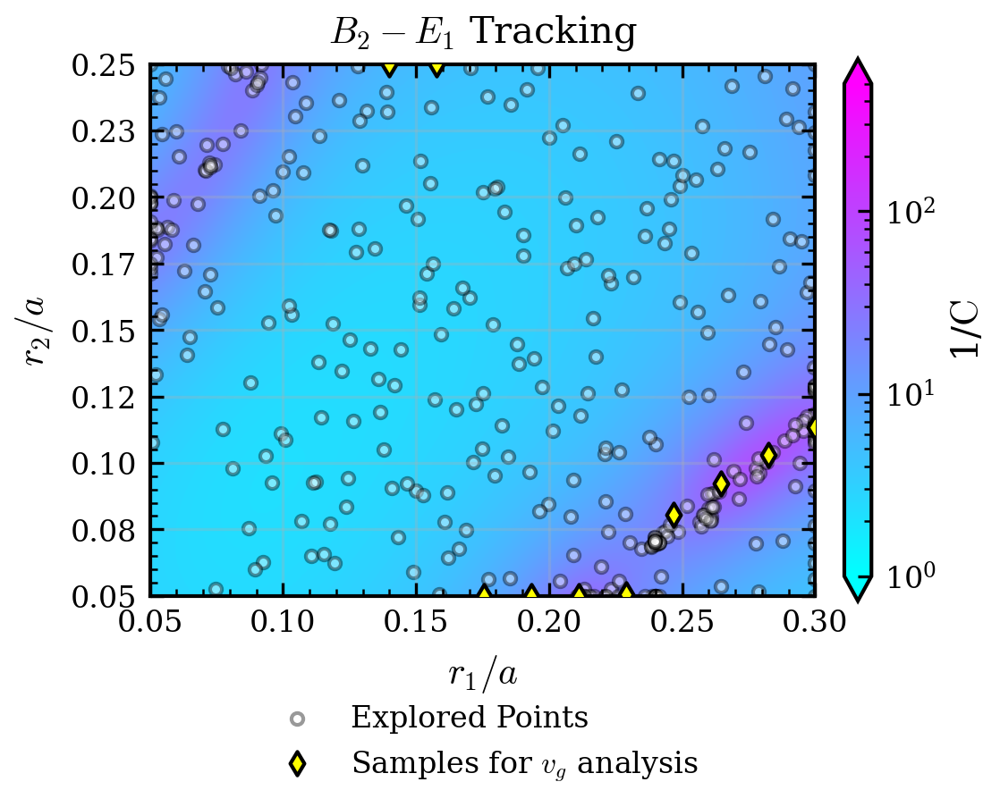

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as pe
from matplotlib.ticker import FormatStrFormatter, LogLocator, LogFormatterSciNotation
import joblib
import os

# 1. Load Data and Optimizer
analyzer = OptimizationDataAnalyzer(optimizer_A1_E1_E1.data_file)
analyzer.load_data()
loaded_optimizer = joblib.load(optimizer_A1_E1_E1.model_file)

# Prepare predictions from the GP
gp_model = loaded_optimizer.models[-1]
valid = (analyzer.cost_vals > 0) & (~np.isnan(analyzer.cost_vals))
X_train = np.c_[analyzer.param1_vals[valid], analyzer.param2_vals[valid]]

# Setup grids for the map
r1_grid = np.linspace(0.05, 0.3, 200)
r2_grid = np.linspace(0.05, 0.25, 200)
R1, R2 = np.meshgrid(r1_grid, r2_grid)
grid_points = np.c_[R1.ravel(), R2.ravel()]

grid_points_transformed = loaded_optimizer.space.transform(grid_points)
predicted_cost = gp_model.predict(grid_points_transformed)

# Calculate the Figure of Merit
predicted_cost_safe = np.clip(predicted_cost, a_min=1e-6, a_max=None)
Predicted_FOM_2D = (1.0 / predicted_cost_safe).reshape(R1.shape)

# --- NEW: FIND 10 OPTIMAL SAMPLES FOR 0.05 < r1 < 0.14 ---
r1_samples = np.linspace(0.14, 0.30, 10)
optimal_r2_points = []

# Dense r2 search space for high-precision extraction
r2_search = np.linspace(0.05, 0.25, 500)

for r1_val in r1_samples:
    # Build test points for this specific r1
    test_points = np.c_[np.full(len(r2_search), r1_val), r2_search]
    test_transformed = loaded_optimizer.space.transform(test_points)
    
    # Predict and find minimum cost (exploitation)
    costs = gp_model.predict(test_transformed)
    best_r2 = r2_search[np.argmin(costs)]
    optimal_r2_points.append([r1_val, best_r2])

optimal_r2_points = np.array(optimal_r2_points)

# Setup LogNorm
vmin, vmax = 1e0, 5e2
log_norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)

# Initialize figure
fig, ax = plt.subplots(1, 1, figsize=ROW1_COL1_SIZE)

# ---------------------------------------------------------
# Plot: GP Surrogate
# ---------------------------------------------------------
levels = np.logspace(np.log10(vmin), np.log10(vmax), 200)
heatmap = ax.contourf(R1, R2, Predicted_FOM_2D, levels=levels, cmap="cool", norm=log_norm, extend='both')

# Plot Sampled Points (Training data)
ax.scatter(X_train[:, 0], X_train[:, 1], c='white', edgecolors='black', 
           s=10, alpha=0.4, label="Explored Points")

# Plot the 10 Optimal Samples extracted from the GP
ax.scatter(optimal_r2_points[:, 0], optimal_r2_points[:, 1], 
           color='yellow', marker='d', s=20, edgecolors='black', 
           label=r"Samples for $v_g$ analysis", zorder=15)

ax.set_xlabel("$r_1/a$")
ax.set_ylabel("$r_2/a$")
ax.set_title("$B_2-E_1$ Tracking")
ax.grid(alpha=0.3)
ax.set_aspect('equal')
ax.set_xlim(0.05, 0.3)
ax.set_ylim(0.05, 0.25)

# Formatting ticks
ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

# Colorbar setup
cbar = fig.colorbar(heatmap, ax=ax, fraction=0.046, pad=0.04, extend='both', format=LogFormatterSciNotation())
cbar.set_label(r"1/$\mathrm{C}$")
cbar.locator = LogLocator(base=10.0, numticks=6)
cbar.update_ticks()
cbar.ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(2, 10), numticks=12))

# Legend
ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.4), ncol=1, framealpha=0.95, edgecolor='black')

FIG_8B = plt.gcf()
plt.savefig(os.path.join(figure_path, "figure_8b"), bbox_inches='tight')
plt.show()

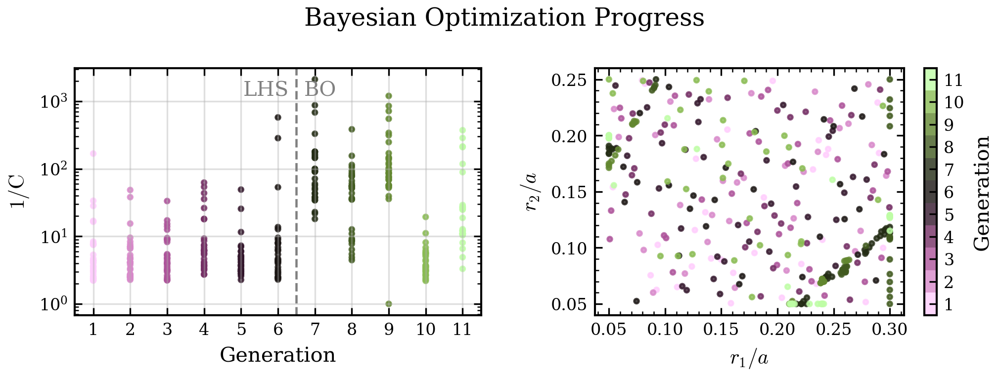

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.ticker import MultipleLocator, NullLocator

# Plot the points in the r1-r2 plane, colored by the generation in which they were evaluated
plt.figure(figsize=ROW1_COL2_SIZE)
analyzer.load_data()  # Ensure data is loaded before plotting
df = analyzer.get_points_above_treshold(0)

# Count generations from 1 instead of 0
if df["Gen"].min() == 0:
    df["Gen"] = df["Gen"] + 1

s = 5
# Suptitle
plt.suptitle(
    "Bayesian Optimization Progress"
)

# Determine strictly integer min and max generations
min_gen = int(df["Gen"].min())
max_gen = max(int(df["Gen"].max()), 10)

# Pad vmin and vmax by 0.5. 
v_min = min_gen - 0.5
v_max = max_gen + 0.5

# Use standard Normalize instead of TwoSlopeNorm for uniformly spaced ticks
norm = mcolors.Normalize(vmin=v_min, vmax=v_max)

# Calculate exact number of distinct color blocks needed
num_colors = max_gen - min_gen + 1
cmap = plt.get_cmap("vanimo", num_colors)  

# --- LEFT PLOT ---
plt.subplot(1, 2, 1)



plt.scatter(df["Gen"], 1/(df["cost"]), c=df["Gen"], cmap=cmap, norm=norm, s=s, alpha=0.8)




plt.xlabel("Generation")
plt.ylabel(r"$1/\mathrm{C}$")
plt.yscale('log')
plt.grid(alpha=0.4)

# Force x-axis to tick exactly at every integer and remove minor ticks
plt.gca().xaxis.set_major_locator(MultipleLocator(1))
plt.gca().xaxis.set_minor_locator(NullLocator())

# Vertical line at 6.5 to show start of BO phase (after 6 initial random points)
plt.axvline(6.5, color='gray', linestyle='--')
# "LHS" to the left of the line
plt.text(6.3, 0.95, "LHS", ha='right', va='top', fontsize=10, 
        color='gray', transform=plt.gca().get_xaxis_transform())

# "BO" to the right of the line
plt.text(6.7, 0.95, "BO", ha='left', va='top', fontsize=10, 
        color='gray', transform=plt.gca().get_xaxis_transform())

# --- RIGHT PLOT ---
plt.subplot(1, 2, 2)
scatter = plt.scatter(df["r1"], df["r2"], c=df["Gen"], cmap=cmap, norm=norm, s=s, alpha=0.8)

# Colorbar tick centering and minor tick removal
cbar = plt.colorbar(scatter, label="Generation")
cbar.set_ticks(np.arange(min_gen, max_gen + 1))
cbar.ax.yaxis.set_minor_locator(NullLocator())

plt.xlabel("$r_1/a$")
plt.ylabel("$r_2/a$")
plt.gca().set_aspect('equal')

plt.tight_layout()
plt.savefig(os.path.join(figure_path, "optimization_data_generations_2D.png"))
plt.show()

### Optimized

In [ ]:
SIMULATE = False

In [ ]:
# Define target parameters
r1_below_threshold, r2_below_threshold = best_point_below_threshold["r1"], best_point_below_threshold["r2"]
r1_above_threshold, r2_above_threshold = best_point_above_threshold["r1"], best_point_above_threshold["r2"]

#### Above FF threshold

In [ ]:
# Run the simulation or retrieve the data for the best point above the filling factor threshold
r1 = r1_above_threshold
r2 = r2_above_threshold

data_line = rf"$r_1={r1:0.3f}a$, $r_2={r2:0.3f}a$, $\varepsilon={eps_si}$"
print("r2: ", r2, "r1: ", r1, "filling factor: ", (np.pi*r1**2 + np.pi*r2**2))
simulation_2D_optimized_above_threshold = Simulation(
    simulation_name=name_2D_optimized + "_above_threshold",
    script = script_2D_optimized,
    directory= os.path.join(data_rooth, name_2D_optimized + "_above_threshold")  
    )
if SIMULATE is True:
    print("2D simulation started")
    simulation_2D_optimized_above_threshold.run_hpc(mpb_command_line_params=dict(r1 = r1, r2 = r2), mpi = False, version = "mpb-dev/1.11.2-dev")
    print("done")
print("Collecting results forom ", simulation_2D_optimized_above_threshold.directory)
viewer_2D = SimulationViewer(simulation_2D_optimized_above_threshold) 
opt = MPBDataOptions(rectify=True, periods= 1)
df_tm_above = simulation_2D_optimized_above_threshold.load_frequency_data("tm")


r2:  0.20987334615664088 r1:  0.0901548764248611 filling factor:  0.1639117270144784


In [ ]:
from importlib import reload
import phc_nzi.pt_solver as pt_solver
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches

reload(pt_solver)

# --- Configuration ---
b_idxes = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
triplet_bands = [3, 4, 5] 
parity = "tm"
lattice = "hexagonal"
df = df_tm_above

# Map the physical band numbers to their index in the matrix
triplet_indices = [b_idxes.index(b) for b in triplet_bands]

# --- 1. Get Gamma State & Matrices ---
gamma_idx = df.loc[(df["k2"] == 0) & (df["k1"] == 0), "k index"].values[0]
omega_0s = [df.loc[df["k index"] == gamma_idx, f"{parity} band {b}"].values[0] for b in b_idxes]

fields, eps_data = pt_solver.load_mpb_data(simulation_2D_optimized_above_threshold, gamma_idx, b_idxes, parity)
p_matrix, q_matrix = pt_solver.calculate_pt_matrices(fields, eps_data, parity, lattice)

# --- 2. Calculate Dispersion (Full & Reduced) ---
bands_full = pt_solver.calculate_perturbed_bands(
    p_matrix, q_matrix, omega_0s, 
    k1_arr=df["k1"].values, k2_arr=df["k2"].values, 
    kmag_arr=df["kmag/2pi"].values, lattice_type=lattice
)

bands_reduced = pt_solver.calculate_reduced_bands(
    p_matrix, omega_0s, 
    k1_arr=df["k1"].values, k2_arr=df["k2"].values, 
    kmag_arr=df["kmag/2pi"].values, 
    lattice_type=lattice, target_indices=triplet_indices
)

# --- 3. Cartesian Group Velocity ---
vg_x, vg_y = pt_solver.calculate_group_velocity_tensor(p_matrix, omega_0s, triplet_indices)
print(f"Analytical Cartesian vg_x slopes: {np.real(np.linalg.eigvals(vg_x))}")

Analytical Cartesian vg_x slopes: [ 1.43529387e-06 -1.75573109e-06 -6.58412390e-07]


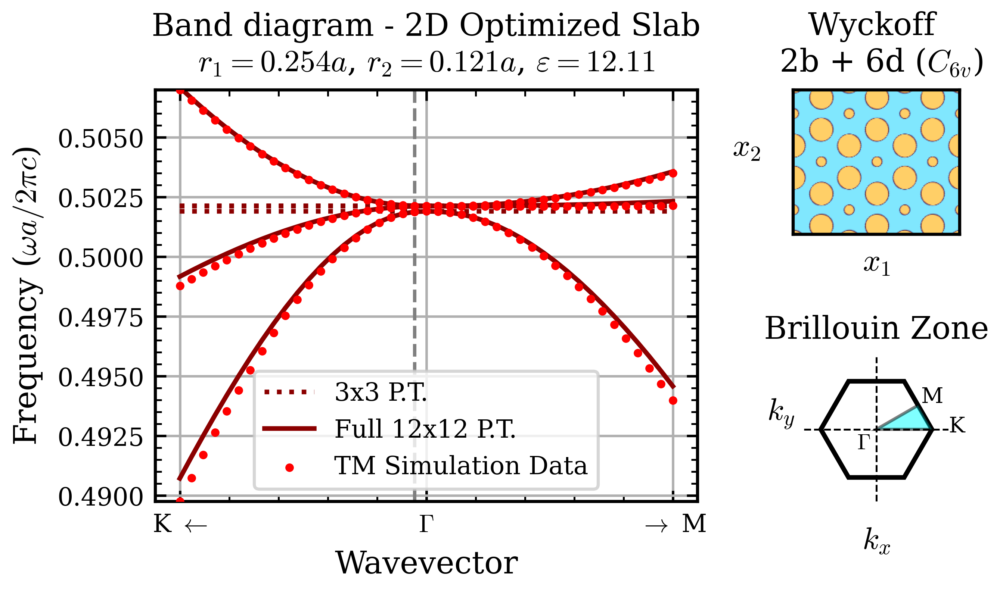

In [ ]:
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches

# -- 0. Calculate Unified X-Axis for Path --
kx_mpb = df_tm_above["k1"].values
ky_mpb = df_tm_above["k2"].values

dkx = np.diff(kx_mpb); dky = np.diff(ky_mpb)
x_plot = np.concatenate(([0], np.cumsum(np.sqrt(dkx**2 + dky**2))))
x_plot -= x_plot[np.argmin(kx_mpb**2 + ky_mpb**2)]

target_x = x_plot[df_tm_above.loc[(df_tm_above["k2"] == 0) & (df_tm_above["k1"] > 0), "k1"].idxmin()]

# Create a figure
fig = plt.figure(figsize=(WIDTH_1*1.3, HEIGHT_1), constrained_layout=True, dpi=600)
gs = gridspec.GridSpec(2, 3, figure=fig)

# ==========================================
# -- 1. LEFT PANEL: Band Diagram --
# ==========================================
ax_band = fig.add_subplot(gs[:, 0:2])
plt.sca(ax_band)

# Plot REDUCED Linear Theory bands
plt.plot(x_plot, bands_reduced[:, 0], ':', color='darkred', linewidth=1.5, label="3x3 P.T.")
plt.plot(x_plot, bands_reduced[:, 1:], ':', color='darkred', linewidth=1.5)

# Plot FULL Perturbation Theory bands (Solid Dark Red)
plt.plot(x_plot, bands_full[:, 0], '-', color='darkred', linewidth=1.5, label="Full 12x12 P.T.")
plt.plot(x_plot, bands_full[:, 1:], '-', color='darkred', linewidth=1.5)

# Plot ALL original MPB simulation data points
for i, b in enumerate(b_idxes):
    lbl = "TM Simulation Data" if i == 0 else None
    plt.scatter(x_plot, df_tm_above[f"tm band {b}"], color='r', s=3, zorder=3, label=lbl)

ymin, ymax = df_tm_above["tm band 3"].min(), df_tm_above["tm band 5"].max()
plt.ylim(ymin, ymax)

plt.xlabel('Wavevector')
plt.ylabel(r'Frequency ($\omega a / 2\pi c$)')
plt.xticks([x_plot.min(), 0, x_plot.max()], ['K $\leftarrow$', r'$\Gamma$', r'$\rightarrow$ M'])
plt.grid(True)
plt.legend(frameon=True, fontsize=8, loc='best')

try:
    ax_band.set_title("Band diagram - 2D Optimized Slab\n" + data_line)
except NameError:
    ax_band.set_title("Band diagram - 2D Optimized Slab")

ax_band.vlines(target_x, ymin, ymax, colors="gray", linestyles="--", label=None)

# ==========================================
# -- 2. TOP RIGHT: Square Lattice --
# ==========================================
ax_lat = fig.add_subplot(gs[0, 2])
opt = MPBDataOptions(rectify=True, periods=3, resolution = 65)
eps = simulation_2D_optimized_above_threshold.load_and_convert_epsilon_data(options=opt)

ax_lat.imshow(eps.T, cmap="managua_r", origin="lower") 
ax_lat.set_xticks([]); ax_lat.set_yticks([])
ax_lat.set_xlabel(r"$x_1$"); ax_lat.set_ylabel(r"$x_2$", rotation=0, labelpad=15)
ax_lat.set_title("Wyckoff \n 2b + 6d ($C_{6v}$)")

# ==========================================
# -- 3. BOTTOM RIGHT: Brillouin Zone --
# ==========================================
ax_bz = fig.add_subplot(gs[1, 2])

angles = np.linspace(0, 2*np.pi, 7)
ax_bz.add_patch(patches.Polygon([[np.cos(a), np.sin(a)] for a in angles], fill=False, edgecolor='black', linewidth=1.5))

m_x, m_y = np.cos(np.pi/6) * (np.sqrt(3)/2), np.sin(np.pi/6) * (np.sqrt(3)/2)
ax_bz.add_patch(patches.Polygon([[0, 0], [1, 0], [m_x, m_y]], closed=True, fill=True, facecolor='cyan', alpha=0.5, edgecolor='black'))

ax_bz.axhline(0, color='black', linewidth=0.6, linestyle='--')
ax_bz.axvline(0, color='black', linewidth=0.6, linestyle='--')

ax_bz.text(-0.35, -0.35, r'$\Gamma$', fontsize=7)
ax_bz.text(1.3, -0.05, 'K', fontsize=7)    
ax_bz.text(m_x + 0.05, m_y + 0.05, 'M', fontsize=7)

limit = 1.3
ax_bz.set_xlim(-limit, limit); ax_bz.set_ylim(-limit, limit)
ax_bz.set_aspect('equal')

for spine in ax_bz.spines.values(): spine.set_visible(False)
ax_bz.tick_params(which='both', bottom=False, top=False, left=False, right=False)
ax_bz.set_xticklabels([]); ax_bz.set_yticklabels([])
ax_bz.set_xlabel(r"$k_x$"); ax_bz.set_ylabel(r"$k_y$", rotation=0)
ax_bz.set_title("Brillouin Zone")
# Save and show

plt.show()

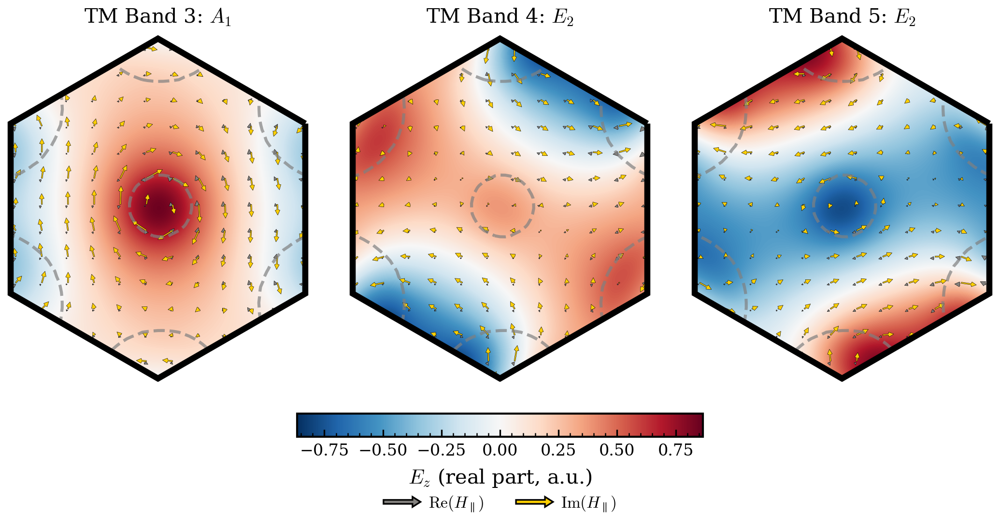

In [ ]:
# Plot the eigen fields 
# Plot bands in a 2x2 grid (band 6 gets its own panel)
fig, axes = plt.subplots(1, 3, figsize=ROW2_COL2_SIZE, constrained_layout=True)
fig.set_constrained_layout_pads(w_pad=0.1, h_pad=0.04, wspace=0.12, hspace=0.06)
band_indices = [3, 4, 5,]

import phc_nzi.simulation_viewer as sv


# ==========================================
# 1. DATA LOADING
# ==========================================
conv_opt = MPBDataOptions(rectify=True, periods=3, transpose=False, resolution=65)

loaded_fields = {}
global_vmax = 0

try:
    eps_data = simulation_2D_optimized_above_threshold.load_and_convert_epsilon_data(options=conv_opt)
except Exception:
    eps_data = None

for b_idx in band_indices:
    fz = simulation_2D_optimized_above_threshold.load_and_convert_field_data(
        k_idx_for_field_plot, b_idx, "z", "tm", "e", conversion_options=conv_opt, overwrite=True)
    fx = simulation_2D_optimized_above_threshold.load_and_convert_field_data(
        k_idx_for_field_plot, b_idx, "x", "tm", "h", conversion_options=conv_opt, overwrite=True)
    fy = simulation_2D_optimized_above_threshold.load_and_convert_field_data(
        k_idx_for_field_plot, b_idx, "y", "tm", "h", conversion_options=conv_opt, overwrite=True)
    
    loaded_fields[b_idx] = {'z': fz, 'x': fx, 'y': fy}
    
    local_max = np.max(np.abs(np.real(fz)))
    if local_max > global_vmax:
        global_vmax = local_max

# Identify the Irrep of these modes
irreps = simulation_2D_optimized_above_threshold.identify_irrep_by_band_indices(band_indices, "tm", "C6v")

axes_flat = axes.flatten()

# Plot bands 
for ax, b_idx, irrep in zip(axes_flat[:3], band_indices, irreps):
    data = loaded_fields[b_idx]
    im = sv.plot_field_quiver_on_ax(        
        field_z=data['z'],
        field_x=data['x'],
        field_y=data['y'],
        eps_data=eps_data,
        ax = ax, 
        lattice_type="hexagonal",
        step = 5
    )
    ax.set_title(f"TM Band {b_idx}: ${irrep}$")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_aspect('equal')
    ax.axis('off')

# Shared colorbar for all panels, placed at the bottom center, but not spanning the full width



# Disable constrained layout and reserve space for the horizontal colorbar so it doesn't overlap plots
cbar_width = 0.4
cbar_height = 0.03
cbar_left = 0.5 - cbar_width / 2
cbar_bottom = 0.2


# Add colorbar axes and create the shared horizontal colorbar
cbar_ax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal') 
cbar.set_label(r"$E_{z}$ (real part, a.u.)")
# # increase the font size of the colorbar ticks
# cbar.ax.tick_params(labelsize=10)
# # increase the font size of the colorbar label
# cbar.ax.xaxis.label.set_size(10)

# Arrow legend at the lower center, below the colorbar
sv.add_arrow_legend(
    fig,
    field="H",
    is_figure=True,
    loc='lower center',
    bbox_to_anchor=(0.5, 0.08),
    # fontsize=10
)

plt.show()

#### Below FF Threshold

In [ ]:
r1 = r1_below_threshold
r2 = r2_below_threshold
print("r2: ", r2, "r1: ", r1, "filling factor: ", (np.pi*r1**2 + np.pi*r2**2))
ff = 1 - (2 * np.pi / np.sqrt(3)) * (r2**2 + 2 * r1**2)
print(ff)

r2:  0.1208882471066717 r1:  0.2538598655408849 filling factor:  0.24837054409083512
0.47942641082285686


In [ ]:
# Run the simulation or collect results for the best point below the filling factor threshold
r1 = r1_below_threshold
r2 = r2_below_threshold
ff = (2 * np.pi / (np.sqrt(3) * a**2)) * (r1**2 + 2 * r2**2) # Check
data_line = rf"$r_1={r1:0.3f}a$, $r_2={r2:0.3f}a$, $\varepsilon={eps_si}$"
print("r2: ", r2, "r1: ", r1, "filling factor: ", ff)
simulation_2D_optimized_below_threshold = Simulation(
    simulation_name=name_2D_optimized + "_below_threshold",
    script = script_2D_optimized,
    directory= os.path.join(data_rooth, name_2D_optimized + "_below_threshold")  
    )
if SIMULATE is True:
    print("2D simulation started")
    simulation_2D_optimized_below_threshold.run_hpc(mpb_command_line_params=dict(r1 = r1, r2 = r2), mpi = False, version = "mpb-dev/1.11.2-dev")
    print("done")
print("Collecting results forom ", simulation_2D_optimized_below_threshold.directory)
viewer_2D = SimulationViewer(simulation_2D_optimized_below_threshold) 
opt = MPBDataOptions(rectify=True, periods= 1)
df_tm_below = simulation_2D_optimized_below_threshold.load_frequency_data("tm")


r2:  0.1208882471066717 r1:  0.2538598655408849 filling factor:  8.042774290190809e-05


In [ ]:
from importlib import reload
import phc_nzi.pt_solver as pt_solver
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches

reload(pt_solver)

# --- Configuration ---
b_idxes = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
triplet_bands = [3, 4, 5] 
parity = "tm"
lattice = "hexagonal"
df = df_tm_below

# Map the physical band numbers to their index in the matrix
triplet_indices = [b_idxes.index(b) for b in triplet_bands]

# --- 1. Get Gamma State & Matrices ---
gamma_idx = df.loc[(df["k2"] == 0) & (df["k1"] == 0), "k index"].values[0]
omega_0s = [df.loc[df["k index"] == gamma_idx, f"{parity} band {b}"].values[0] for b in b_idxes]

fields, eps_data = pt_solver.load_mpb_data(simulation_2D_optimized_below_threshold, gamma_idx, b_idxes, parity)
p_matrix, q_matrix = pt_solver.calculate_pt_matrices(fields, eps_data, parity, lattice)

# --- 2. Calculate Dispersion (Full & Reduced) ---
bands_full = pt_solver.calculate_perturbed_bands(
    p_matrix, q_matrix, omega_0s, 
    k1_arr=df["k1"].values, k2_arr=df["k2"].values, 
    kmag_arr=df["kmag/2pi"].values, lattice_type=lattice
)

bands_reduced = pt_solver.calculate_reduced_bands(
    p_matrix, omega_0s, 
    k1_arr=df["k1"].values, k2_arr=df["k2"].values, 
    kmag_arr=df["kmag/2pi"].values, 
    lattice_type=lattice, target_indices=triplet_indices
)

# --- 3. Cartesian Group Velocity ---
vg_x, vg_y = pt_solver.calculate_group_velocity_tensor(p_matrix, omega_0s, triplet_indices)
print(f"Analytical Cartesian vg_x slopes: {np.real(np.linalg.eigvals(vg_x))}")

Analytical Cartesian vg_x slopes: [-1.35543472e-05  3.67851216e-06 -2.35867948e-06]


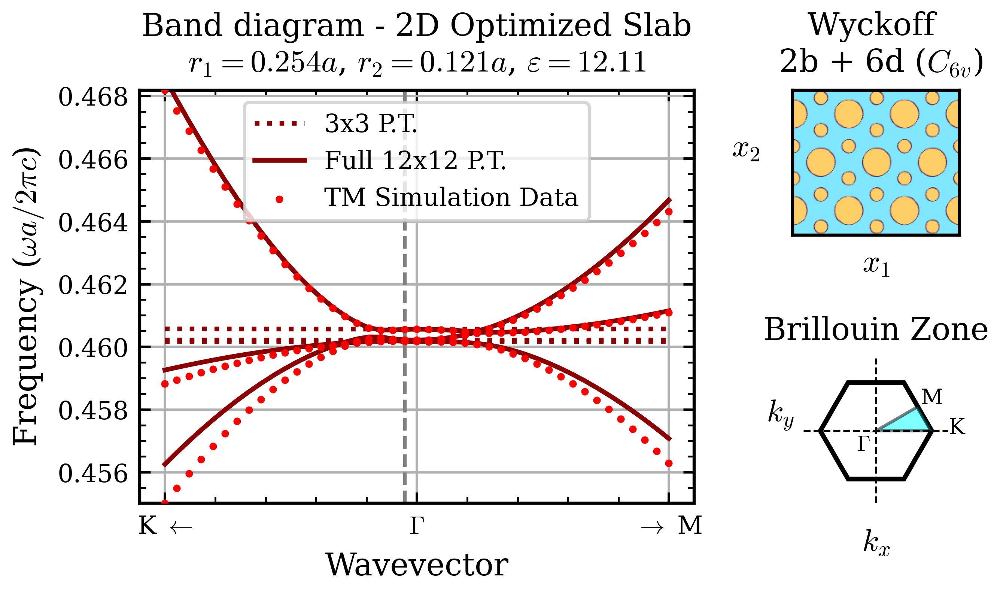

In [ ]:
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
import os

# -- 0. Calculate Unified X-Axis for Path --
# Extract k-vectors from the below-threshold DataFrame
kx_mpb = df_tm_below["k1"].values
ky_mpb = df_tm_below["k2"].values

# Calculate cumulative distance
dkx = np.diff(kx_mpb)
dky = np.diff(ky_mpb)
d_dist = np.sqrt(dkx**2 + dky**2)
x_plot = np.concatenate(([0], np.cumsum(d_dist)))

# Find Gamma point to center the x-axis at 0
gamma_idx = np.argmin(kx_mpb**2 + ky_mpb**2)
x_plot = x_plot - x_plot[gamma_idx]

# Target index (closest k1 > 0 point to Gamma on the K branch)
df_target_idx = df_tm_below.loc[(df_tm_below["k2"] == 0) & (df_tm_below["k1"] > 0), "k1"].idxmin()
target_x = x_plot[df_target_idx]

# Create a figure with a custom grid layout
fig = plt.figure(figsize=(WIDTH_1*1.3, HEIGHT_1), constrained_layout=True, dpi=600)
gs = gridspec.GridSpec(2, 3, figure=fig)

# ==========================================
# -- 1. LEFT PANEL: Band Diagram --
# ==========================================
ax_band = fig.add_subplot(gs[:, 0:2])
plt.sca(ax_band)

# Plot REDUCED Linear Theory bands (Dashed Blue)
plt.plot(x_plot, bands_reduced[:, 0], ':', color='darkred', linewidth=1.5, label="3x3 P.T.")
plt.plot(x_plot, bands_reduced[:, 1:], ':', color='darkred', linewidth=1.5)

# Plot FULL Perturbation Theory bands (Solid Dark Red)
plt.plot(x_plot, bands_full[:, 0], '-', color='darkred', linewidth=1.5, label="Full 12x12 P.T.")
plt.plot(x_plot, bands_full[:, 1:], '-', color='darkred', linewidth=1.5)

# Plot ALL original MPB simulation data points
for i, b in enumerate(b_idxes):
    lbl = "TM Simulation Data" if i == 0 else None
    plt.scatter(x_plot, df_tm_below[f"tm band {b}"], color='r', s=2, zorder=3, label=lbl)

# Set Y limits using min of bottom band and max of top band
ymin = df_tm_below["tm band 3"].min()
ymax = df_tm_below["tm band 5"].max()
plt.ylim(ymin, ymax)

plt.xlabel('Wavevector')
plt.ylabel(r'Frequency ($\omega a / 2\pi c$)')

# Update ticks dynamically to the edges and Gamma
plt.xticks([x_plot.min(), 0, x_plot.max()], ['K $\leftarrow$', r'$\Gamma$', r'$\rightarrow$ M'])
plt.grid(True)
plt.legend(frameon=True, fontsize=8, loc='best')

# Fallback in case data_line isn't defined in the current cell's scope
try:
    ax_band.set_title("Band diagram - 2D Optimized Slab\n" + data_line)
except NameError:
    ax_band.set_title(r"Band diagram - 2D Optimized Slab ($12\times12$ Basis)")

# Vertical dashed line at the target index
ax_band.vlines(target_x, ymin, ymax, colors="gray", linestyles="--", label=None)


# -- 2. TOP RIGHT PANEL: Square Lattice (3 periods, no ticks, no colorbar) --
ax_lat = fig.add_subplot(gs[0, 2])
# Rectify is perfect here because it's strictly for plotting/visualization
opt = MPBDataOptions(rectify=True, periods=3, resolution=65)
eps = simulation_2D_optimized_below_threshold.load_and_convert_epsilon_data(options=opt)

# Plotting the dielectric distribution directly to avoid automatic colorbars/ticks
ax_lat.imshow(eps.T, cmap="managua_r", origin="lower") 
ax_lat.set_xticks([])
ax_lat.set_yticks([])
ax_lat.set_xlabel(r"$x_1$")
ax_lat.set_ylabel(r"$x_2$", rotation=0, labelpad=15)
ax_lat.set_title("Wyckoff \n 2b + 6d ($C_{6v}$)")

# -- 3. BOTTOM RIGHT PANEL: Brillouin Zone (Hexagonal) --
ax_bz = fig.add_subplot(gs[1, 2])

# Define Hexagon vertices (Pointy-topped to match your K-vector on x-axis)
angles = np.linspace(0, 2*np.pi, 7)
hexagon_vertices = [[np.cos(a), np.sin(a)] for a in angles]
bz_hexagon = patches.Polygon(hexagon_vertices, fill=False, edgecolor='black', linewidth=1.5)
ax_bz.add_patch(bz_hexagon)

# Define Irreducible Brillouin Zone (IBZ) triangle: Gamma -> K -> M
# K is at (1, 0)
# M is at 30 degrees at distance cos(30) = sqrt(3)/2
m_x, m_y = np.cos(np.pi/6) * (np.sqrt(3)/2), np.sin(np.pi/6) * (np.sqrt(3)/2)
ibz_vertices = [[0, 0], [1, 0], [m_x, m_y]]
ibz_triangle = patches.Polygon(ibz_vertices, closed=True, fill=True, facecolor='cyan', alpha=0.5, edgecolor='black')
ax_bz.add_patch(ibz_triangle)

# Add crosshair lines through the origin
ax_bz.axhline(0, color='black', linewidth=0.6, linestyle='--')
ax_bz.axvline(0, color='black', linewidth=0.6, linestyle='--')

# Add High-Symmetry point labels
ax_bz.text(-0.35, -0.35, r'$\Gamma$', fontsize=7,)
ax_bz.text(1.3, -0.05, 'K', fontsize=7)    
ax_bz.text(m_x + 0.05, m_y + 0.05, 'M', fontsize=7, )

# Format axes
limit = 1.3
ax_bz.set_xlim(-limit, limit)
ax_bz.set_ylim(-limit, limit)
ax_bz.set_aspect('equal')

# 1. Turn off the default subplot bounding box
for spine in ax_bz.spines.values():
    spine.set_visible(False)

# 2. Turn off all tick marks
ax_bz.tick_params(which='both', bottom=False, top=False, left=False, right=False)

# 3. No tick labels
ax_bz.set_xticklabels([])
ax_bz.set_yticklabels([])

ax_bz.set_xlabel(r"$k_x$")
ax_bz.set_ylabel(r"$k_y$", rotation=0)
ax_bz.set_title("Brillouin Zone")

# Save and show
plt.show()

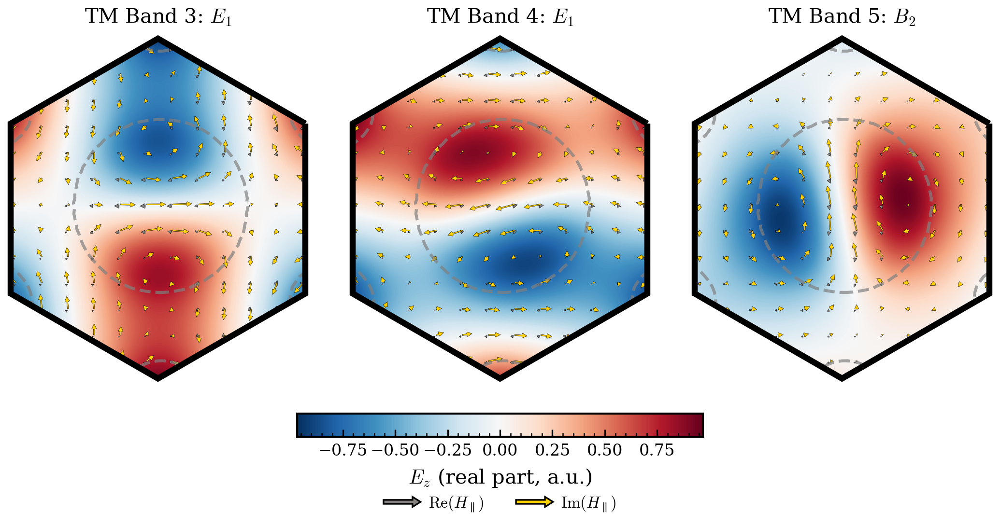

In [ ]:
# Plot the eigen fields 
# Plot bands in a 2x2 grid (band 6 gets its own panel)
fig, axes = plt.subplots(1, 3, figsize=ROW2_COL2_SIZE, constrained_layout=True)
fig.set_constrained_layout_pads(w_pad=0.1, h_pad=0.04, wspace=0.12, hspace=0.06)
band_indices = [3, 4, 5,]

import phc_nzi.simulation_viewer as sv


# ==========================================
# 1. DATA LOADING
# ==========================================
conv_opt = MPBDataOptions(rectify=True, periods=3, transpose=False, resolution=65)

loaded_fields = {}
global_vmax = 0

try:
    eps_data = simulation_2D_optimized_below_threshold.load_and_convert_epsilon_data(options=conv_opt)
except Exception:
    eps_data = None

for b_idx in band_indices:
    fz = simulation_2D_optimized_below_threshold.load_and_convert_field_data(
        k_idx_for_field_plot, b_idx, "z", "tm", "e", conversion_options=conv_opt, overwrite=True)
    fx = simulation_2D_optimized_below_threshold.load_and_convert_field_data(
        k_idx_for_field_plot, b_idx, "x", "tm", "h", conversion_options=conv_opt, overwrite=True)
    fy = simulation_2D_optimized_below_threshold.load_and_convert_field_data(
        k_idx_for_field_plot, b_idx, "y", "tm", "h", conversion_options=conv_opt, overwrite=True)
    
    loaded_fields[b_idx] = {'z': fz, 'x': fx, 'y': fy}
    
    local_max = np.max(np.abs(np.real(fz)))
    if local_max > global_vmax:
        global_vmax = local_max

# Identify the Irrep of these modes
irreps = simulation_2D_optimized_below_threshold.identify_irrep_by_band_indices(band_indices, "tm", "C6v")

axes_flat = axes.flatten()

# Plot bands 
for ax, b_idx, irrep in zip(axes_flat[:3], band_indices, irreps):
    data = loaded_fields[b_idx]
    im = sv.plot_field_quiver_on_ax(        
        field_z=data['z'],
        field_x=data['x'],
        field_y=data['y'],
        eps_data=eps_data,
        ax = ax, 
        lattice_type="hexagonal",
        step = 5
    )
    ax.set_title(f"TM Band {b_idx}: ${irrep}$")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_aspect('equal')
    ax.axis('off')

# Shared colorbar for all panels, placed at the bottom center, but not spanning the full width



# Disable constrained layout and reserve space for the horizontal colorbar so it doesn't overlap plots
cbar_width = 0.4
cbar_height = 0.03
cbar_left = 0.5 - cbar_width / 2
cbar_bottom = 0.2


# Add colorbar axes and create the shared horizontal colorbar
cbar_ax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal') 
cbar.set_label(r"$E_{z}$ (real part, a.u.)")
# # increase the font size of the colorbar ticks
# cbar.ax.tick_params(labelsize=10)
# # increase the font size of the colorbar label
# cbar.ax.xaxis.label.set_size(10)

# Arrow legend at the lower center, below the colorbar
sv.add_arrow_legend(
    fig,
    field="H",
    is_figure=True,
    loc='lower center',
    bbox_to_anchor=(0.5, 0.08),
    # fontsize=10
)

plt.show()

### Band Linearity Analysis
Evaluate the linearity of the top Dirac-cone band (band 6) for points along the optimization ellipse.

#### Points definitions

In [ ]:
SIMULATE = False

COMMANDS ['(define-param h 1e+20)', '(define-param r1 0.1)', '(define-param r2 0.2)']
Sampling 25 points along the full diagonal branch
  r1 range: [0.1000, 0.2000]
  r2 range: [0.0426, 0.0929]


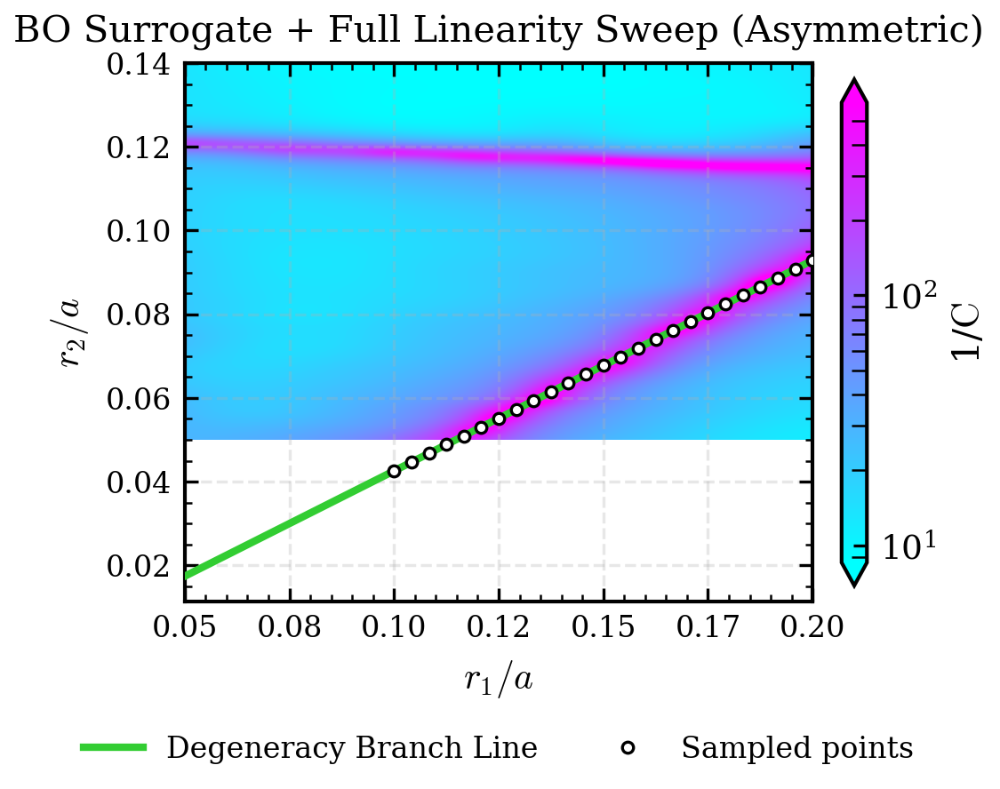

Running 25 simulations with 8 workers...


Simulation Progress:   0%|          | 0/25 [00:00<?, ?it/s]


All 25 simulations completed.


In [ ]:
from matplotlib.ticker import LogLocator, LogFormatterMathtext

# --- 1. MPB Configuration 
config_linearity = dict(
    resolution=RESOLUTION,
    num_bands=9,
    k_points=k_points_2D_optimized["k_points_values"],
    k_points_interpolation_factor=60,
)
mpb_config_lin = MPBSchemeConfigurator(photonic_crystal_2D, ["te"], **config_linearity)
script_lin = mpb_config_lin.get_scheme_config(join_newline=True)

# --- 2. BRANCH SAMPLING 
n_samples = 25
r1_lin = np.linspace(0.1, 0.20, n_samples)

# SELECT THE BRANCH: Using the horizontal fit as the primary target
branch_name = "diagonal"
if branch_name == "horizontal":
    p = p_horiz
else:
    p = p_diag
r2_lin = p(r1_lin) 

print(f"Sampling {len(r1_lin)} points along the full {branch_name} branch")
print(f"  r1 range: [{r1_lin.min():.4f}, {r1_lin.max():.4f}]")
print(f"  r2 range: [{r2_lin.min():.4f}, {r2_lin.max():.4f}]")

# --- 3. BO Surrogate Map + Full Branch Plot (Matched to Target) ---
fig, ax = plt.subplots(1, 1, figsize=ROW1_COL1_SIZE)

# 1. Use "cool" to match the cyan-to-magenta target
current_cmap = "cool" 

# 2. Re-establish levels and norm
levels_lin = np.logspace(np.log10(vmin), np.log10(vmax), 200)

# 3. Plot Contourf
heatmap_lin = ax.contourf(R1, R2, Predicted_FOM_2D, 
                          levels=levels_lin,
                          cmap=current_cmap, 
                          norm=log_norm, 
                          extend='both')

# Create a shared colorbar from the contourf mappable so triangular end-caps appear on both subplots
cbar = fig.colorbar(heatmap_lin, ax=ax, fraction=0.035, pad=0.04, extend='both', format=LogFormatterSciNotation())
cbar.set_label(r"1/$\mathrm{C}$")
cbar.ax.tick_params(labelsize=9)
cbar.locator = LogLocator(base=10.0, numticks=6)
cbar.update_ticks()
# Add minor log ticks to give a glimpse of progress between decades
cbar.ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(2, 10), numticks=12))
cbar.ax.yaxis.set_minor_formatter(plt.NullFormatter())
cbar.ax.tick_params(which='minor', length=4)

# --- Plot the lines/points ---
ax.plot(x_line_ext, p(x_line_ext), color='limegreen', linewidth=2, label='Degeneracy Branch Line', zorder=4)

# White points with black edges match the "Sampled Points" look in the target
ax.plot(r1_lin, r2_lin, color="white", markeredgecolor="black", linestyle="", 
        marker="o", label="Sampled points", markersize=3, markeredgewidth=0.8, zorder=5)

# Formatting
ax.set_xlabel("$r_1/a$")
ax.set_ylabel("$r_2/a$")
ax.set_title("BO Surrogate + Full Linearity Sweep (Asymmetric)")
ax.set_aspect('equal')
ax.grid(alpha=0.3, linestyle='--', zorder=0)

ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.35), ncol=2,
          framealpha=0.95, facecolor='white', edgecolor='black')

plt.show()

# --- 4. Create Simulation Objects (Full List) ---
sims_lin = []
for i, (r1_i, r2_i) in enumerate(zip(r1_lin, r2_lin)):
    sim_name = f"{name_2D_optimized}_lin_{i:03d}"
    sim = Simulation(
        simulation_name=sim_name,
        script=script_lin,
        directory=os.path.join(data_rooth, sim_name)
    )
    sims_lin.append({'r1': r1_i, 'r2': r2_i, 'sim': sim})

# --- 5. Run Concurrent Simulations with run_hpc ---
if SIMULATE is True:
    from concurrent.futures import ThreadPoolExecutor, as_completed
    N_WORKERS = 25

    def run_lin_entry(args):
        j, entry = args
        entry['sim'].run_hpc(
            mpb_command_line_params=dict(r1=entry['r1'], r2=entry['r2']),
            mpi=True, load_epsilon=False)
        return j

    print(f"Running {len(sims_lin)} simulations with {N_WORKERS} workers...")
    with ThreadPoolExecutor(max_workers=N_WORKERS) as pool:
        futures = {pool.submit(run_lin_entry, (j, e)): j for j, e in enumerate(sims_lin)}
        for fut in tqdm(as_completed(futures), total=len(sims_lin), desc="Simulation Progress"):
            j = fut.result()
    print(f"\nAll {len(sims_lin)} simulations completed.")
else:
    print(f"SIMULATE=False → Skipping actual runs.")

In [ ]:
# ================================================================
# For each of the branch points, fix r1 and sweep r2 at Γ
# to find the EXACT band 4–6 degeneracy — using parallel ParamSweepers
# ================================================================
import time
import pandas as pd
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.auto import tqdm # Progress bar
import phc_nzi.sweeper as sweeper_module
from importlib import reload

reload(sweeper_module)
ParamSweeper = sweeper_module.ParamSweeper


COMMANDS ['(define-param h 1e+20)', '(define-param r1 0.1)', '(define-param r2 0.2)']
Sweeping r2 for 25 points (diagonal)


Refining Diagonal Degeneracy:   0%|          | 0/25 [00:00<?, ?it/s]


Correction complete in 66.2s
Mean Gap: 2.45e-04 | Mean Δr2: 0.00048


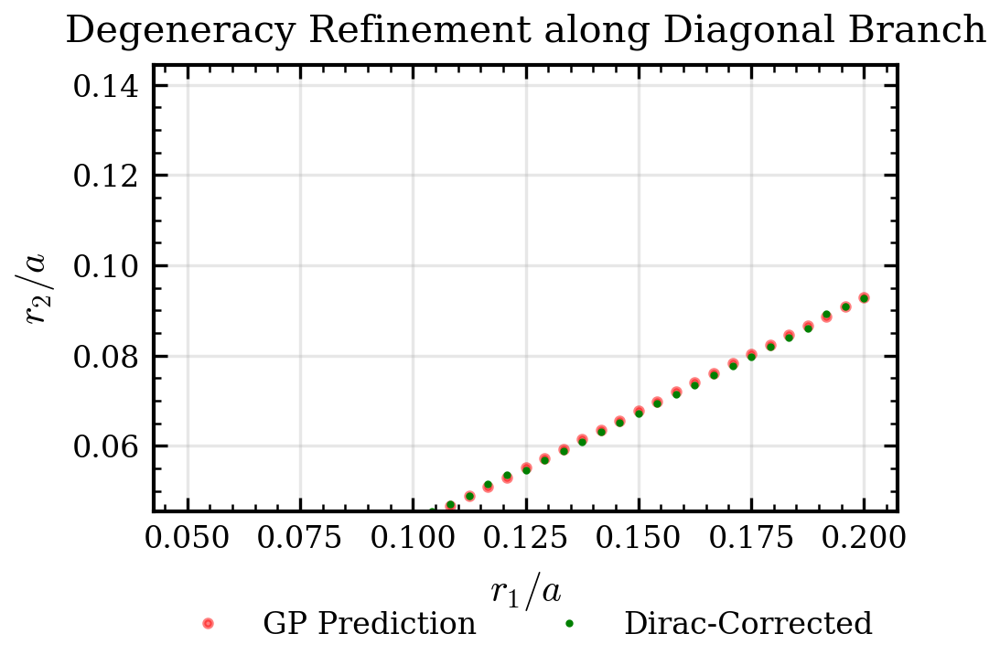

In [ ]:


n_r2_sweep = 20          # number of r2 values per point
r2_half_width = 0.01     # search range: r2_original ± this
N_WORKERS = 25           # number of sweepers to run in parallel

# Gamma-only configuration
config_deg = dict(
    resolution=RESOLUTION,
    num_bands=8,
    k_points=[mp.Vector3(0, 0, 0)],
)
mpb_config_deg = MPBSchemeConfigurator(photonic_crystal_2D, ["te"], **config_deg)
script_deg = mpb_config_deg.get_scheme_config(join_newline=True)

print(f"Sweeping r2 for {len(r1_lin)} points ({branch_name})")

# Build ParamSweepers
sweeper_entries = []
for i in range(len(r1_lin)):
    r1_i = r1_lin[i]
    r2_orig = r2_lin[i]
    r2_lo, r2_hi = max(0.04, r2_orig - r2_half_width), min(0.1, r2_orig + r2_half_width)
    r2_sweep = np.linspace(r2_lo, r2_hi, n_r2_sweep)

    sim_deg = Simulation(
        simulation_name=f"{name_2D_optimized}_deg_{branch_name}_{i:03d}",
        script=script_deg,
        directory=os.path.join(data_rooth, f"{name_2D_optimized}_deg_{branch_name}_{i:03d}")
    )
    sweeper = ParamSweeper(
        simulation=sim_deg,
        param_name="r2",
        values=r2_sweep.tolist(),
        polarization="te",
        bands=[3, 5],
        other_command_line_params={"r1": r1_i}
    )
    sweeper_entries.append({'idx': i, 'r1': r1_i, 'r2_orig': r2_orig, 'r2_sweep': r2_sweep, 'sweeper': sweeper})

t0 = time.time()

def run_and_analyze(entry):
    sw = entry['sweeper']
    if SIMULATE:
        sw.run()
    data = sw.data if len(sw.data) > 0 else sw.load_df()
    gaps = (data['band_5'] - data['band_3']).abs().values
    best = int(np.argmin(gaps))
    r2_corr = entry['r2_sweep'][best]
    
    return {
        'idx': entry['idx'], 'r1': entry['r1'], 'r2_original': entry['r2_orig'],
        'r2_corrected': r2_corr, 'gap_corrected': gaps[best], 'delta_r2': r2_corr - entry['r2_orig'],
        'edge_warning': (best == 0 or best == n_r2_sweep - 1)
    }

# --- Parallel Execution with tqdm Progress Bar ---
corrected_points = []
with ThreadPoolExecutor(max_workers=N_WORKERS) as pool:
    futures = {pool.submit(run_and_analyze, e): e for e in sweeper_entries}
    
    # Progress bar replaces the manual print loop
    with tqdm(total=len(sweeper_entries), desc=f"Refining {branch_name.title()} Degeneracy") as pbar:
        for fut in as_completed(futures):
            res = fut.result()
            corrected_points.append(res)
            if res['edge_warning']:
                # tqdm.write allows printing without breaking the progress bar
                tqdm.write(f"  ⚠ Edge hit at r1={res['r1']:.4f}")
            pbar.update(1)

corrected_points.sort(key=lambda x: x['idx'])
df_corr = pd.DataFrame(corrected_points)

print(f"\nCorrection complete in {time.time()-t0:.1f}s")
print(f"Mean Gap: {df_corr['gap_corrected'].mean():.2e} | Mean Δr2: {df_corr['delta_r2'].abs().mean():.5f}")

# ================================================================
# Plot: Corrected Branch
# ================================================================
fig, ax = plt.subplots(1, 1, figsize=ROW1_COL1_SIZE)

ax.plot(r1_lin, r2_lin, "ro", ms=2, label="GP Prediction", alpha=0.5)

# Filter valid points (avoid overlap)
valid_mask = (df_corr['r1'] + df_corr['r2_corrected']) < (np.sqrt(2)/2 - 0.01)
df_valid = df_corr[valid_mask]

ax.plot(df_valid['r1'], df_valid['r2_corrected'], "go", ms=1, label="Dirac-Corrected")

ax.set_xlabel("$r_1/a$")
ax.set_ylabel("$r_2/a$")
ax.set_title(f"Degeneracy Refinement along {branch_name.title()} Branch")
ax.set_aspect("equal")
ax.grid(alpha=0.3)
ax.set_xlim(xlim); ax.set_ylim(ylim)

ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.35), ncol=2, framealpha=0.95)
plt.show()

In [ ]:
# Create corrected sims_lin and run with k_points_around_gamma
sims_lin = []
for i, row in df_corr.iterrows():
    sim_name = f"{name_2D_optimized}_lin_corr_{i:03d}"
    sim = Simulation(
        simulation_name=sim_name,
        script=script_lin,
        directory=os.path.join(data_rooth, sim_name)
    )
    sims_lin.append({'r1': row['r1'], 'r2': row['r2_corrected'], 'sim': sim})

if SIMULATE is False:
    print(f"SIMULATE=False → Skipping actual runs. Using existing data if available, otherwise will error out when trying to load frequencies.")
else:
    def run_lin_sim(args):
        j, entry = args
        entry['sim'].run_hpc(
            mpb_command_line_params=dict(r1=entry['r1'], r2=entry['r2']),
            mpi=True, load_epsilon=False)
        return j

    print(f"Running {len(sims_lin)} linearity sims with {N_WORKERS} workers...")
    with ThreadPoolExecutor(max_workers=N_WORKERS) as pool:
        futures = {pool.submit(run_lin_sim, (j, e)): j for j, e in enumerate(sims_lin)}
        for fut in as_completed(futures):
            j = fut.result()
            print(f"  [{j+1}/{len(sims_lin)}] r1={sims_lin[j]['r1']:.4f}, r2={sims_lin[j]['r2']:.4f} done")
    print(f"\nAll {len(sims_lin)} corrected simulations completed.")

Running 25 linearity sims with 25 workers...
  [25/25] r1=0.2000, r2=0.0928 done
  [24/25] r1=0.1958, r2=0.0909 done
  [18/25] r1=0.1708, r2=0.0777 done
  [14/25] r1=0.1542, r2=0.0693 done
  [8/25] r1=0.1292, r2=0.0567 done
  [11/25] r1=0.1417, r2=0.0630 done
  [5/25] r1=0.1167, r2=0.0515 done
  [6/25] r1=0.1208, r2=0.0536 done
  [12/25] r1=0.1458, r2=0.0651 done
  [3/25] r1=0.1083, r2=0.0471 done
  [23/25] r1=0.1917, r2=0.0892 done
  [19/25] r1=0.1750, r2=0.0798 done
  [22/25] r1=0.1875, r2=0.0861 done
  [21/25] r1=0.1833, r2=0.0840 done
  [13/25] r1=0.1500, r2=0.0672 done
  [9/25] r1=0.1333, r2=0.0588 done
  [20/25] r1=0.1792, r2=0.0819 done
  [10/25] r1=0.1375, r2=0.0609 done
  [16/25] r1=0.1625, r2=0.0735 done
  [17/25] r1=0.1667, r2=0.0756 done
  [15/25] r1=0.1583, r2=0.0714 done
  [4/25] r1=0.1125, r2=0.0489 done
  [2/25] r1=0.1042, r2=0.0454 done
  [7/25] r1=0.1250, r2=0.0546 done
  [1/25] r1=0.1000, r2=0.0433 done

All 25 corrected simulations completed.


#### Linearity Metrics for all the points

Loading frequencies:   0%|          | 0/25 [00:00<?, ?it/s]

Checking validity:   0%|          | 0/25 [00:00<?, ?it/s]

Identifying outliers:   0%|          | 0/25 [00:00<?, ?it/s]

/tmp/pbs.649804.hnode41/ipykernel_1710778/1190208119.py:45: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(np.array(ff_values)[outlier_mask], gap_values_norm[outlier_mask], c='red', edgecolors='k', marker = 'x')


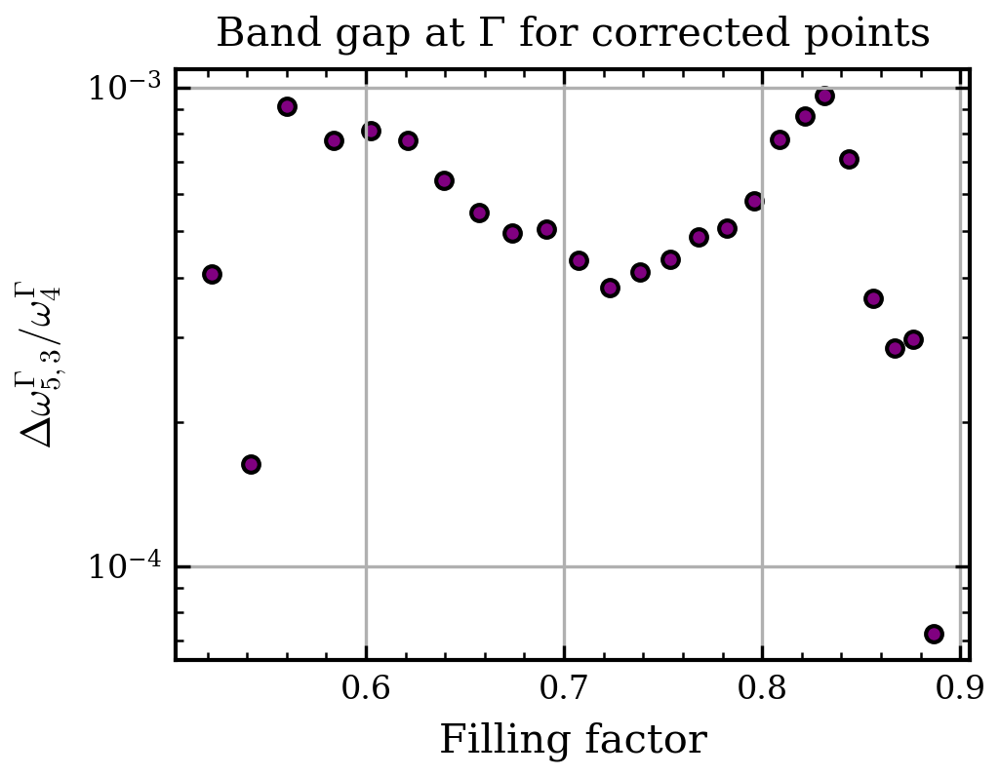

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.interpolate import interp1d

b_idxs = [3,4,5]
target = len(sims_lin) // 2

for i, entry in tqdm(enumerate(sims_lin), total=len(sims_lin), desc="Loading frequencies"):
    df_freq = entry['sim'].load_frequency_data("te")
    gamma_idx = df_freq[(df_freq['k1'] == 0) & (df_freq['k2'] == 0)].index[0]
    entry['gamma_idx'] = gamma_idx
    entry['df_freq'] = df_freq
    entry['f_dirac'] = df_freq["te band 5"].values[gamma_idx]
    entry['k_vecs'] = [(df_freq['k1'].values[j], df_freq['k2'].values[j]) for j in range(len(df_freq))]
    entry['k_idxs'] = list(range(len(df_freq)))
    entry['bands'] = {f"band_{b}": df_freq[f"te band {b}"].values for b in b_idxs}
    entry['ff'] = f_dielectric = 1 - (2 * np.pi / np.sqrt(3)) * (2 * entry['r1']**2 + 6 * entry['r2']**2)

# First we remove the invalid points where r1 + r2 is close to sqrt(2)/2, which corresponds to the boundary of the valid region in the parameter space (since r1 and r2 are radii of holes in a square lattice, they cannot be too large or they will overlap). We can use a threshold to filter out these points. Then we plot the gap between band 6 and band 4 at Gamma, normalized by the frequency of band 5 at Gamma, as a function of the filling factor (ff). We also identify outliers based on the distribution of the normalized gap values and mark them in the plot.
for entry in tqdm(sims_lin, total=len(sims_lin), desc="Checking validity"):
    r1 = entry['r1']
    r2 = entry['r2']
    entry['is_valid'] = (r1 + r2) < (np.sqrt(2) / 2) and not np.isclose(r1 + r2, np.sqrt(2) / 2, atol=0.01)

# Now we remove the points where the band-gap at gamma is not clodes
# This is due to r1 being out of the degeneracy range
partial_valid_entries = [e for e in sims_lin if e['is_valid']]
ff_values = [e['ff'] for e in partial_valid_entries]
gap_values = [abs(e['bands']['band_5'][e['gamma_idx']] - e['bands']['band_3'][e['gamma_idx']]) for e in partial_valid_entries]
b5_values = [e['bands']['band_5'][e['gamma_idx']] for e in partial_valid_entries]
gap_values_norm = np.array(gap_values) / np.array(b5_values)
# Find the outliers (use mean and std)
gap_mean = np.mean(gap_values_norm)
gap_std = np.std(gap_values_norm)
outlier_mask = np.abs(gap_values_norm - gap_mean) > 3 * gap_std
# Flag the entries as invalid if they are outliers
for i, entry in tqdm(enumerate(partial_valid_entries), total=len(partial_valid_entries), desc="Identifying outliers"):
    if outlier_mask[i]:
        entry['is_valid'] = False

# Mark outliers in the plot
plt.figure(figsize=ROW1_COL1_SIZE)
plt.scatter(np.array(ff_values)[~outlier_mask], gap_values_norm[~outlier_mask], c='purple', edgecolors='k')
plt.scatter(np.array(ff_values)[outlier_mask], gap_values_norm[outlier_mask], c='red', edgecolors='k', marker = 'x')
plt.xlabel("Filling factor")
plt.ylabel("$\Delta \omega^\Gamma_{5,3}/\omega_4^\Gamma$")
plt.title("Band gap at Γ for corrected points")
plt.yscale('log')
plt.grid(True)
plt.show()


valid_entries = [e for e in sims_lin if e['is_valid']]
invalid_entries = [e for e in sims_lin if not e['is_valid']]



Fitting bands and calculating isotropy:   0%|          | 0/25 [00:00<?, ?it/s]

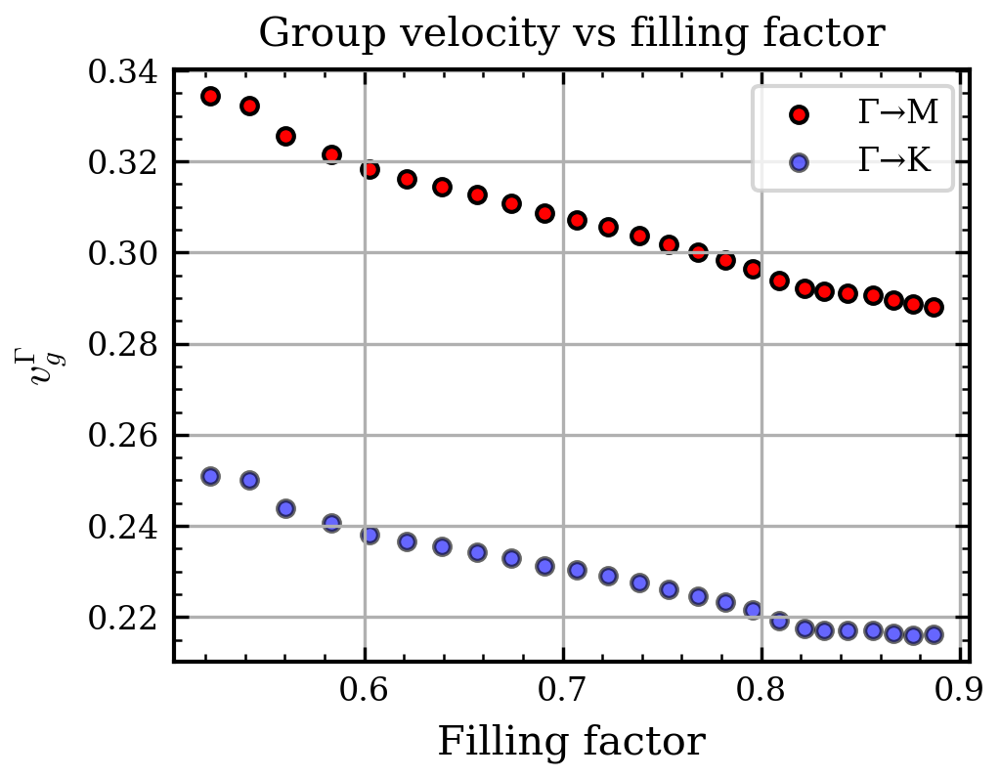

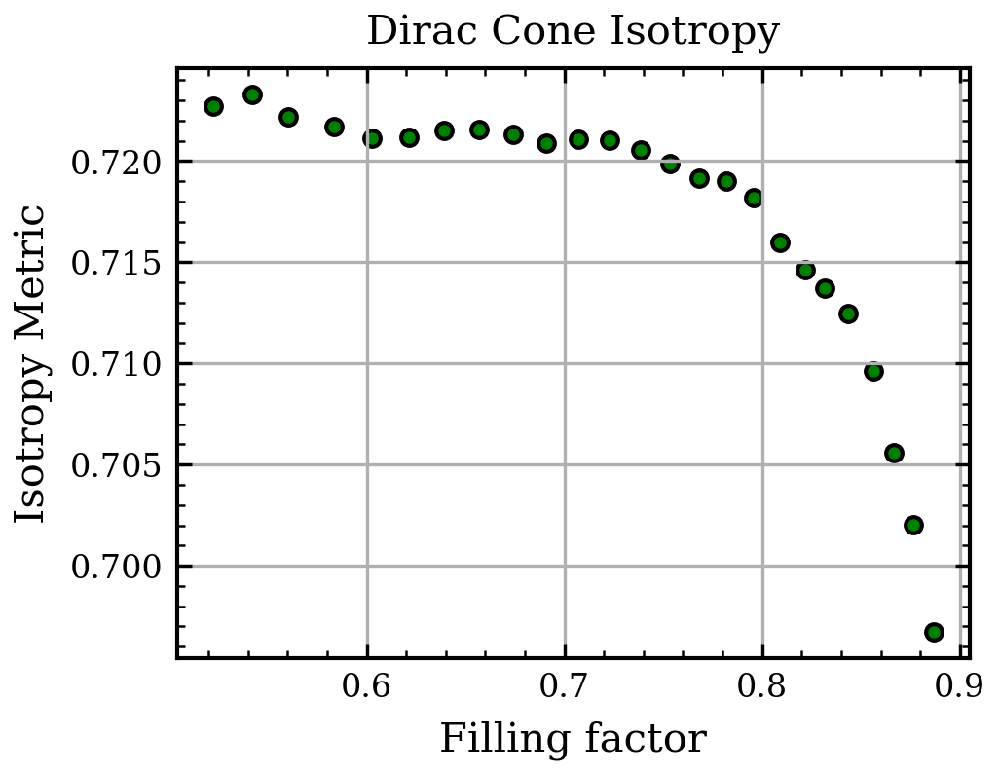

In [ ]:
# Fit Band 6
for i, entry in tqdm(enumerate(valid_entries), total=len(valid_entries), desc="Fitting bands and calculating isotropy"):
    # --- Gamma -> M Direction (ky == 0) ---
    ky_zero_idxs = [j for j, (k1, k2) in enumerate(entry['k_vecs']) if abs(k2) == 0]
    kM_vals = np.array([entry['k_vecs'][j][0] for j in ky_zero_idxs])
    freqs_band3_M = np.array([entry['bands']['band_3'][j] for j in ky_zero_idxs])
    freqs_band4_M = np.array([entry['bands']['band_4'][j] for j in ky_zero_idxs])
    freqs_band5_M = np.array([entry['bands']['band_5'][j] for j in ky_zero_idxs])

    coeffs_M = np.polyfit(kM_vals, freqs_band5_M, deg=3)
    poly_M = np.poly1d(coeffs_M)
    slope_5_M = poly_M.deriv()(0) 

    # --- Gamma -> K Direction (30 degrees: |ky| == |kx|/sqrt(3)) ---
    # We use a small tolerance (atol) because sqrt(3) introduces floating point inaccuracies
    kK_idxs = [j for j, (k1, k2) in enumerate(entry['k_vecs']) if np.isclose(abs(k2), abs(k1) / np.sqrt(3), atol=1e-5)]
    
    # Fallback: if the lattice is rotated 90 degrees, the K point sits at 60 degrees instead of 30
    if len(kK_idxs) == 0:
        kK_idxs = [j for j, (k1, k2) in enumerate(entry['k_vecs']) if np.isclose(abs(k1), abs(k2) / np.sqrt(3), atol=1e-5)]
        
    kK_vals = np.array([np.sign(entry['k_vecs'][j][0]) * np.sqrt(entry['k_vecs'][j][0]**2 + entry['k_vecs'][j][1]**2) for j in kK_idxs])
    freqs_band3_K = np.array([entry['bands']['band_3'][j] for j in kK_idxs])
    freqs_band4_K = np.array([entry['bands']['band_4'][j] for j in kK_idxs])
    freqs_band5_K = np.array([entry['bands']['band_5'][j] for j in kK_idxs])

    coeffs_K = np.polyfit(kK_vals, freqs_band5_K, deg=3)
    poly_K = np.poly1d(coeffs_K)
    slope_5_K = poly_K.deriv()(0) 

    entry["group_velocity_band_6_M"] = slope_5_M
    entry["group_velocity_band_6_K"] = slope_5_K
    
    # --- Analytical Polyfit Isotropy Metric ---
    # 1. Get coefficients (a3, a2, a1, a0)
    a3_M, a2_M, a1_M, a0_M = coeffs_M
    a3_K, a2_K, a1_K, a0_K = coeffs_K
    
    # Define shared evaluation boundary
    k_max = min(np.max(np.abs(kM_vals)), np.max(np.abs(kK_vals)))
    
    # 2. Helper function for the exact polynomial integral area
    def poly_area(a1, a2, a3, k):
        return (a1/2)*k**2 + (a2/3)*k**3 + (a3/4)*k**4
        
    # 3. Calculate exact deviation areas for both directions
    area_dev_M = abs(poly_area(a1_M, a2_M, a3_M, k_max))
    area_dev_K = abs(poly_area(a1_K, a2_K, a3_K, k_max))
    area_dev = 0.5 * (area_dev_M + area_dev_K)
    
    # 4. Calculate exact difference area using the subtracted coefficients
    da1 = a1_M - a1_K
    da2 = a2_M - a2_K
    da3 = a3_M - a3_K
    area_diff = abs(poly_area(da1, da2, da3, k_max))
    
    # 5. Final Metric (1.0 = perfect match, 0.0 = total mismatch)
    entry["isotropy"] = max(0.0, 1.0 - (area_diff / (area_dev + 1e-12)))

    plot_condition = False

        
    if plot_condition:
        plt.figure(figsize=ROW1_COL1_SIZE)  
        plt.plot(kM_vals, freqs_band3_M, "k.-", label="Band 3 (Γ→M)", ms=2)
        plt.plot(kM_vals, freqs_band4_M, "k.-", label="Band 4 (Γ→M)", ms=2)
        plt.plot(kM_vals, freqs_band5_M, "k.-", label="Band 5 (Γ→M)", ms=4)
        plt.plot(kM_vals, poly_M(kM_vals), "r-", label=f"Fit Γ→M ($v_g$={slope_5_M:.4f})")
        
        plt.plot(kK_vals, freqs_band3_K, "gray", marker=".", linestyle="none", label="Band 3 (Γ→K)", ms=2)
        plt.plot(kK_vals, freqs_band4_K, "gray", marker=".", linestyle="none", label="Band 4 (Γ→K)", ms=2)
        plt.plot(kK_vals, freqs_band5_K, "gray", marker=".", linestyle="none", label="Band 5 (Γ→K)", ms=4)
        plt.plot(kK_vals, poly_K(kK_vals), "b-", label=f"Fit Γ→K ($v_g$={slope_5_K:.4f})")

        plt.xlabel("$|k|$ from Γ")
        plt.ylabel("$\omega a/2\pi c$")
        plt.title(f"Dirac Cone Fits for entry {i} (FF {entry['ff']:.4f})\nWhole-Band Isotropy: {entry['isotropy']:.4f}")
        plt.legend()
        plt.grid(True)
        plt.show()

# --- Global Figures ---

ff_values = [e['ff'] for e in valid_entries]

# Group Velocities Plot
plt.figure(figsize=ROW1_COL1_SIZE)
plt.scatter(np.array(ff_values), 
            np.array([e['group_velocity_band_6_M'] for e in valid_entries]), 
            c='red', edgecolors='k', label='Γ→M')
plt.scatter(np.array(ff_values), 
            np.array([e['group_velocity_band_6_K'] for e in valid_entries]), 
            c='blue', edgecolors='k', label='Γ→K', alpha=0.6)
plt.xlabel("Filling factor")
plt.ylabel("$v_g^\Gamma$")
plt.title("Group velocity vs filling factor")
plt.legend(frameon=True)
plt.grid(True)
plt.show()

# Isotropy Metric Plot
plt.figure(figsize=ROW1_COL1_SIZE)
plt.scatter(np.array(ff_values), 
            np.array([e['isotropy'] for e in valid_entries]), 
            c='green', edgecolors='k')
plt.xlabel("Filling factor")
plt.ylabel("Isotropy Metric")
plt.title("Dirac Cone Isotropy")
plt.grid(True)
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.optimize import curve_fit
from scipy.special import erf

def compute_band5_polyfit(entry):
    """
    Fits a 3rd-degree polynomial to Band 5 along Hexagonal high-symmetry directions.
    M direction: 0 degrees (ky = 0)
    K direction: 30 degrees (abs(ky) = abs(kx) / sqrt(3))
    """
    # --- Gamma -> M Direction (ky == 0) ---
    kM_idxs = [j for j, (_, k2) in enumerate(entry["k_vecs"]) if np.isclose(k2, 0, atol=1e-5)]
    kx_vals_M = np.array([entry["k_vecs"][j][0] for j in kM_idxs])
    freqs_band5_M = np.array([entry["bands"]["band_5"][j] for j in kM_idxs])
    
    # Sort by magnitude from Gamma
    sort_m = np.argsort(np.abs(kx_vals_M))
    entry["band5_poly_coeffs_M"] = np.polyfit(np.abs(kx_vals_M)[sort_m], freqs_band5_M[sort_m], deg=3)

    # --- Gamma -> K Direction (30 degrees: |ky| == |kx|/sqrt(3)) ---
    # Note: We use a tolerance for floating point k-vectors
    kK_idxs = [j for j, (k1, k2) in enumerate(entry["k_vecs"]) if np.isclose(abs(k2), abs(k1) / np.sqrt(3), atol=1e-5)]
    
    # Fallback in case your lattice is rotated 90 degrees (K at 60 degrees)
    if len(kK_idxs) == 0:
        kK_idxs = [j for j, (k1, k2) in enumerate(entry["k_vecs"]) if np.isclose(abs(k1), abs(k2) / np.sqrt(3), atol=1e-5)]
        
    kK_dist = np.array([np.sqrt(entry["k_vecs"][j][0]**2 + entry["k_vecs"][j][1]**2) for j in kK_idxs])
    freqs_band5_K = np.array([entry["bands"]["band_5"][j] for j in kK_idxs])
    
    sort_k = np.argsort(kK_dist)
    entry["band5_poly_coeffs_K"] = np.polyfit(kK_dist[sort_k], freqs_band5_K[sort_k], deg=3)


def linearity_metric_v1(entry, direction="M"):
    """
    Inverse Effective Mass Metric (1/m*).
    Direction should be "M" or "K".
    """
    coeffs = entry[f"band5_poly_coeffs_{direction}"]
    # f(k) = a3*k^3 + a2*k^2 + a1*k + a0 -> f''(0) = 2*a2
    a2 = coeffs[1]
    curvature_at_gamma = 2 * a2
    return 1 / (abs(curvature_at_gamma) + 1e-12)


def linearity_metric_v2(entry, delta_k=0.05, direction="M"):
    """
    Linear-to-Nonlinear Ratio Metric for Hexagonal directions.
    """
    a3, a2, a1, _ = entry[f"band5_poly_coeffs_{direction}"]
    
    linear_term = abs(a1 * delta_k)
    nonlinear_terms = abs(a2 * delta_k**2) + abs(a3 * delta_k**3)
    
    return linear_term / (nonlinear_terms + 1e-12)

def skew_gaussian(x, A, mu, sigma, alpha):
    norm = (x - mu) / sigma
    gauss = np.exp(-(norm ** 2) / 2.0)
    skew = 0.5 * (1 + erf(alpha * norm / np.sqrt(2)))
    return A * gauss * skew * 2

Computing linearity metrics:   0%|          | 0/25 [00:00<?, ?it/s]

Metric 1 Fit (1/m*): A=4.72, mu=0.5784, sigma=0.1635, alpha=0.00
\delta k=0.005 Fit: A=3526.47, mu=0.5519, sigma=0.0555, alpha=7.75
\delta k=0.100 Fit: A=18.47, mu=0.4930, sigma=0.2008, alpha=3.33


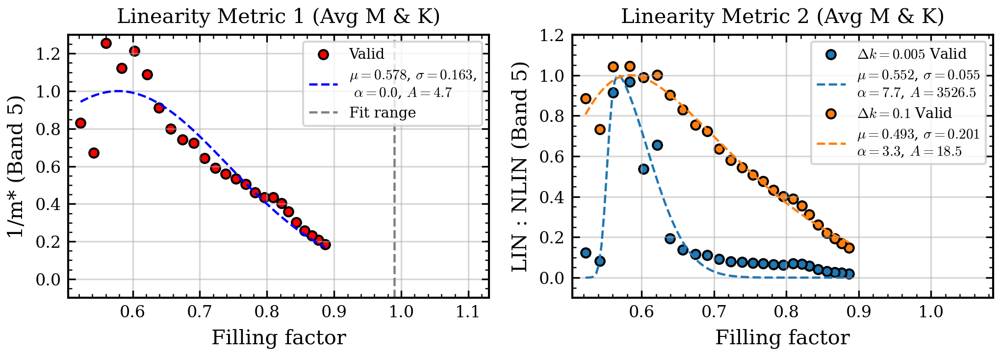

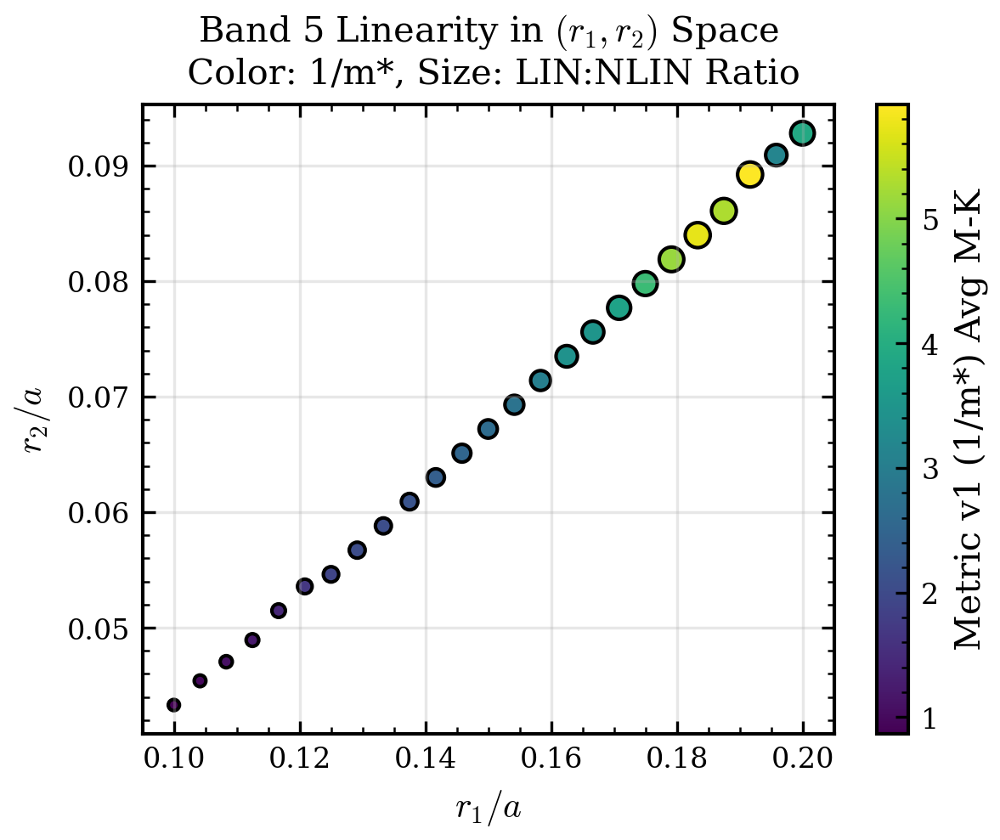

In [ ]:
# --- Update the loop for Hexagonal Lattice and Band 5 ---
for e in tqdm(valid_entries, desc="Computing linearity metrics"):
    compute_band5_polyfit(e)
    
    # Average metrics across both Hexagonal directions: M (0°) and K (30°)
    v1_M = linearity_metric_v1(e, "M")
    v1_K = linearity_metric_v1(e, "K")
    # e["linearity_metric_v1"] = 0.5 * (v1_M + v1_K)
    e["linearity_metric_v1"] = v1_M
    
    v2_M = linearity_metric_v2(e, delta_k=delta_k, direction="M")
    v2_K = linearity_metric_v2(e, delta_k=delta_k, direction="K")
    # e["linearity_metric_v2"] = 0.5 * (v2_M + v2_K)
    e["linearity_metric_v2"] = v2_M

# --- Extract arrays (Length N) ---
ff_a = np.array([e["ff"] for e in valid_entries])
lm_v1_a = np.array([e["linearity_metric_v1"] for e in valid_entries])
lm_v2_a = np.array([e["linearity_metric_v2"] for e in valid_entries])

# Mask for the fit range
ff_cut_left = 0.1
ff_cut_right = 0.99
fit_mask = (ff_a > ff_cut_left) & (ff_a < ff_cut_right)
x_fit = np.linspace(min(ff_a), max(ff_a), 100)

# --- 4. First Skew-Gaussian Fit (Metric 1) ---
p0_guesses = [lm_v1_a.max(), ff_a.mean(), 0.05, -2.0]
popt, _ = curve_fit(skew_gaussian, ff_a[fit_mask], lm_v1_a[fit_mask], p0=p0_guesses, maxfev=5000)
A_fit, mu_fit, sigma_fit, alpha_fit = popt
print(rf"Metric 1 Fit (1/m*): A={A_fit:.2f}, mu={mu_fit:.4f}, sigma={sigma_fit:.4f}, alpha={alpha_fit:.2f}")

# --- 5. Plotting Subplots ---
plt.figure(figsize=ROW1_COL2_SIZE)
y_fit = skew_gaussian(x_fit, *popt)
true_max = np.max(y_fit)

# --- Left Subplot: Inverse Effective Mass (1/m*) ---
plt.subplot(1, 2, 1)
plt.scatter(ff_a, lm_v1_a / true_max, c="red", edgecolors="k", s=20, label="Valid")
plt.plot(x_fit, y_fit / true_max, "b--", label=rf"$\mu={mu_fit:.3f}$, $\sigma={sigma_fit:.3f}$," + "\n" + rf" $\alpha={alpha_fit:.1f}$, $A={A_fit:.1f}$")

xlims = plt.xlim()
plt.xlim(xlims[0], xlims[1]*1.25) 
plt.ylim(-0.1, 1.3) 

ymin, ymax = plt.ylim()
plt.vlines(ff_cut_left, ymin, ymax, colors="gray", linestyles="--", label="Fit range")
plt.vlines(ff_cut_right, ymin, ymax, colors="gray", linestyles="--")
plt.xlabel("Filling factor")
plt.ylabel("1/m* (Band 5)")
plt.title(r"Linearity Metric 1 (Avg M & K)")
plt.grid(True, alpha=0.5)
plt.legend(loc="best", fontsize=7, frameon=True)

# --- Right Subplot: Normalized Metric v2 ---
plt.subplot(1, 2, 2)
dks = [0.005, delta_k] # delta_k assumed to be 0.05 from previous context

for i, dk in enumerate(dks):
    # Calculate full array dynamically using Hexagonal directions M and K
    lm_v2_dk = np.array([0.5 * (linearity_metric_v2(e, dk, "M") + linearity_metric_v2(e, dk, "K")) for e in valid_entries])

    p0_v2 = [lm_v2_dk.max(), ff_a.mean(), 0.05, -2.0]
    popt_v2, _ = curve_fit(skew_gaussian, ff_a, lm_v2_dk, p0=p0_v2, maxfev=5000)
    A_v2, mu_v2, sigma_v2, alpha_v2 = popt_v2
    print(rf"\delta k={dk:.3f} Fit: A={A_v2:.2f}, mu={mu_v2:.4f}, sigma={sigma_v2:.4f}, alpha={alpha_v2:.2f}")

    y_fit_v2 = skew_gaussian(x_fit, *popt_v2)
    true_max_v2 = np.max(y_fit_v2)

    plt.scatter(ff_a, lm_v2_dk / true_max_v2, edgecolors="k", s=20, label=rf"$\Delta k={dk}$ Valid")
    plt.plot(x_fit, y_fit_v2 / true_max_v2, "--", label=rf"$\mu={mu_v2:.3f}$, $\sigma={sigma_v2:.3f}$" + "\n" + rf"$\alpha={alpha_v2:.1f}$, $A={A_v2:.1f}$")

xlims = plt.xlim()
plt.xlim(xlims[0], xlims[1]*1.2) 
plt.ylim(-0.1, 1.2) 
plt.xlabel("Filling factor")
plt.ylabel(r"LIN : NLIN (Band 5)")
plt.title("Linearity Metric 2 (Avg M & K)")
plt.grid(True, alpha=0.5)
plt.legend(loc="upper right", fontsize=7, frameon=True)
plt.tight_layout()

if 'figure_path' in globals():
    plt.savefig(os.path.join(figure_path, "linearity_metrics_vs_ff_hexagonal.png"))   
plt.show()

# --- 6. Vectorized (r1, r2) Space Plot ---
plt.figure(figsize=(4.2, 3.5))

if 'invalid_entries' in locals() and invalid_entries:
    r1_inv = [e["r1"] for e in invalid_entries]
    r2_inv = [e["r2"] for e in invalid_entries]
    plt.scatter(r1_inv, r2_inv, c="red", s=20, label="Invalid", marker ="x")

r1_a = np.array([e["r1"] for e in valid_entries], dtype=float)
r2_a = np.array([e["r2"] for e in valid_entries], dtype=float)

# Size mapping based on Band 5 LIN:NLIN ratio
s_min, s_max = 10.0, 50.0
v2_min, v2_max = np.min(lm_v2_a), np.max(lm_v2_a)
if np.isclose(v2_max, v2_min):
    sizes_a = np.full_like(lm_v2_a, (s_min + s_max) / 2.0)
else:
    sizes_a = s_min + (lm_v2_a - v2_min) * (s_max - s_min) / (v2_max - v2_min)
    sizes_a = np.clip(sizes_a, s_min, s_max)

sc = plt.scatter(r1_a, r2_a, c=lm_v1_a, s=sizes_a, cmap="viridis", edgecolors="k")

plt.colorbar(sc, label=r"Metric v1 (1/m*) Avg M-K")
plt.xlabel("$r_1/a$")
plt.ylabel("$r_2/a$")
plt.title(r"Band 5 Linearity in $(r_1, r_2)$ Space" + "\n Color: 1/m*, Size: LIN:NLIN Ratio")

if 'invalid_entries' in locals() and invalid_entries:
    plt.legend(loc="best", fontsize=8)
plt.grid(True, alpha=0.3)
plt.tight_layout()

if 'figure_path' in globals():
    plt.savefig(os.path.join(figure_path, "linearity_metrics_vs_r1_r2_hexagonal.png"))
plt.show()

#### Linearity vs Concentration Factor

COMMANDS ['(define-param h 1e+20)', '(define-param r1 0.1)', '(define-param r2 0.2)']
Running 25 Γ-only simulations with E-field output …
  [24/25] r1=0.1958, r2=0.0909 done
  [25/25] r1=0.2000, r2=0.0928 done
  [23/25] r1=0.1917, r2=0.0892 done
  [20/25] r1=0.1792, r2=0.0819 done
  [21/25] r1=0.1833, r2=0.0840 done
  [13/25] r1=0.1500, r2=0.0672 done
  [17/25] r1=0.1667, r2=0.0756 done
  [15/25] r1=0.1583, r2=0.0714 done
  [11/25] r1=0.1417, r2=0.0630 done
  [18/25] r1=0.1708, r2=0.0777 done
  [22/25] r1=0.1875, r2=0.0861 done
  [19/25] r1=0.1750, r2=0.0798 done
  [5/25] r1=0.1167, r2=0.0515 done
  [4/25] r1=0.1125, r2=0.0489 done
  [12/25] r1=0.1458, r2=0.0651 done
  [16/25] r1=0.1625, r2=0.0735 done
  [6/25] r1=0.1208, r2=0.0536 done
  [9/25] r1=0.1333, r2=0.0588 done
  [10/25] r1=0.1375, r2=0.0609 done
  [14/25] r1=0.1542, r2=0.0693 done
  [8/25] r1=0.1292, r2=0.0567 done
  [7/25] r1=0.1250, r2=0.0546 done
  [1/25] r1=0.1000, r2=0.0433 done
  [2/25] r1=0.1042, r2=0.0454 done
  [3/2

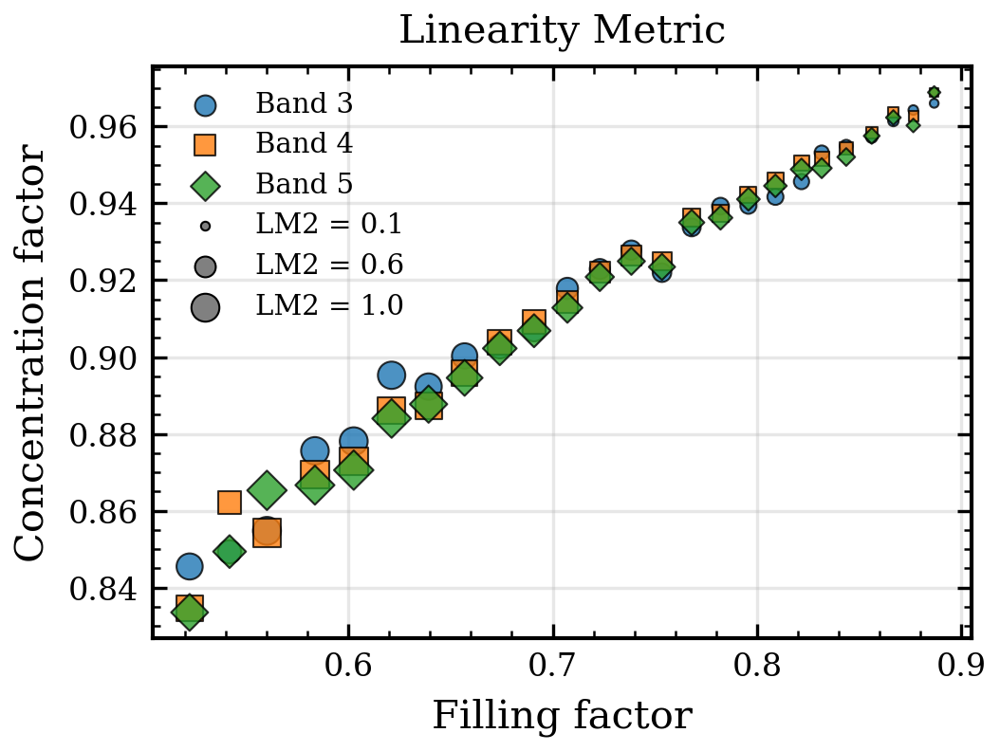

<IPython.core.display.Math object>

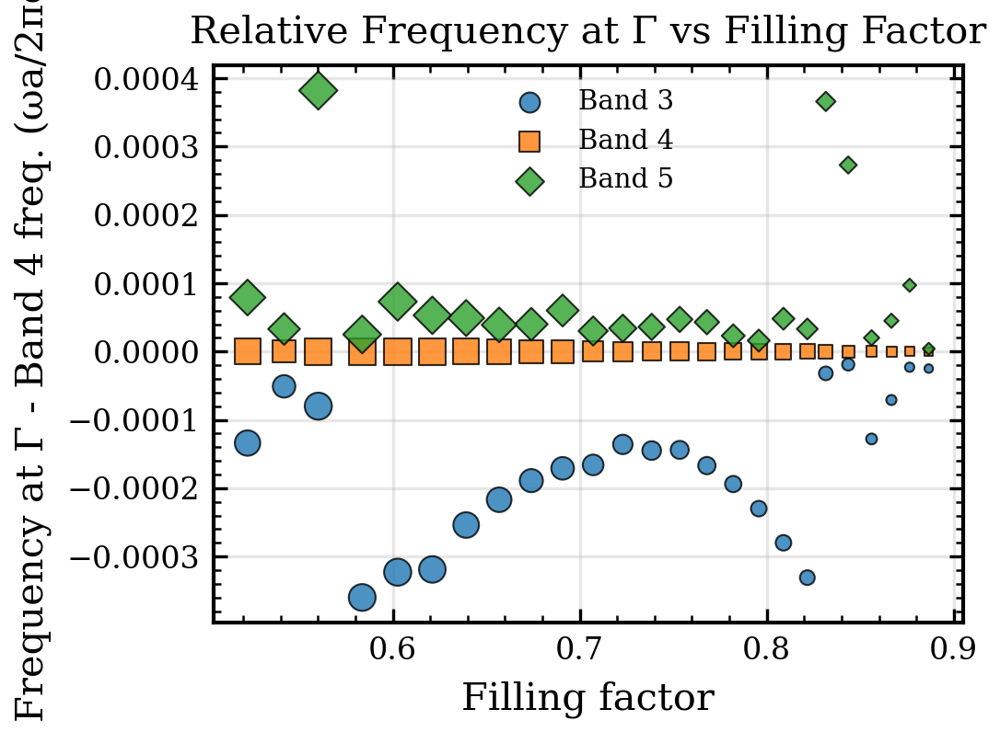

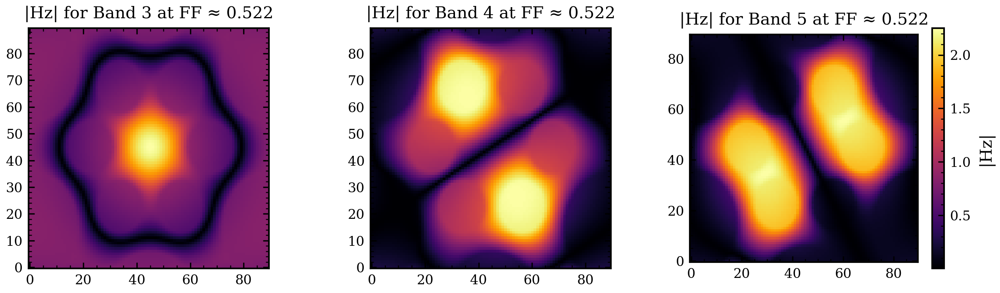

In [ ]:
# Raw data
# ===========================================================================
# Filling Factor vs Concentration Factor, dot size ∝ Linearity Metric 2
# ===========================================================================
# CF(band) = ∫_diel ε|E|² / ∫_all ε|E|²   at Γ
# ===========================================================================
import json

cf_cache_path = os.path.join(data_rooth, f"{name_2D_optimized}_cf_lin_cache.json")

# --- Gamma-only config WITH E-field output ---
config_cf_lin = dict(
    resolution=RESOLUTION - 6,
    num_bands=9,
    k_points=[mp.Vector3(0, 0, 0)],
    extra_runner_command="fix-hfield-phase output-efield output-hfield",
)
mpb_config_cf_lin = MPBSchemeConfigurator(photonic_crystal_2D, ["te"], **config_cf_lin)
script_cf_lin = mpb_config_cf_lin.get_scheme_config(join_newline=True)

# --- One Simulation per valid sims_lin entry ---
valid_entries_cf = valid_entries
sims_cf_lin = []
for j, entry in enumerate(valid_entries_cf):
    sim_name = f"{name_2D_optimized}_cf_lin_{j:03d}"
    sim_cf = Simulation(
        simulation_name=sim_name,
        script=script_cf_lin,
        directory=os.path.join(data_rooth, sim_name),
    )
    sims_cf_lin.append({
        'r1': entry['r1'], 'r2': entry['r2'], 'sim': sim_cf,
        'entry': entry,
    })

# --- Run (fast – single k-point) ---
if SIMULATE:
    print(f"Running {len(sims_cf_lin)} Γ-only simulations with E-field output …")
    def run_cf_sim(args):
        j, s = args
        s['sim'].run_hpc(
            mpb_command_line_params=dict(r1=s['r1'], r2=s['r2']),
            mpi=True, load_epsilon=False)
        return j

    with ThreadPoolExecutor(max_workers=N_WORKERS) as pool:
        futures = {pool.submit(run_cf_sim, (j, s)): j for j, s in enumerate(sims_cf_lin)}
        for fut in as_completed(futures):
            j = fut.result()
            print(f"  [{j+1}/{len(sims_cf_lin)}] r1={sims_cf_lin[j]['r1']:.4f}, "
                  f"r2={sims_cf_lin[j]['r2']:.4f} done")
    print("All CF-linearity simulations completed.")
else:
    print("SIMULATE=False → loading existing CF data")

# --- Compute or load concentration factors for bands 4, 5, 6 ---
bands_cf_lin = [3,4,5]
opt_cf_lin = MPBDataOptions(rectify=True, periods=1)

if os.path.exists(cf_cache_path) and not SIMULATE:
    # Load cached CF data
    with open(cf_cache_path, 'r') as f:
        cf_cache = json.load(f)
    cf_lin_data = {int(k): v for k, v in cf_cache.items()}
    print(f"Loaded cached CF data from {cf_cache_path} ({len(cf_lin_data[bands_cf_lin[0]])} entries)")
else:
    # Compute CF from simulation field data
    cf_lin_data = {b: [] for b in bands_cf_lin}

    for j, s in enumerate(sims_cf_lin):
        sim = s['sim']
        try:
            eps = sim.load_and_convert_epsilon_data(options=opt_cf_lin)
            if eps.ndim == 3:
                eps = eps[:, :, eps.shape[2] // 2]

            eps_mid = (1.0 + eps.max()) / 2.0
            diel_mask = eps > eps_mid

            for band in bands_cf_lin:
                Ex = sim.load_and_convert_field_data(
                    1, band, "x", "te", "e", conversion_options=opt_cf_lin)
                Ey = sim.load_and_convert_field_data(
                    1, band, "y", "te", "e", conversion_options=opt_cf_lin)
                if Ex.ndim == 3:
                    Ex = Ex[:, :, Ex.shape[2] // 2]
                if Ey.ndim == 3:
                    Ey = Ey[:, :, Ey.shape[2] // 2]

                eps_Esq = eps * (np.abs(Ex)**2 + np.abs(Ey)**2)
                total = eps_Esq.sum()
                cf = float(eps_Esq[diel_mask].sum() / total) if total > 0 else None
                cf_lin_data[band].append(cf)

        except Exception as e:
            print(f"  Error j={j}, r1={s['r1']:.4f}, r2={s['r2']:.4f}: {e}")
            for band in bands_cf_lin:
                cf_lin_data[band].append(None)

    # Save to cache
    cf_cache_save = {str(k): v for k, v in cf_lin_data.items()}
    with open(cf_cache_path, 'w') as f:
        json.dump(cf_cache_save, f)
    print(f"Saved CF data to {cf_cache_path}")

    # Convert None → NaN for numpy compatibility
    cf_lin_data = {b: [x if x is not None else float('nan') for x in vals]
                   for b, vals in cf_lin_data.items()}

# Store CF back into valid entries
for j, s in enumerate(sims_cf_lin):
    for band in bands_cf_lin:
        s['entry'][f'cf_band_{band}'] = cf_lin_data[band][j]

# --- Compute linearity metric v2 for chosen delta_k ---
delta_k_plot = delta_k
lm_v2_vals = np.array([linearity_metric_v2(s['entry'], delta_k=delta_k_plot) for s in sims_cf_lin])
# Normalize by max for better plotting
lm_v2_vals /= lm_v2_vals.max()
ff_cf = np.array([s['entry']['ff'] for s in sims_cf_lin])

print(f"\nConcentration-factor statistics (N = {len(sims_cf_lin)}, Δk = {delta_k_plot}):")
for band in bands_cf_lin:
    v = np.array(cf_lin_data[band], dtype=float)
    v = v[~np.isnan(v)]
    if len(v) > 0:
        print(f"  Band {band}: CF = {v.mean():.4f} ± {v.std():.4f}  [{v.min():.4f}, {v.max():.4f}]")

# ===========================================================================
# 2D Plot: x = Filling Factor, y = Concentration Factor
#          dot size ∝ Linearity Metric 2,  dot color = band
# ===========================================================================
band_colors = {3: 'tab:blue', 4: 'tab:orange', 5: 'tab:green'}
band_markers = {3: 'o', 4: 's', 5: 'D'}

# Normalize LM2 to dot sizes
size_min_lm, size_max_lm = 5, 50
lm_min, lm_max = lm_v2_vals.min(), lm_v2_vals.max()
if lm_max > lm_min:
    lm_norm = (lm_v2_vals - lm_min) / (lm_max - lm_min)
else:
    lm_norm = np.ones_like(lm_v2_vals) * 0.5
dot_sizes_lm = size_min_lm + (size_max_lm - size_min_lm) * lm_norm

fig, ax = plt.subplots( constrained_layout=True)

for band in [3,4,5]:
    cf_vals = np.array(cf_lin_data[band], dtype=float)
    ax.scatter(ff_cf, cf_vals,
               s=dot_sizes_lm,
               color=band_colors[band], marker=band_markers[band],
               edgecolors='k', linewidth=0.5, alpha=0.8, zorder=3,
               label=f'Band {band}')

ax.set_xlabel('Filling factor')
ax.set_ylabel(r'Concentration factor')
ax.set_title(f'Linearity Metric')
ax.grid(True, alpha=0.3)

# Size legend for LM2 values
for lm_leg in [lm_min, 0.5 * (lm_min + lm_max), lm_max]:
    s_leg = size_min_lm + (size_max_lm - size_min_lm) * (
        (lm_leg - lm_min) / (lm_max - lm_min) if lm_max > lm_min else 0.5)
    ax.scatter([], [], s=s_leg, c='gray', edgecolors='k', linewidth=0.5,
               label=f'LM2 = {lm_leg:.1f}')

ax.legend(loc='best', fontsize=7)
plt.savefig(os.path.join(figure_path, "linearity_metric_v2_vs_CF.png"))
plt.show()


# Latex display of the confinement factor formula
from IPython.display import display, Math
formula = r"""
\text{CF} = \frac{\int_{\text{dielectric}} \varepsilon |\mathbf{E}|^2 \, dV}{\int_{\text{all}} \varepsilon |\mathbf{E}|^2 \, dV}
"""
display(Math(formula))

# In a new figure, plot the frequencies at gamma for bands 3,4,5 against filling factor, with dot size ∝ LM2
# Subtract the frequency of band 5 at gamma from all bands
fig, ax = plt.subplots(figsize=ROW1_COL1_SIZE)

# Get band 4 frequencies at gamma for reference
freqs_band4_gamma = np.array([s['entry']['bands'][f'band_4'][s['entry']['gamma_idx']] for s in sims_cf_lin], dtype=float)

for band in bands_cf_lin:
    freqs_gamma = np.array([s['entry']['bands'][f'band_{band}'][s['entry']['gamma_idx']] for s in sims_cf_lin], dtype=float)
    # Subtract band 4 frequency
    freqs_gamma_diff = freqs_gamma - freqs_band4_gamma
    valid_mask = ~np.isnan(freqs_gamma_diff)
    ax.scatter(ff_cf[valid_mask], freqs_gamma_diff[valid_mask],
               s=dot_sizes_lm[valid_mask],
               color=band_colors[band], marker=band_markers[band],
               edgecolors='k', linewidth=0.5, alpha=0.8, zorder=3,
               label=f'Band {band}')
ax.set_xlabel('Filling factor')
ax.set_ylabel(r'Frequency at Γ - Band 4 freq. (ωa/2πc)')
ax.set_title('Relative Frequency at Γ vs Filling Factor')
ax.grid(True, alpha=0.3)
ax.legend(loc='best', fontsize=7)
plt.savefig(os.path.join(figure_path, "gamma_frequencies_vs_ff.png"))
plt.show()

# Plot Hz for the bands with FF closest to 0.8 
target_ff = 0.38
closest_idx = np.argmin(np.abs(ff_cf - target_ff))
sim_closest = sims_cf_lin[closest_idx]['sim']
fig, axs = plt.subplots(1,3, figsize=ROW1_COL3_SIZE)
for band, ax in zip(bands_cf_lin, axs):
    Hz = sim_closest.load_and_convert_field_data(
        1, band, "z", "te", "h", conversion_options=opt_cf_lin)
    if Hz.ndim == 3:
        Hz = Hz[:, :, Hz.shape[2] // 2]
    im = ax.imshow(np.abs(Hz.T), origin='lower', cmap='inferno')
    ax.set_title(f'|Hz| for Band {band} at FF ≈ {ff_cf[closest_idx]:.3f}')
plt.colorbar(im, ax=ax, label='|Hz|')
plt.savefig(os.path.join(figure_path, f"Hz_band_{band}_ff_{ff_cf[closest_idx]:.3f}.png"))
plt.show()


We need a moderate but not excessive confinement of the doubly degenerate modes in the dielectric

### Effective parameters

#### Points selection

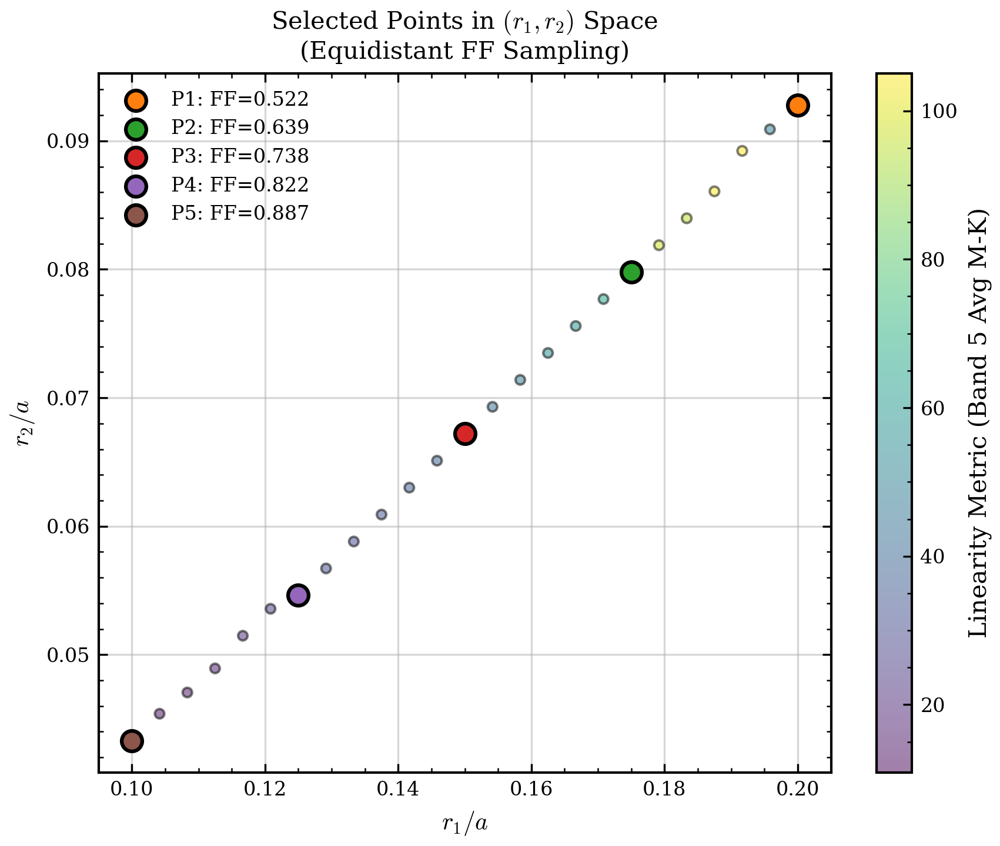

--- Selected Point Geometries (Equidistant FF) ---
Point 1              | r1: 0.2000, r2: 0.0928, FF: 0.5224
Point 2              | r1: 0.1750, r2: 0.0798, FF: 0.6393
Point 3              | r1: 0.1500, r2: 0.0672, FF: 0.7385
Point 4              | r1: 0.1250, r2: 0.0546, FF: 0.8217
Point 5              | r1: 0.1000, r2: 0.0433, FF: 0.8866


In [ ]:
# --- 1. Filter, Sort, and Sample 5 Points ---
valid_entries_sorted = sorted(valid_entries, key=lambda e: e["ff"])
n_total = len(valid_entries_sorted)
indices = np.linspace(0, n_total - 1, 5).astype(int)
selected_points = [valid_entries_sorted[idx] for idx in indices]

# --- 2. Extract Data for Plotting ---
r1_v = [e["r1"] for e in valid_entries_sorted]
r2_v = [e["r2"] for e in valid_entries_sorted]

# Ensure metrics are calculated for Band 5 / Hexagonal
for e in valid_entries_sorted:
    compute_band5_polyfit(e)
    v2_M = linearity_metric_v2(e, delta_k=0.05, direction="M")
    v2_K = linearity_metric_v2(e, delta_k=0.05, direction="K")
    e["linearity_metric_v2"] = 0.5 * (v2_M + v2_K)

metrics = np.array([e["linearity_metric_v2"] for e in valid_entries_sorted])
highlight_colors = ['#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

# ==========================================
# (r1, r2) Parameter Space Plot (As before)
# ==========================================
fig = plt.figure(figsize=(6, 5)) # Adjusted to single plot size
ax2 = fig.add_subplot(1, 1, 1)

# Plot invalid points underneath if any exist
if 'invalid_entries' in locals() and invalid_entries:
    r1_inv = [e["r1"] for e in invalid_entries]
    r2_inv = [e["r2"] for e in invalid_entries]
    ax2.scatter(r1_inv, r2_inv, c="lightgray", edgecolors="k", s=15, label="Invalid", zorder=1)

# Plot all valid points colored by their unnormalized linearity metric
sc = ax2.scatter(r1_v, r2_v, c=metrics, cmap="viridis", edgecolors="k", s=15, alpha=0.5, zorder=2)
fig.colorbar(sc, ax=ax2, label="Linearity Metric (Band 5 Avg M-K)")

# Overlay the 5 selected points with matching colors and standard circular markers
for i, point in enumerate(selected_points):
    ax2.scatter(point["r1"], point["r2"],
                s=70, facecolor=highlight_colors[i], edgecolors='k', linewidth=1.5, 
                label=f'P{i+1}: FF={point["ff"]:.3f}', zorder=3)

ax2.set_xlabel("$r_1/a$")
ax2.set_ylabel("$r_2/a$")
ax2.set_title("Selected Points in $(r_1, r_2)$ Space\n(Equidistant FF Sampling)")
ax2.grid(True, alpha=0.5)
ax2.legend(loc='best', fontsize=8)

plt.tight_layout()
if 'figure_path' in globals():
    plt.savefig(os.path.join(figure_path, "target_points_hex.png"))  
plt.show()

# Print out the exact parameters for your records
print("--- Selected Point Geometries (Equidistant FF) ---")
for i, point in enumerate(selected_points):
    print(f"Point {i+1:<14} | r1: {point['r1']:.4f}, r2: {point['r2']:.4f}, FF: {point['ff']:.4f}")

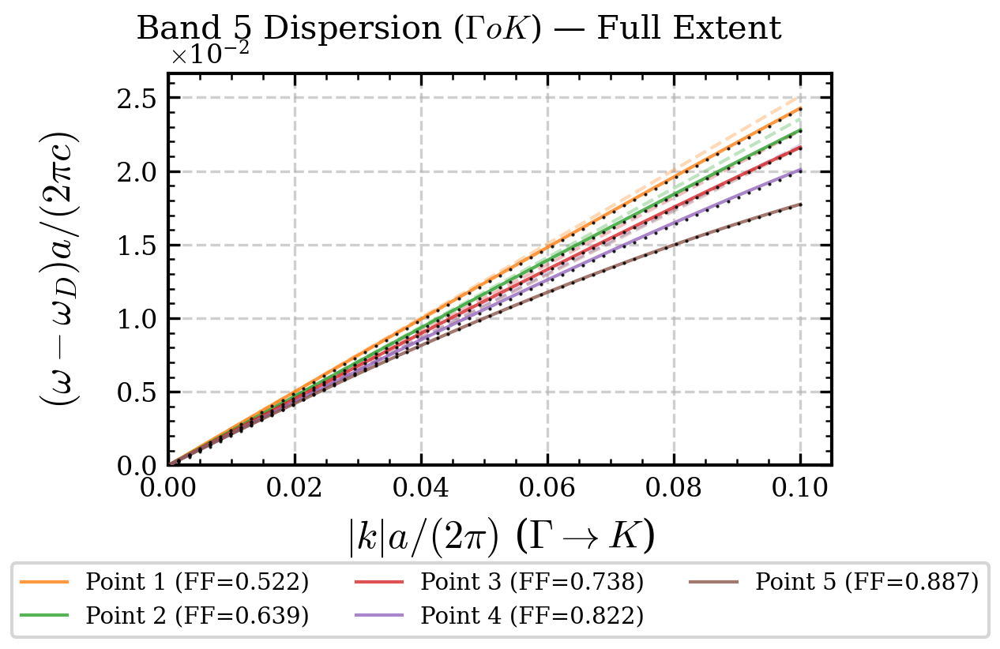

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
import os

# ===========================================================================
# 1. Helper Functions
# ===========================================================================

def clean_format_axis(ax, axis='y', scilimits=(-2, -2)):
    """Handles scientific notation for cleaner axis labels."""
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits(scilimits)
    if axis == 'y':
        ax.yaxis.set_major_formatter(formatter)
    else:
        ax.xaxis.set_major_formatter(formatter)

def extract_band_data_at_GK(sim, band_num='band_5', tol=1e-4):
    """
    Extracts k-points and frequencies specifically along the Gamma -> K path.
    K is located at 30 degrees in the first BZ: |ky| = |kx| / sqrt(3).
    """
    k_vecs = np.array(sim['k_vecs'])
    
    # Identify points along the 30-degree high-symmetry line
    gk_mask = np.isclose(np.abs(k_vecs[:, 1]), np.abs(k_vecs[:, 0]) / np.sqrt(3), atol=tol)
    
    # Fallback if the lattice orientation is rotated 90 degrees
    if np.sum(gk_mask) < 2:
        gk_mask = np.isclose(np.abs(k_vecs[:, 0]), np.abs(k_vecs[:, 1]) / np.sqrt(3), atol=tol)

    # Calculate Euclidean distance |k| from Gamma
    k_dist = np.sqrt(k_vecs[gk_mask, 0]**2 + k_vecs[gk_mask, 1]**2)
    freq = np.array(sim['bands'][band_num])[gk_mask]
    
    sort_idx = np.argsort(k_dist)
    return k_dist[sort_idx], freq[sort_idx]

def plot_band_data(ax, sim, band_num='band_5', color='blue', marker='.', 
                    label='', ms=1, subtract_dirac=False):
    """Plots the raw band data points."""
    k_vals, freq = extract_band_data_at_GK(sim, band_num)
    if len(k_vals) == 0: return k_vals, freq
    
    # Shift frequency so that Gamma (k=0) is at 0
    f_shift = freq[np.argmin(k_vals)] if subtract_dirac else 0
    
    ax.scatter(k_vals, freq - f_shift, color=color, marker=marker, label=label, 
                s=ms**2, zorder=10, alpha=0.85, edgecolors='black', linewidth=0.5)
    return k_vals, freq

def plot_polynomial_fit(ax, sim, k_range=None, color='blue', label='Cubic fit', 
                        lw=1, subtract_dirac=False):
    """Plots the cubic polynomial fit for Band 5."""
    poly = np.poly1d(sim['band5_poly_coeffs_K'])
    k_vals, _ = extract_band_data_at_GK(sim, 'band_5')
    
    if k_range is None:
        k_range = (k_vals.min(), k_vals.max())
    
    k_fit = np.linspace(k_range[0], k_range[1], 100)
    f_shift = poly(0) if subtract_dirac else 0
    
    ax.plot(k_fit, poly(k_fit) - f_shift, '-', label=label, lw=lw, color=color, 
            zorder=5, alpha=0.8)

def plot_linear_approximation(ax, sim, k_range=None, color='blue', 
                              lw=1, linestyle='--', alpha=0.6):
    """Plots the linear tangent (group velocity) at the Gamma point."""
    poly = np.poly1d(sim['band5_poly_coeffs_K'])
    k_vals, _ = extract_band_data_at_GK(sim, 'band_5')
    
    if k_range is None:
        k_range = (k_vals.min(), k_vals.max())
    
    k_fit = np.linspace(k_range[0], k_range[1], 100)
    first_deriv = poly.deriv()(0) 
    
    ax.plot(k_fit, first_deriv * k_fit, linestyle, lw=lw, alpha=alpha, color=color, zorder=3)

# ===========================================================================
# 2. Main Plotting Execution
# ===========================================================================

fig, ax = plt.subplots(figsize=ROW1_COL1_SIZE)
point_labels = [f"Point {i+1}" for i in range(5)]

# Variables for dynamic scaling to "Full Extent"
all_k_max = 0
all_f_max = 0

for idx, (sim, color, label) in enumerate(zip(selected_points, highlight_colors, point_labels)):
    # 1. Raw Data
    k_vals, freq = plot_band_data(ax, sim, band_num='band_5', color=color, 
                                   marker='.', ms=1, subtract_dirac=True)
    
    # 2. Cubic Fit
    plot_polynomial_fit(ax, sim, color=color, subtract_dirac=True,
                        label=f'{label} (FF={sim["ff"]:.3f})')
    
    # 3. Linear Tangent
    plot_linear_approximation(ax, sim, color=color, alpha=0.3)
    
    # Track max values for axis limits
    if len(k_vals) > 0:
        all_k_max = max(all_k_max, k_vals.max())
        f_shifted_max = (freq - freq[np.argmin(k_vals)]).max()
        all_f_max = max(all_f_max, f_shifted_max)

# --- Set Dynamic "Full Extent" Limits ---
ax.set_xlim(0, all_k_max * 1.05) 
ax.set_ylim(0, all_f_max * 1.1)

# --- Formatting ---
ax.set_xlabel(r'$|k| a/(2\pi)$ ($\Gamma \to K$)', fontsize=12)
ax.set_ylabel(r'$(\omega - \omega_D) a/(2\pi c)$', fontsize=12, labelpad=10)
ax.grid(True, linestyle='--', alpha=0.6)
clean_format_axis(ax, axis='y')

# --- Legend and Title ---
# Legend centered at the bottom, 3 columns
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.22), 
          ncol=3, fontsize=7, frameon=True)

fig.suptitle("Band 5 Dispersion ($\Gamma \to K$) — Full Extent", y=0.98, fontsize=10)

# Adjusting subplots to leave room for the bottom legend
plt.subplots_adjust(left=0.15, right=0.95, top=0.88, bottom=0.25)

# Save and Show
if 'figure_path' in globals():
    plt.savefig(os.path.join(figure_path, "band5_dispersion_full_extent.png"))
plt.show()

#### Refractive Index

#### Perturbation FOM

In [ ]:
skip = 1

In [ ]:
def extract_hex_data(sim, band_num, direction='K', tol=1e-4):
    """Generic radial k-extractor for Hexagonal M (0°) or K (30°) paths."""
    k_vecs = np.array(sim['k_vecs'])
    k1, k2 = k_vecs[:, 0], k_vecs[:, 1]
    
    if direction == 'M':
        # M-direction: ky = 0
        mask = np.isclose(k2, 0, atol=tol)
        if np.sum(mask) < 2: mask = np.isclose(k1, 0, atol=tol)
    else:
        # K-direction: |ky| = |kx| / sqrt(3)
        mask = np.isclose(np.abs(k2), np.abs(k1) / np.sqrt(3), atol=tol)
        if np.sum(mask) < 2: mask = np.isclose(np.abs(k1), np.abs(k2) / np.sqrt(3), atol=tol)

    k_dist = np.sqrt(k1[mask]**2 + k2[mask]**2)
    freq = np.array(sim['bands'][band_num])[mask]
    sort_idx = np.argsort(k_dist)
    return k_dist[sort_idx], freq[sort_idx]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from joblib import Parallel, delayed

# ===========================================================================
# 0. MATRIX FUNCTIONS (Unchanged)
# ===========================================================================
def calculate_momentum_matrix_vec(Hzs, eps, a):
    H = np.array(Hzs)
    inv_eps = 1.0 / eps
    res_y, res_x = H.shape[1], H.shape[2]
    
    for i in range(H.shape[0]):
        norm_factor = np.sqrt(np.mean(np.abs(H[i])**2)) 
        H[i] /= norm_factor

    du2, du1 = 1.0 / res_y, 1.0 / res_x
    grad_u2, grad_u1 = np.gradient(H, du2, du1, axis=(1, 2))
    
    grad_x = grad_u1
    grad_y = (2.0 / np.sqrt(3)) * grad_u2 - (1.0 / np.sqrt(3)) * grad_u1
    grad_cart = np.array([grad_y, grad_x])
    
    p_matrix = np.zeros((H.shape[0], H.shape[0], 2), dtype=complex)
    for dim in [0, 1]:
        term1 = np.einsum('lyx, yx, jyx -> lj', np.conj(H), inv_eps, grad_cart[dim]) / (res_y * res_x)
        term2 = np.einsum('jyx, yx, lyx -> lj', H, inv_eps, np.conj(grad_cart[dim])) / (res_y * res_x)
        p_matrix[:, :, 1 - dim] = (1j / a**2) * (term1 - term2)
        
    return p_matrix

def calculate_quadratic_matrix_vec(Hzs, eps):
    H = np.array(Hzs)
    inv_eps = 1.0 / eps
    res_y, res_x = H.shape[1], H.shape[2]
    
    for i in range(H.shape[0]):
        norm_factor = np.sqrt(np.mean(np.abs(H[i])**2))
        H[i] /= norm_factor
        
    q_matrix = np.einsum('iyx, yx, jyx -> ij', np.conj(H), inv_eps, H) / (res_y * res_x)
    return q_matrix

# ===========================================================================
# 1. SIMULATION FIT (Kept serial because polyfit is practically instant)
# ===========================================================================
for e in tqdm(valid_entries, desc="Fitting Simulation Data"):
    k_m, w_m = extract_hex_data(e, 'band_5', direction='M')
    if len(k_m) > 3:
        coeffs_m = np.polyfit(k_m, w_m, 3)
        e['group_velocity_band_5_M'] = coeffs_m[2] 
        e['band5_poly_coeffs_M'] = coeffs_m 
    
    k_k, w_k = extract_hex_data(e, 'band_5', direction='K')
    if len(k_k) > 3:
        coeffs_k = np.polyfit(k_k, w_k, 3)
        e['group_velocity_band_5_K'] = coeffs_k[2]
        e['band5_poly_coeffs_K'] = coeffs_k 

# ===========================================================================
# 2. PARALLEL PERTURBATION THEORY
# ===========================================================================
band_list_full = list(range(1, 10))
# The worker function that runs on each isolated CPU core
def process_single_sim(entry):
    sim = entry['sim']
    df_te = sim.load_frequency_data("te")
    omega_0s = np.array([df_te.loc[0, f"te band {b}"] for b in band_list_full]) 
    
    opt_math = MPBDataOptions(rectify=False, periods=1)
    eps = sim.load_and_convert_epsilon_data(options=opt_math)
    Hzs = [sim.load_and_convert_field_data(1, b, "z", "te", "h", conversion_options=opt_math) for b in band_list_full]

    a = 1.0 
    p_ij = calculate_momentum_matrix_vec(Hzs, eps, a)
    q_ij = calculate_quadratic_matrix_vec(Hzs, eps)
    
    # Dynamic Triplet Selection
    target_omega = omega_0s[band_list_full.index(5)]
    triplet_idx = np.argsort(np.abs(omega_0s - target_omega))[:3]
    triplet_idx = np.sort(triplet_idx)
    avg_w = np.mean(omega_0s[triplet_idx])
    
    # Calculate the "Cost" (The gap between the top and bottom of the triplet at Gamma)
    cost_gap = omega_0s[triplet_idx[-1]] - omega_0s[triplet_idx[0]]
    
    Px_sub = p_ij[np.ix_(triplet_idx, triplet_idx, [0])].squeeze()
    Py_sub = p_ij[np.ix_(triplet_idx, triplet_idx, [1])].squeeze()

    vg_eigs_M = np.real(np.linalg.eigvals(Px_sub)) / (4 * np.pi * avg_w)
    vg_M = np.max(np.abs(vg_eigs_M))

    cos30, sin30 = np.sqrt(3)/2, 0.5
    Pk_sub = Px_sub * cos30 + Py_sub * sin30
    vg_eigs_K = np.real(np.linalg.eigvals(Pk_sub)) / (4 * np.pi * avg_w)
    vg_K = np.max(np.abs(vg_eigs_K))

    k0_phys = 0.05 * (2 * np.pi) 
    omega_dirac = omega_0s[triplet_idx[1]]
    mask = ~np.eye(3, dtype=bool)
    off_diag_coupling = np.sqrt(np.sum(np.abs(Px_sub[mask])**2 + np.abs(Py_sub[mask])**2))
    
    Q_intrinsic = np.mean(np.abs(q_ij[np.ix_(triplet_idx, triplet_idx)]))
    P_lin_total = np.sqrt(np.mean(np.abs(Px_sub)**2 + np.abs(Py_sub)**2))
    
    # Return results as a dictionary
    return {
        "cost_gap": cost_gap,
        "group_velocity_b5_M_pt": vg_M,
        "group_velocity_b5_K_pt": vg_K,
        "FOM_COUPLING_STRENGTH": off_diag_coupling / (omega_dirac + 1e-12),
        "FOM_NONLINEARITY_RATIO": (k0_phys * Q_intrinsic) / (P_lin_total + 1e-12)
    }

# Execute parallel loop (n_jobs=-1 uses all available cores)
print(f"Starting parallel execution on {len(sims_cf_lin[::skip])} items...")
results = Parallel(n_jobs=-1)(
    delayed(process_single_sim)(entry) for entry in tqdm(sims_cf_lin[::skip], desc="P.T. Analysis")
)

# Merge parallel results back into the main list
for entry, res in zip(sims_cf_lin[::skip], results):
    entry.update(res)


Fitting Simulation Data:   0%|          | 0/25 [00:00<?, ?it/s]

Starting parallel execution on 25 items...


P.T. Analysis:   0%|          | 0/25 [00:00<?, ?it/s]

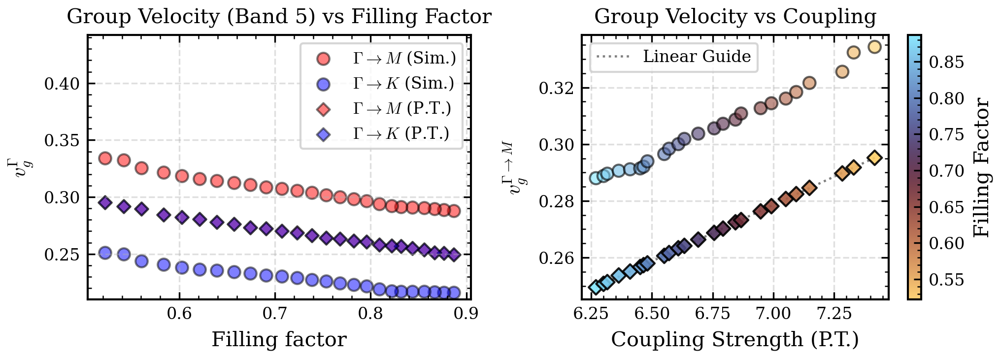

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ===========================================================================
# 3. PLOTTING: Comparison (Linear Scale)
# ===========================================================================
plt.figure(figsize=ROW1_COL2_SIZE)

ff_a = np.array([e["entry"]["ff"] for e in sims_cf_lin[::skip]])
vg_M_pt = np.array([e["group_velocity_b5_M_pt"] for e in sims_cf_lin[::skip]])
vg_K_pt = np.array([e["group_velocity_b5_K_pt"] for e in sims_cf_lin[::skip]]) 
fom_coupling = np.array([e["FOM_COUPLING_STRENGTH"] for e in sims_cf_lin[::skip]])

vg_M_sim = np.array([e['group_velocity_band_5_M'] for e in valid_entries[::skip]])
vg_K_sim = np.array([e['group_velocity_band_5_K'] for e in valid_entries[::skip]])

# --- Left Plot: Velocity vs FF ---
plt.subplot(1, 2, 1)
plt.grid(True, alpha=0.4, linestyle='--')

# Simulation (Circles)
plt.scatter(ff_a, vg_M_sim, c='red', marker='o', edgecolors='k', s=35, label=r'$\Gamma \to M$ (Sim.)', alpha=0.5)
plt.scatter(ff_a, vg_K_sim, c='blue', marker='o', edgecolors='k', s=35, label=r'$\Gamma \to K$ (Sim.)', alpha=0.5)

# P.T. (Diamonds)
plt.scatter(ff_a, vg_M_pt, c='red', marker='D', edgecolors='k', s=20, label=r'$\Gamma \to M$ (P.T.)', alpha=0.5)
plt.scatter(ff_a, vg_K_pt, c='blue', marker='D', edgecolors='k', s=20, label=r'$\Gamma \to K$ (P.T.)', alpha=0.5)

plt.xlabel("Filling factor")
plt.ylabel(r"$v_g^\Gamma$")
plt.title("Group Velocity (Band 5) vs Filling Factor")
plt.legend(fontsize=8, frameon=True, loc='upper right')
plt.ylim(plt.ylim()[0], plt.ylim()[1]*1.3)  # Give legend some breathing room

# --- Right Plot: Velocity vs Coupling (LINEAR) ---
ax2 = plt.subplot(1, 2, 2)
plt.grid(True, alpha=0.4, linestyle='--')

# Filter out potential zeros
valid_mask = (fom_coupling > 0) & (vg_M_pt > 0) & (vg_M_sim > 0)
x_data = fom_coupling[valid_mask]
y_pt_data = vg_M_pt[valid_mask]
y_sim_data = vg_M_sim[valid_mask]
ff_valid = ff_a[valid_mask]

# Sort by FF for plotting the color map cleanly (smaller markers on top)
sorted_idx = np.argsort(ff_valid)[::-1]
x_sorted = x_data[sorted_idx]
y_pt_sorted = y_pt_data[sorted_idx]
y_sim_sorted = y_sim_data[sorted_idx]
ff_sorted = ff_valid[sorted_idx]

# Plot Simulation Data (Circles)
sc_sim = plt.scatter(x_sorted, y_sim_sorted, 
                     c=ff_sorted, cmap='managua', marker='o', edgecolors='k', s=35, alpha=0.6, zorder=4, label=None)

# Plot P.T. Data (Diamonds)
sc_pt = plt.scatter(x_sorted, y_pt_sorted, 
                    c=ff_sorted, cmap='managua', marker='D', edgecolors='k', s=25, alpha=0.9, zorder=5, label=None)

# --- Calculate the exact Power-Law fit ---
log_x = np.log10(x_sorted)
log_y = np.log10(y_pt_sorted)
fit_coeffs = np.polyfit(log_x, log_y, 1)
slope = fit_coeffs[0]
intercept = fit_coeffs[1]

# Plot Reference Guide (Strictly Linear y = m*x)
anchor_x, anchor_y = x_sorted[-1], y_pt_sorted[-1]
plt.plot(x_fit, anchor_y * (x_fit / anchor_x), color='gray', linestyle=':', zorder=1, label='Linear Guide')

plt.xlabel("Coupling Strength (P.T.)")
plt.ylabel(r"$v_g^{\Gamma \to M}$")
plt.title("Group Velocity vs Coupling")

# Create a combined legend for the Right plot
plt.legend(fontsize=8, frameon=True, loc='best')

# Add Colorbar mapped to the scatter plots
plt.colorbar(sc_pt, ax=ax2, label='Filling Factor')

plt.tight_layout()
plt.show()

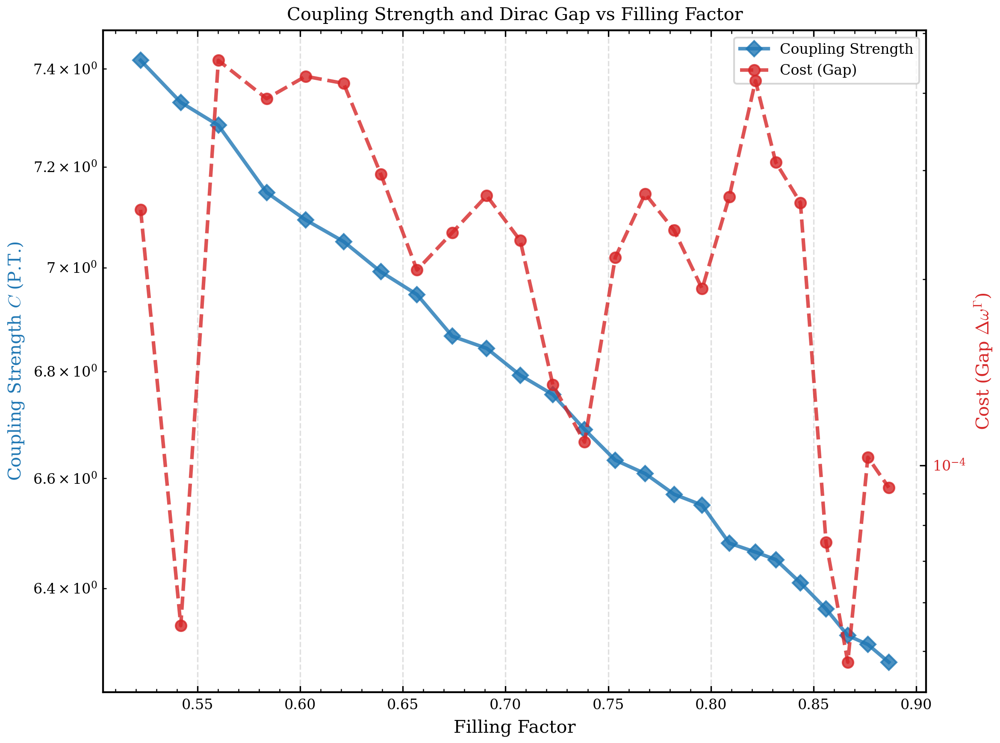

In [ ]:
# ===========================================================================
# 3. PLOTTING: Coupling and Cost vs Filling Factor (Twin Axes)
# ===========================================================================
ff_a = np.array([e["entry"]["ff"] for e in sims_cf_lin[::skip]])
cost_gap = np.array([e["cost_gap"] for e in sims_cf_lin[::skip]])
fom_coupling = np.array([e["FOM_COUPLING_STRENGTH"] for e in sims_cf_lin[::skip]])

# Filtering for log plots (remove exact zeros or negatives)
valid_mask = (fom_coupling > 0) & (cost_gap > 0)
x_ff = ff_a[valid_mask]
y_fom = fom_coupling[valid_mask]
y_cost = cost_gap[valid_mask]

# Sort by Filling Factor for clean line plotting
sorted_idx = np.argsort(x_ff)
ff_sorted = x_ff[sorted_idx]
fom_sorted = y_fom[sorted_idx]
cost_sorted = y_cost[sorted_idx]

# Create Figure and first Axis
fig, ax1 = plt.subplots(figsize=(8, 6)) # Adjust figsize if you have a specific macro like ROW1_COL1_SIZE

# --- Axis 1: Coupling Strength (Left Y, Blue) ---
color1 = 'tab:blue'
ax1.set_xlabel("Filling Factor")
ax1.set_ylabel("Coupling Strength $C$ (P.T.)", color=color1)
line1 = ax1.plot(ff_sorted, fom_sorted, color=color1, marker='D', linestyle='-', 
                 linewidth=2, markersize=6, alpha=0.8, label="Coupling Strength")
ax1.tick_params(axis='y', labelcolor=color1)
ax1.set_yscale('log')
ax1.grid(True, alpha=0.4, linestyle='--')

# --- Axis 2: Cost / Gap (Right Y, Red) ---
ax2 = ax1.twinx()  
color2 = 'tab:red'
ax2.set_ylabel(r"Cost (Gap $\Delta\omega^\Gamma$)", color=color2)
line2 = ax2.plot(ff_sorted, cost_sorted, color=color2, marker='o', linestyle='--', 
                 linewidth=2, markersize=6, alpha=0.8, label="Cost (Gap)")
ax2.tick_params(axis='y', labelcolor=color2)
ax2.set_yscale('log')

# Combine legends from both axes
lines = line1 + line2
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='best', frameon=True)

plt.title("Coupling Strength and Dirac Gap vs Filling Factor")
plt.tight_layout()
plt.show()

--- Generating Figures for Direction: Gamma -> M ---


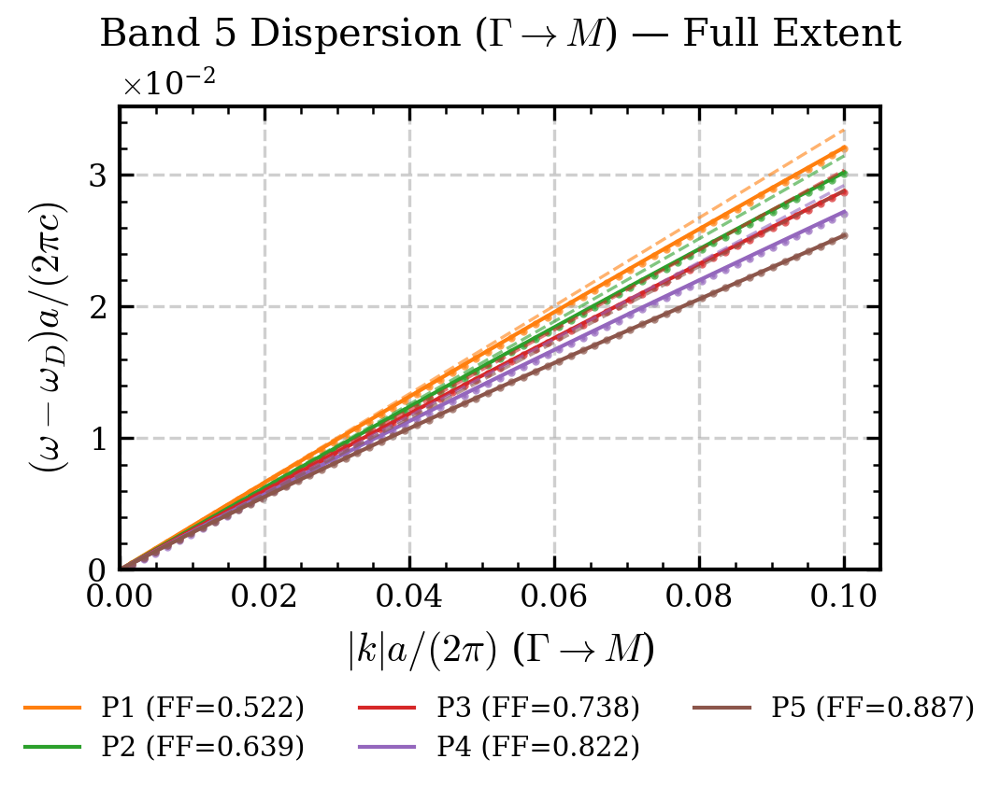

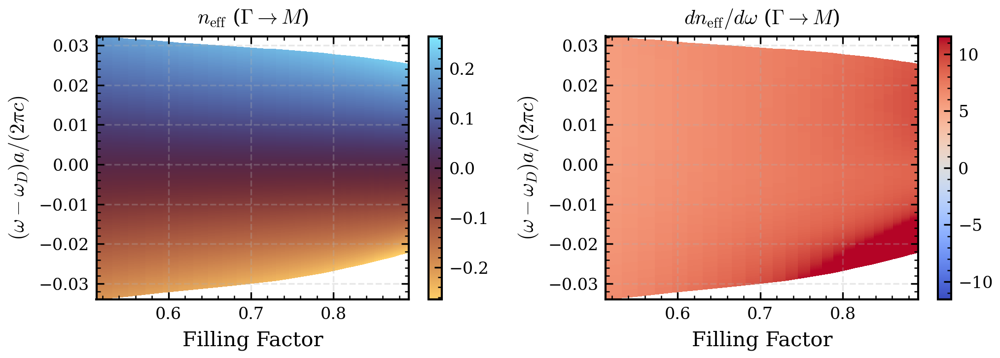

--- Generating Figures for Direction: Gamma -> K ---


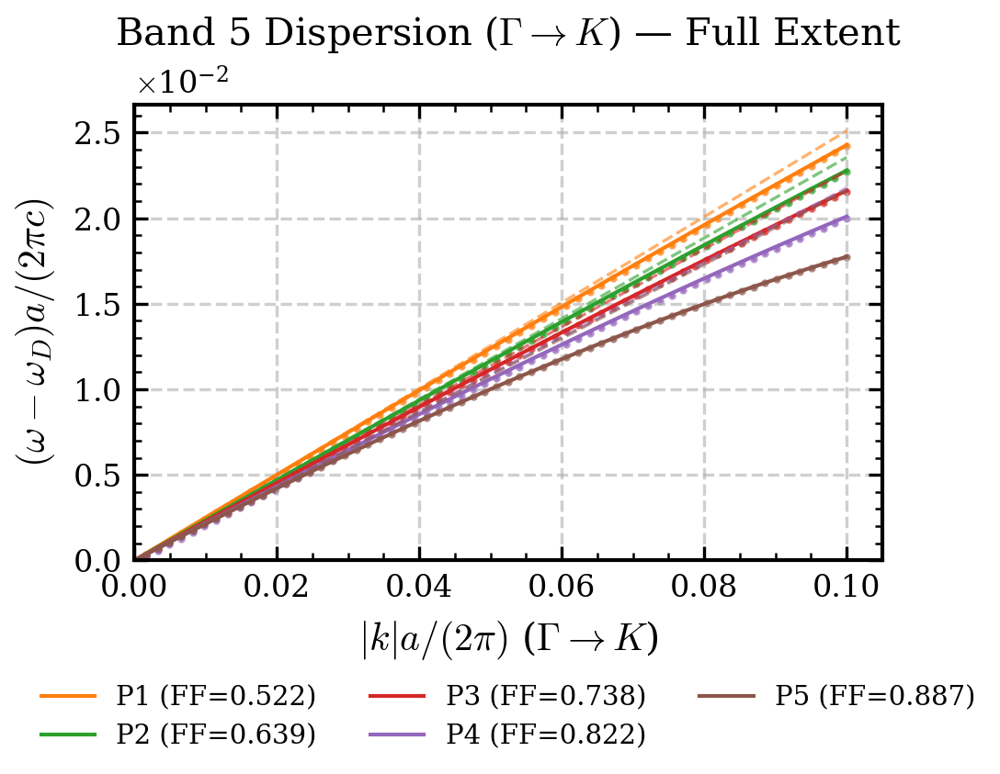

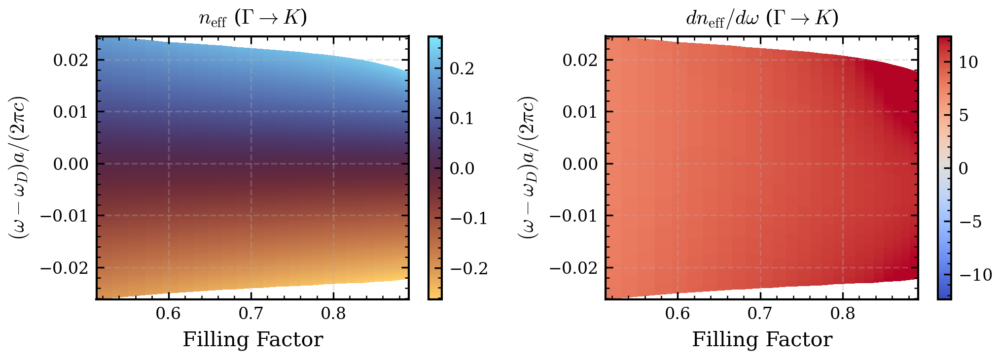

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
from scipy.interpolate import pchip_interpolate, UnivariateSpline
import os

# ===========================================================================
# 1. CORE DATA EXTRACTION HELPERS
# ===========================================================================



def clean_format_axis(ax, axis='y', scilimits=(-2, -2)):
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_powerlimits(scilimits)
    if axis == 'y': ax.yaxis.set_major_formatter(formatter)
    else: ax.xaxis.set_major_formatter(formatter)

# ===========================================================================
# 2. MASTER PLOTTING LOOP
# ===========================================================================

directions = ['M', 'K']
highlight_colors = ['#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

for direct in directions:
    print(f"--- Generating Figures for Direction: Gamma -> {direct} ---")
    
    # Sort and sample 5 points for the dispersion plot
    valid_entries_sorted = sorted(valid_entries, key=lambda e: e["ff"])
    indices = np.linspace(0, len(valid_entries_sorted) - 1, 5).astype(int)
    selected_points = [valid_entries_sorted[idx] for idx in indices]
    
    # --- FIGURE 1: DISPERSION (BAND 5) ---
    fig1, ax1 = plt.subplots(figsize=ROW1_COL1_SIZE)
    all_k_max, all_f_max = 0, 0

    for idx, (sim, color) in enumerate(zip(selected_points, highlight_colors)):
        k_vals, freq = extract_hex_data(sim, 'band_5', direction=direct)
        f_shift = freq[np.argmin(k_vals)]
        
        # Use pre-calculated polynomial coefficients
        coeff_key = f'band5_poly_coeffs_{direct}'
        poly = np.poly1d(sim[coeff_key])
        k_fit = np.linspace(0, k_vals.max(), 100)
        
        # FIX: Changed 'ms' to 's' for scatter
        ax1.scatter(k_vals, freq - f_shift, color=color, marker='.', s=4, alpha=0.7)
        ax1.plot(k_fit, poly(k_fit) - poly(0), '-', color=color, lw=1, 
                 label=f'P{idx+1} (FF={sim["ff"]:.3f})')
        
        # Linear Tangent
        vg = poly.deriv()(0)
        ax1.plot(k_fit, vg * k_fit, '--', color=color, alpha=0.6, lw=0.8)

        all_k_max = max(all_k_max, k_vals.max())
        all_f_max = max(all_f_max, (freq - f_shift).max())

    ax1.set_xlim(0, all_k_max * 1.05)
    ax1.set_ylim(0, all_f_max * 1.1)
    ax1.set_xlabel(rf'$|k| a/(2\pi)$ ($\Gamma \to {direct}$)')
    ax1.set_ylabel(r'$(\omega - \omega_D) a/(2\pi c)$')
    ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.22), ncol=3, fontsize=7)
    ax1.set_title(rf"Band 5 Dispersion ($\Gamma \to {direct}$) — Full Extent")
    ax1.grid(True, linestyle='--', alpha=0.6)
    clean_format_axis(ax1)
    plt.subplots_adjust(bottom=0.25)
    plt.show()

    # --- FIGURE 2: HEATMAPS (BANDS 3 & 5) ---
    n_list, w_list, dg_list = [], [], []
    n_target = 1000

    for e in valid_entries_sorted:
        k5, w5 = extract_hex_data(e, 'band_5', direction=direct)
        k3, w3 = extract_hex_data(e, 'band_3', direction=direct)
        
        wD = 0.5 * (w5.min() + w3.max())
        m5, m3 = k5 > 1e-5, k3 > 1e-5 # Filter Gamma to avoid 1/0
        
        w_raw = np.concatenate([w3[m3], w5[m5]]) - wD
        n_raw = np.concatenate([-k3[m3]/w3[m3], k5[m5]/w5[m5]])
        
        order = np.argsort(w_raw)
        w_u, idx = np.unique(np.round(w_raw[order], 10), return_index=True)
        n_u = n_raw[order][idx]
        
        w_grid = np.linspace(w_u.min(), w_u.max(), n_target)
        n_interp = pchip_interpolate(w_u, n_u, w_grid)
        spl = UnivariateSpline(w_grid, n_interp, s=0.0001)
        
        n_list.append(spl(w_grid))
        w_list.append(w_grid)
        dg_list.append(spl.derivative()(w_grid))

    ff_sorted = np.array([e["ff"] for e in valid_entries_sorted])
    n_mat = np.array(n_list).T
    w_mat = np.array(w_list).T
    dg_mat = np.array(dg_list).T
    FF_grid, _ = np.meshgrid(ff_sorted, np.arange(n_target))

    fig2, (hm1, hm2) = plt.subplots(1, 2, figsize=ROW1_COL2_SIZE)
    
    # Effective Index Heatmap
    vlim_n = np.nanmax(np.abs(n_mat))
    pcm1 = hm1.pcolormesh(FF_grid, w_mat, n_mat, cmap='managua', vmin=-vlim_n, vmax=vlim_n, shading='auto')
    hm1.set_title(rf'$n_{{\mathrm{{eff}}}}$ ($\Gamma \to {direct}$)')
    fig2.colorbar(pcm1, ax=hm1)

    # Gradient Heatmap
    vlim_g = np.nanpercentile(np.abs(dg_mat), 95)
    pcm2 = hm2.pcolormesh(FF_grid, w_mat, dg_mat, cmap='coolwarm', vmin=-vlim_g, vmax=vlim_g, shading='auto')
    hm2.set_title(rf'$dn_{{\mathrm{{eff}}}}/d\omega$ ($\Gamma \to {direct}$)')
    fig2.colorbar(pcm2, ax=hm2)

    for ax in [hm1, hm2]:
        ax.set_xlabel('Filling Factor')
        ax.set_ylabel(r'$(\omega-\omega_D)a/(2\pi c)$')
        ax.grid(True, alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.show()

## Slab



### Unoptimized

In [97]:
SIMULATE = False
r1 = r1_below_threshold
r2 = r2_below_threshold
hh = 0.4

In [ ]:
# Run or load the unoptimized 2D simulation to get the data for plotting
lsf_config = LSFJobConfiguration(num_processors=32, span_option="hosts", span_value=1, queue="fotonano",   mem = "1GB")
data_line = rf"$r_1={r1:0.3f}a$, $r_2={r2:0.3f}a$, $h={hh:0.3f}a$, $\varepsilon={eps_inp}$"
fig_folder = os.path.join(figure_path, name_slab + "_unoptimized")
os.makedirs(fig_folder, exist_ok=True)

# make a new simulation just for this purpose, to avoid overwriting the original one with the new parameters
simulation_3D_unoptimized = Simulation(
    simulation_name=name_slab + "_unoptimized",
    script = script_slab,
    directory= os.path.join(data_rooth, name_slab + "_unoptimized")
    )
if SIMULATE is True:
    print("3D simulation started")
    simulation_3D_unoptimized.run_hpc_lsf(mpb_command_line_params=dict(r1 = r1, r2 = r2, h=hh), LSFOptions=lsf_config)
    print("Done.")
print("Collecting results forom ", simulation_3D_unoptimized.directory)
viewer_3D = SimulationViewer(simulation_3D_unoptimized) 
opt = MPBDataOptions(rectify=True, periods= 1)

3D simulation started


2026-04-14 16:41:25,046 - INFO - Job submitted with ID: 28208326


In [ ]:
# Plot the band diagram and the unit cell
df_zeven = simulation_3D_unoptimized.load_frequency_data("zeven")
df_target_idx = df_zeven.loc[(df_zeven["k2"] == 0) & (df_zeven["k1"] ==0), "k1"].idxmin()
k_idx_for_field_plot = df_zeven.loc[df_target_idx, "k index"]


# Create a figure with a custom grid layout
fig = plt.figure(figsize=(WIDTH_1*1.3, HEIGHT_1), constrained_layout=True)
gs = gridspec.GridSpec(2, 3, figure=fig)

# -- 1. LEFT PANEL: Band Diagram --
ax_band = fig.add_subplot(gs[:, 0:2])
plt.sca(ax_band) # Set current axis for the viewer
plot_options = dict(linestyle='', marker='.', markersize=1)

# Assuming viewer_3D uses the currently active axis (plt.gca())
#viewer_3D.plot_band_diagram("tm", k_points_path=k_points, color="blue", plot_options=plot_options)
viewer_3D.plot_band_diagram("zeven", k_points_path=k_points, color="red", plot_options=plot_options, custom_label = "TE-like bands")
viewer_3D.plot_light_cone(df_zeven)
plt.legend(frameon=True)
ax_band.set_ylabel(r"$\omega a/2\pi c$")
ax_band.set_title("Band diagram - 3D Unoptimized Slab\n" + data_line)
# ax_band.vlines(k_idx_for_field_plot, ymin, ymax, colors="gray", linestyles="--", label=None)


# -- 2. TOP RIGHT PANEL: Square Lattice (3 periods, no ticks, no colorbar) --
ax_lat = fig.add_subplot(gs[0, 2])
opt_3x3 = MPBDataOptions(rectify=True, periods=3)
eps_3x3 = simulation_3D_unoptimized.load_and_convert_epsilon_data(options=opt_3x3)
# Make esp_3x3 a 2D array by taking a slice at the middle of the z-axis
eps_3x3 = eps_3x3[:, :, eps_3x3.shape[2] // 2]

# Plotting the dielectric distribution directly to avoid automatic colorbars/ticks
ax_lat.imshow(eps_3x3, cmap="managua_r", origin="lower") 
ax_lat.set_xticks([])
ax_lat.set_yticks([])
ax_lat.set_xlabel(r"$x_1$")
ax_lat.set_ylabel(r"$x_2$", rotation=0, labelpad=15)
ax_lat.set_title("Square lattice")

# -- 3. BOTTOM RIGHT PANEL: Brillouin Zone --
ax_bz = fig.add_subplot(gs[1, 2])

# Draw the boundary of the Brillouin zone (square for square lattice)
bz_square = patches.Rectangle((-1, -1), 2, 2, fill=False, edgecolor='black')
ax_bz.add_patch(bz_square)

# Draw the Irreducible Brillouin Zone (IBZ) triangle
ibz_triangle = patches.Polygon([[0, 0], [1, 0], [1, 1]], closed=True, fill=True, facecolor='cyan', edgecolor='black')
ax_bz.add_patch(ibz_triangle)

# Add crosshair lines through the origin
ax_bz.axhline(0, color='black', linewidth=0.8)
ax_bz.axvline(0, color='black', linewidth=0.8)

# Add High-Symmetry point labels
ax_bz.text(-0.5, -0.5, r'$\Gamma$')
ax_bz.text(1.4, -0.05, 'X')
ax_bz.text(1.4, 0.95, 'M')

# Format axes
ax_bz.set_xlim(-1.2, 1.2)
ax_bz.set_ylim(-1.2, 1.2)
ax_bz.set_aspect('equal')

# Set specific ticks corresponding to pi/a
# Format axes
ax_bz.set_xlim(-1.2, 1.2)
ax_bz.set_ylim(-1.2, 1.2)
ax_bz.set_aspect('equal')

# 1. Turn off the default subplot bounding box (spines)
for spine in ax_bz.spines.values():
    spine.set_visible(False)

# 2. Turn off all tick marks (both major and minor) to remove the clutter
ax_bz.tick_params(which='both', bottom=False, top=False, left=False, right=False)

# 3. Set specific tick labels corresponding to pi/a (they will now float nicely without ticks)
ax_bz.set_xticks([-1, 0, 1])
ax_bz.set_xticklabels([r'$-\pi/a$', '0', r'$\pi/a$'])
ax_bz.set_yticks([-1, 0, 1])
ax_bz.set_yticklabels([r'$-\pi/a$', '0', r'$\pi/a$'])

ax_bz.set_xlabel(r"$k_x$")
ax_bz.set_ylabel(r"$k_y$", rotation=0)
ax_bz.set_title("Brillouin zone")

# Save and show
plt.savefig(os.path.join(fig_folder, "combined_band_diagram_bz"+simulation_3D_unoptimized.simulation_name))
plt.show()

EmptyDataError: No columns to parse from file

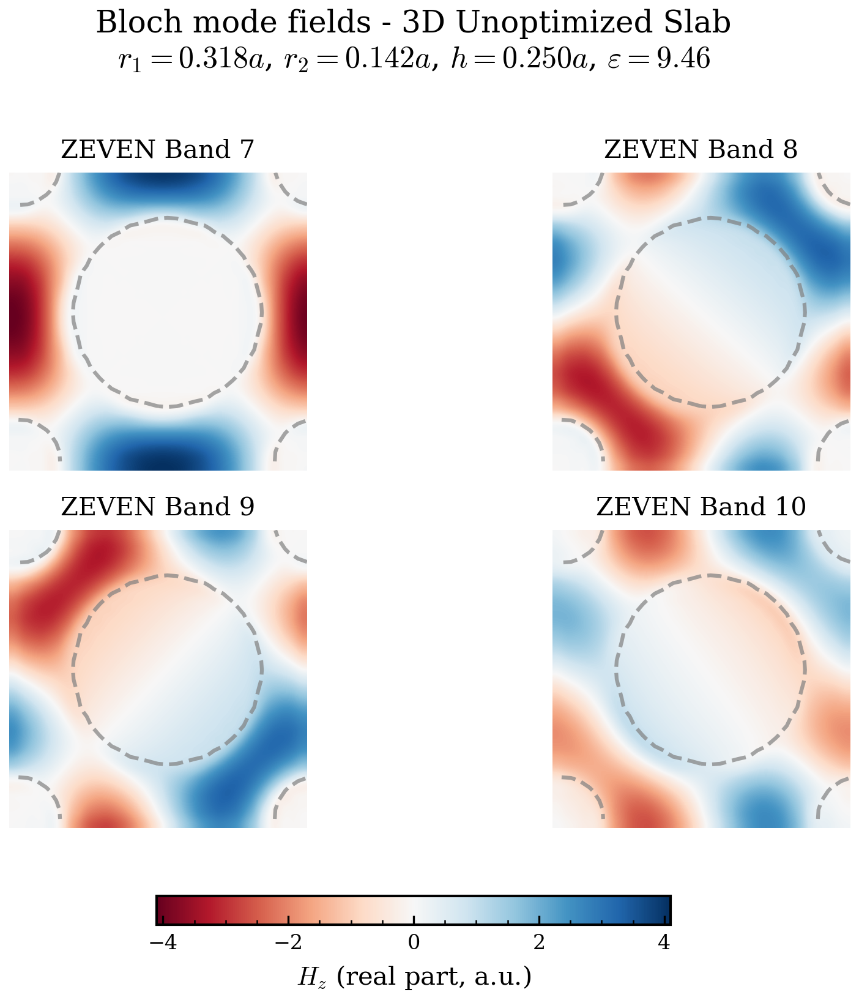

In [7]:
# Plot the eigen fields
# Plot ZEVEN bands 7, 8, 9, 10 at the selected k-point, which should correspond to the Dirac point
fig, axes = plt.subplots(2, 2, figsize=ROW2_COL2_SIZE, constrained_layout=False)
band_indices = [7, 8, 9, 10]
axes_flat = axes.flatten()

# Load epsilon once
eps_data = simulation_3D_unoptimized.load_and_convert_epsilon_data(options=opt)
eps_data = eps_data[:, :, eps_data.shape[2] // 2]

# Load all field slices first (for common normalization)
field_slices = []
for b_idx in band_indices:
    field_z = simulation_3D_unoptimized.load_and_convert_field_data(
        k_idx_for_field_plot, b_idx, "z", "zeven", "h", conversion_options=opt
    )
    field_slices.append(np.real(field_z[:, :, field_z.shape[2] // 2]))

# Common symmetric normalization across all panels
all_vals = np.concatenate([f.ravel() for f in field_slices])
vlim = np.nanmax(np.abs(all_vals))
vmin, vmax = -vlim, vlim

# Plot
for ax, b_idx, f2d in zip(axes_flat, band_indices, field_slices):
    im = ax.imshow(
        f2d, cmap="RdBu", origin="lower", interpolation="spline36",
        vmin=vmin, vmax=vmax
    )
    ax.contour(
        eps_data, levels=[eps_data.max() * 0.5],
        colors='gray', linewidths=1.5, linestyles='--',
        alpha=0.7, origin='lower'
    )
    ax.set_title(f"ZEVEN Band {b_idx}")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')
    ax.axis('off')

# Colorbar placement
cbar_width = 0.4
cbar_height = 0.03
cbar_left = 0.5 - cbar_width / 2
cbar_bottom = 0.02
cbar_ax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label(r"$H_{z}$ (real part, a.u.)")

# Increase gap between suptitle and axes
fig.subplots_adjust(top=0.80, bottom=max(cbar_bottom + cbar_height + 0.02, 0.12))
fig.suptitle(
    r"Bloch mode fields - 3D Unoptimized Slab" + "\n" + data_line,
    y=0.97
)

plt.savefig(os.path.join(fig_folder, "modes"))
plt.show()

### Optimization

In [8]:
SIMULATE = False

In [9]:
import concurrent.futures
import time
import os

# Assume data_rooth, simulation_slab_opt, and SIMULATE are defined globally above this
h_array = [0.27, 0.3, 0.35, 0.4, 0.45, 0.5]
numproc = 16
initial_generations = 6

def run_optimization(h, simulate=True):
    opt_name = simulation_slab_opt.simulation_name + f"_h_{h:0.3f}"
    
    # Thread safety: Create a fresh LSF config strictly for this thread
    lsf_config_local = LSFJobConfiguration(
        num_processors=numproc, 
        span_option="hosts", 
        span_value=1, 
        queue="fotonano",   
        mem="4GB"
    )

    bo_options = {
        "dimensions": [(0.2, 0.35), (0.2, 0.35)],
        "acq_func": "LCB",
        "acq_func_kwargs": {"kappa": 5},
        "n_initial_points": numproc * initial_generations,
        "initial_point_generator": "lhs"
    }
    
    optimizer = MPIBayesianOptimizator(
        simulation_name=opt_name,
        scheme_script=simulation_slab_opt.script, 
        directory=os.path.join(data_rooth, opt_name),
        maxiter=initial_generations + 6,
        batch_size=numproc,
        param_names=["r1", "r2"],
        polarization="zeven",
        bands=[8,9,10],
        bo_options=bo_options,
        height_slab=h
    )
    
    if simulate is True:
        # Directory is already set by the constructor, just create it
        os.makedirs(optimizer.simulation.directory, exist_ok=True)
        optimizer.simulation.write_scheme_script()
        optimizer.erease_data_file()
        optimizer.submit_lsf_job(lsf_config_local, conda_env_name="mpb-nzi-env")

    return h, optimizer


results = []

print(f"Submitting {len(h_array)} optimizations to LSF...")

with concurrent.futures.ThreadPoolExecutor() as executor:
    future_to_h = {}
    for h in h_array:
        future = executor.submit(run_optimization, h, SIMULATE)
        future_to_h[future] = h
        time.sleep(1) # Stagger LSF submissions slightly
    
    # Process them as they complete
    for future in concurrent.futures.as_completed(future_to_h):
        h_submitted = future_to_h[future] 
        try:
            # FIX: Unpack the tuple returned by run_optimization!
            ret_h, opt = future.result() 
            results.append((ret_h, opt))
            print(f"Successfully processed optimization for h={ret_h}")
        except Exception as exc:
            print(f"Job for h={h_submitted} generated an exception: {exc}")

# 'results' is now a clean list of (h, optimizer) tuples
print("\nAll tasks completed.")

Submitting 6 optimizations to LSF...


Successfully processed optimization for h=0.3
Successfully processed optimization for h=0.5
Successfully processed optimization for h=0.45
Successfully processed optimization for h=0.4
Successfully processed optimization for h=0.27
Successfully processed optimization for h=0.35

All tasks completed.


Processing h=0.3 for plotting...
predicted_cost: min=6.372e-04, 1%=1.507e-03, med=4.610e-02, 99%=1.503e-01, max=1.553e-01
predicted_cost non-positive count: 0


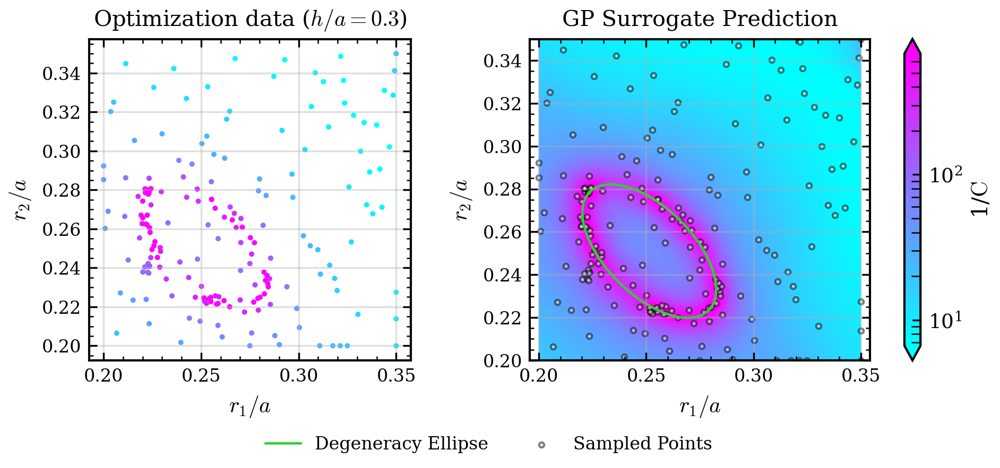

Processing h=0.5 for plotting...
predicted_cost: min=3.806e-04, 1%=1.323e-03, med=2.476e-02, 99%=9.408e-02, max=9.699e-02
predicted_cost non-positive count: 0


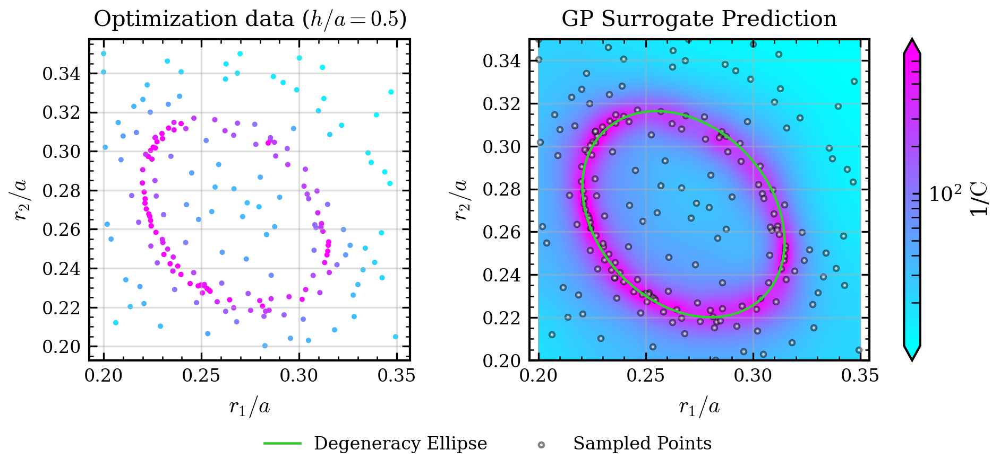

Processing h=0.45 for plotting...
predicted_cost: min=4.447e-04, 1%=1.362e-03, med=2.607e-02, 99%=1.164e-01, max=1.213e-01
predicted_cost non-positive count: 0


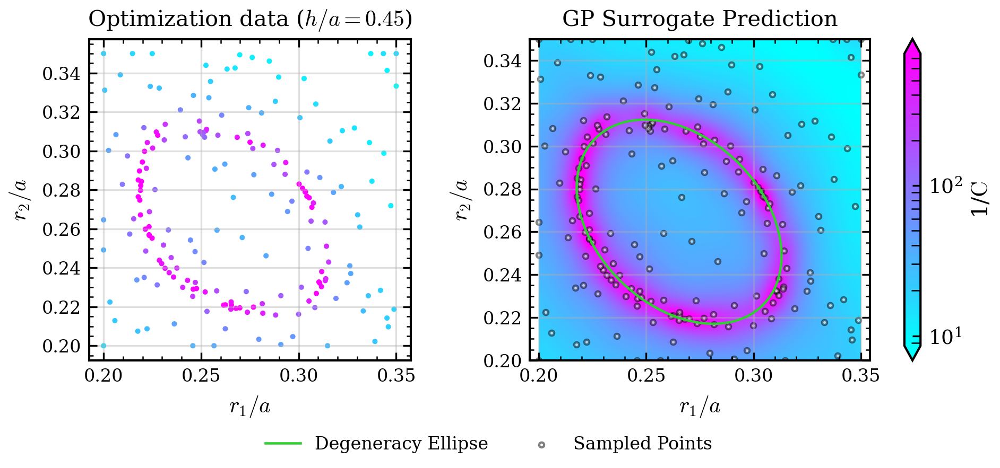

Processing h=0.4 for plotting...
predicted_cost: min=3.133e-04, 1%=1.344e-03, med=2.767e-02, 99%=1.207e-01, max=1.235e-01
predicted_cost non-positive count: 0


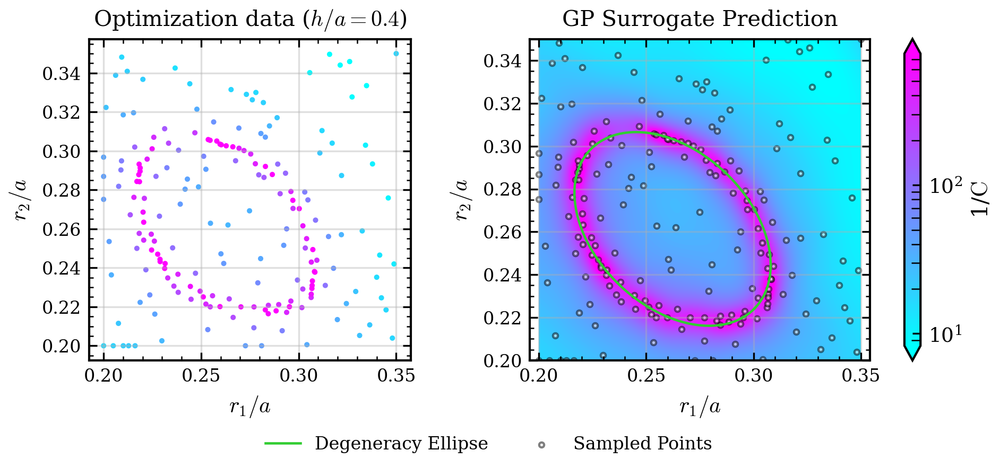

Processing h=0.27 for plotting...
predicted_cost: min=1.880e-04, 1%=9.770e-04, med=6.287e-02, 99%=1.564e-01, max=1.590e-01
predicted_cost non-positive count: 0


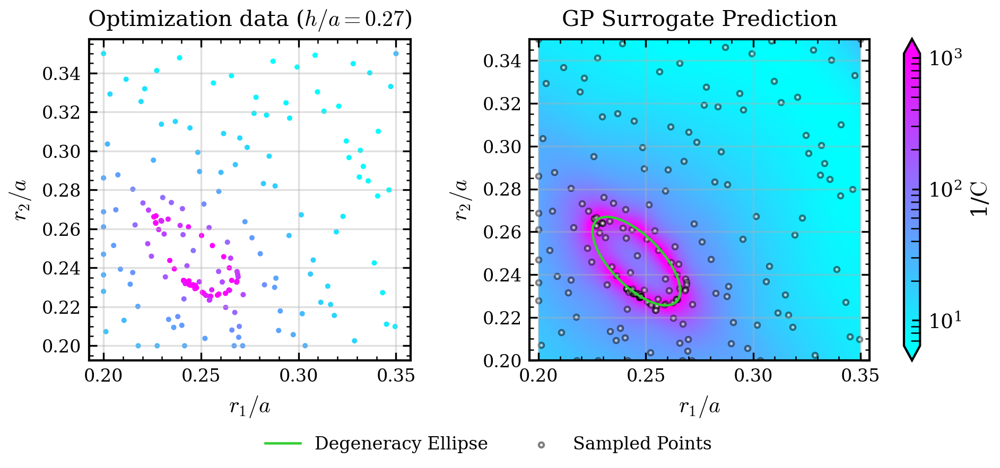

Processing h=0.35 for plotting...
predicted_cost: min=6.375e-04, 1%=1.587e-03, med=3.035e-02, 99%=1.387e-01, max=1.434e-01
predicted_cost non-positive count: 0


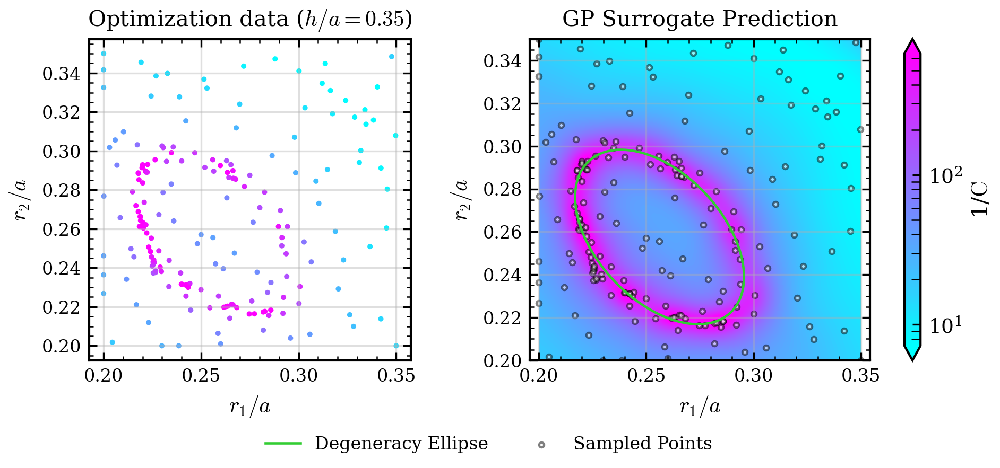

In [10]:
import matplotlib.colors as mcolors
import joblib
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter, LogFormatterSciNotation, LogLocator

# Flag to plot the region/points used for the elliptical fit
PLOT_ELLIPSE_FIT_REGION = False
THRESHOLD_PERCENTILE = 96
data = []

# Loop through each optimization result and plot raw data vs GP surrogate
for h_val, optimizer in results:
    print(f"Processing h={h_val} for plotting...")

    # 1. Load analyzer + optimizer
    analyzer = OptimizationDataAnalyzer(optimizer.data_file)
    analyzer.load_data()
    loaded_optimizer = joblib.load(optimizer.model_file)

    # Raw data and filling factor
    df = analyzer.get_points_above_treshold(0)
    df["filling_factor"] = (np.pi * df["r1"]**2 + np.pi * df["r2"]**2) / 1**2

    # GP predictions
    gp_model = loaded_optimizer.models[-1]
    valid = (analyzer.cost_vals > 0) & (~np.isnan(analyzer.cost_vals))
    X_train = np.c_[analyzer.param1_vals[valid], analyzer.param2_vals[valid]]

    r1_grid = np.linspace(0.2, 0.35, 200)
    r2_grid = np.linspace(0.2, 0.35, 200)
    R1, R2 = np.meshgrid(r1_grid, r2_grid)
    grid_points = np.c_[R1.ravel(), R2.ravel()]

    grid_points_transformed = loaded_optimizer.space.transform(grid_points)
    predicted_cost = gp_model.predict(grid_points_transformed)

    # Diagnostics
    pc = predicted_cost
    try:
        pc_min = np.nanmin(pc)
        pc_p1 = np.nanpercentile(pc, 1)
        pc_med = np.nanmedian(pc)
        pc_p99 = np.nanpercentile(pc, 99)
        pc_max = np.nanmax(pc)
        print(f"predicted_cost: min={pc_min:.3e}, 1%={pc_p1:.3e}, med={pc_med:.3e}, 99%={pc_p99:.3e}, max={pc_max:.3e}")
        n_nonpos = np.sum(np.asarray(pc) <= 0)
        print("predicted_cost non-positive count:", int(n_nonpos))
    except Exception as e:
        print("Failed to compute predicted_cost diagnostics:", e)

    # FOM
    fom_raw = 1.0 / df["cost"]
    predicted_cost_safe = np.where(predicted_cost > 0, predicted_cost, np.nan)
    Predicted_FOM_2D = (1.0 / predicted_cost_safe).reshape(R1.shape)

    # Shared log normalization (robust percentiles)
    all_fom_vals = np.r_[fom_raw.values, Predicted_FOM_2D.ravel()]
    finite_pos = all_fom_vals[np.isfinite(all_fom_vals) & (all_fom_vals > 0)]
    if finite_pos.size == 0:
        print(f"No positive finite FOM values to plot for h={h_val}.")
        continue

    vmin = np.percentile(finite_pos, 1)
    vmax = np.percentile(finite_pos, 99)
    vmin = max(vmin, 1e-12)
    log_norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=ROW1_COL2_SIZE)
    plt.subplots_adjust(wspace=0.35)

    # ---------------------------------------------------------
    # Plot 1: Raw optimization data
    # ---------------------------------------------------------
    scatter_raw = ax1.scatter(
        df["r1"], df["r2"], c=fom_raw, cmap="cool", norm=log_norm, s=2, marker="o"
    )

    ax1.set_xlabel("$r_1/a$")
    ax1.set_ylabel("$r_2/a$")
    ax1.set_title(f"Optimization data ($h/a={h_val}$)")
    ax1.grid(alpha=0.4)
    ax1.set_aspect("equal")

    # ---------------------------------------------------------
    # Plot 2: GP Surrogate Model
    # ---------------------------------------------------------
    levels = np.logspace(np.log10(vmin), np.log10(vmax), 100)
    heatmap = ax2.contourf(
        R1, R2, Predicted_FOM_2D, 
        levels=levels,
        cmap="cool", norm=log_norm, extend="both"
    )

    ridge_threshold = np.percentile(Predicted_FOM_2D, THRESHOLD_PERCENTILE)
    ridge_mask = Predicted_FOM_2D > ridge_threshold
    r1_ridge = R1[ridge_mask]
    r2_ridge = R2[ridge_mask]
    weights_ridge = Predicted_FOM_2D[ridge_mask]

    # Conditionally plot the points used for the ellipse fit
    if PLOT_ELLIPSE_FIT_REGION:
        ax2.scatter(r1_ridge, r2_ridge, color='magenta', s=2, alpha=0.5, label='Ellipse Fit Points', zorder=2)

    conic_params = analyzer.fit_ellipse(r1_ridge, r2_ridge, w=weights_ridge)
    analyzer.plot_ellipse_from_conic(*conic_params, ax=ax2, plot_kwds={'color': 'limegreen', 'label': 'Degeneracy Ellipse'})

    ax2.scatter(X_train[:, 0], X_train[:, 1], c='white', edgecolors='black', s=5, alpha=0.5, label="Sampled Points")

    ax2.set_xlabel("$r_1/a$")
    ax2.set_ylabel("$r_2/a$")
    ax2.set_title("GP Surrogate Prediction")
    ax2.grid(alpha=0.4)
    ax2.set_aspect("equal")

    # ---------------------------------------------------------
    # Global Adjustments (Ticks, Colorbar, Legend)
    # ---------------------------------------------------------
    
    for ax in (ax1, ax2):
        ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    
    # Create a shared colorbar from the contourf mappable so triangular end-caps appear on both subplots
    cbar = fig.colorbar(heatmap, ax=[ax1, ax2], fraction=0.035, pad=0.04, extend='both', format=LogFormatterSciNotation())
    cbar.set_label(r"1/$\mathrm{C}$")
    cbar.ax.tick_params(labelsize=9)
    cbar.locator = LogLocator(base=10.0, numticks=6)
    cbar.update_ticks()
    # Add minor log ticks to give a glimpse of progress between decades
    cbar.ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(2, 10), numticks=12))
    cbar.ax.yaxis.set_minor_formatter(plt.NullFormatter())
    cbar.ax.tick_params(which='minor', length=4)
    
    handles1, labels1 = ax1.get_legend_handles_labels()
    handles2, labels2 = ax2.get_legend_handles_labels()
    
    # Legend placement (pushed slightly down to avoid overlapping the x-axis)
    fig.legend(handles1 + handles2, labels1 + labels2, loc='lower center', bbox_to_anchor=(0.5, -0.15), ncol=4, framealpha=0.95, facecolor='white', edgecolor='black')
        
    # Removed tight_layout() as it often interferes with manually placed colorbars and legends causing overlaps
    # plt.tight_layout()
    plt.show()

    data.append({
        "h" : h_val,
        "optimizer" : optimizer,
        "analyzer" : analyzer, 
        "conic_params" : conic_params,
    })

In [11]:
import numpy as np

for dp in data:
    # 1. Compute the ellipse points using the individual analyzer for this height
    # Returns: r1_array, r2_array, freq_array, conic_params
    r1_ell, r2_ell, _, = dp["analyzer"].compute_freq_dirac_along_ellipse_from_conic(
        dp["conic_params"],
        n_points=50
    )

    # 2. Apply the symmetry mask (r1 <= r2)
    # Since r1 and r2 are interchangeable, we only simulate one half of the ellipse
    mask_sym = r1_ell <= r2_ell
    r1_sym = r1_ell[mask_sym]
    r2_sym = r2_ell[mask_sym]

    # 3. Calculate Filling Factor (FF)
    # Formula based on your previous code: 1 - pi*(r1^2 + r2^2)
    ff_vals = 1 - (np.pi * (r1_sym**2 + r2_sym**2))

    # 4. Create the list of sample dictionaries
    dp["samples"] = [
        {"r1": r1_val, "r2": r2_val, "FF": ff_val}
        for r1_val, r2_val, ff_val in zip(r1_sym, r2_sym, ff_vals)
    ]

print(f"Processed {len(data)} datasets.")
print(f"Example samples for h/a={data[0]['h']}: {len(data[0]['samples'])} points")

Processed 6 datasets.
Example samples for h/a=0.3: 24 points


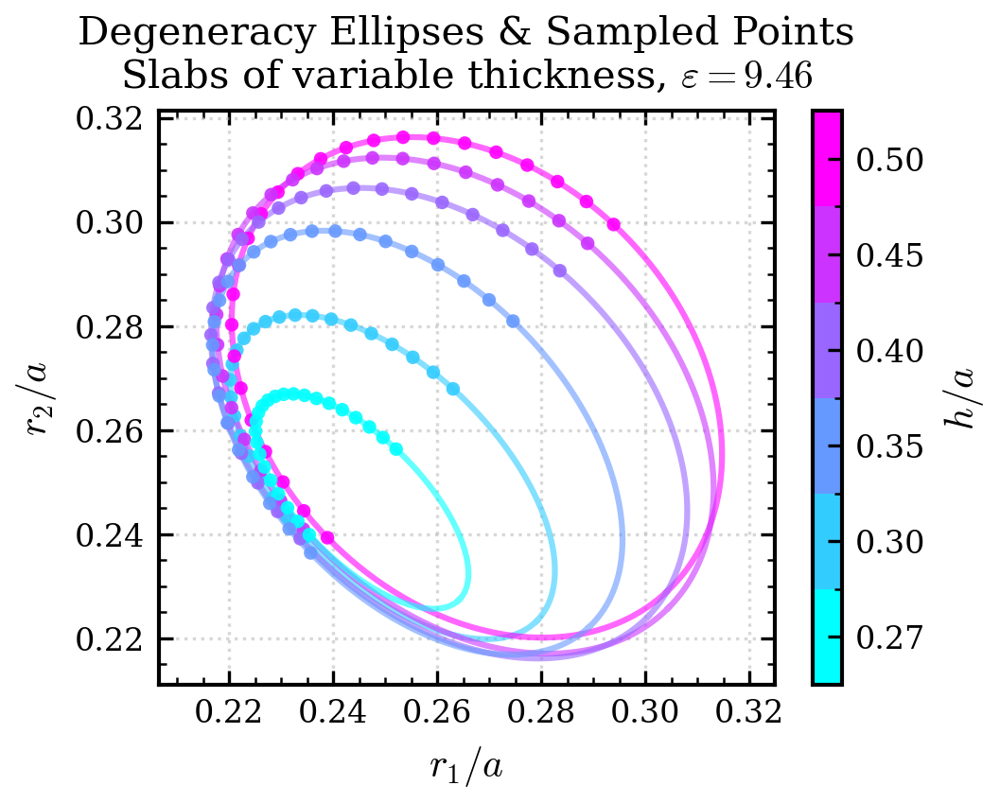

In [12]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import numpy as np

# 1. Identify unique h values and sort them
unique_h = np.sort(np.unique([dp["h"] for dp in data]))
n_levels = len(unique_h)

# 2. Create an integer-based mapping for discrete blocks
boundaries = np.arange(n_levels + 1)
norm = colors.BoundaryNorm(boundaries, n_levels)
cmap = plt.get_cmap('cool', n_levels) 

figure_ellipses = plt.figure(figsize=ROW1_COL1_SIZE)

for dp in data:
    # Find the index of the current h value for color consistency
    idx = np.where(unique_h == dp["h"])[0][0]
    color = cmap(norm(idx))
    
    # --- Plot the Ellipse Line ---
    dp["analyzer"].plot_ellipse_from_conic(
        *dp["conic_params"], 
        plot_kwds={"color": color, "alpha": 0.6, "linewidth": 1.5}
    )
    
    # --- Plot the Sampled Points ---
    if "samples" in dp and dp["samples"]:
        # Extract r1 and r2 from the list of dictionaries
        r1_s = np.array([s["r1"] for s in dp["samples"]])
        r2_s = np.array([s["r2"] for s in dp["samples"]])
        
        # Plot markers on top of the ellipse
        plt.scatter(r1_s, r2_s, color=color, s=12, marker='o', 
                    edgecolors='none', alpha=0.9, zorder=3)

# 3. Setup the Colorbar with Custom Ticks
sm = cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = plt.colorbar(sm, ax=plt.gca(), ticks=np.arange(n_levels) + 0.5)

# Replace integer labels with actual h/a values
cbar.ax.set_yticklabels([f"{val:.2f}" for val in unique_h])
cbar.set_label("$h/a$")

# Final formatting
plt.title(
    f"Degeneracy Ellipses & Sampled Points\n"
    rf"Slabs of variable thickness, $\varepsilon={eps_inp}$"
)
plt.grid(True, linestyle=':', alpha=0.5)
plt.xlabel("$r_1/a$")
plt.ylabel("$r_2/a$")

# Force equal aspect ratio to ensure ellipses look like ellipses
plt.gca().set_aspect('equal', "datalim")

plt.show()

### Linearity Analysis 
As in the 2D case, first make sure that the samples are actually degenerate at gamma (fix r1, sweep r2). 
Then use the degenerate points to get the band diagram. Fit the upper degenerate band in the Gamma-> X direction with a third order polyfit, then calculate the group velocity and the linearity metric 2. Plot these fom against ff for different h/a ratios

#### Define points

In [13]:
SIMULATE = False

In [14]:
import time
import pandas as pd
import os
import numpy as np
from concurrent.futures import ThreadPoolExecutor, as_completed
from phc_nzi.mpi_bayesian_optimization import MPIBayesianOptimizator
from phc_nzi.lsf_job_configurator import LSFJobConfiguration

# Downsample the points to keep the 3D simulations tractable
points_to_analyze = []
for dp in data:
    h_val = dp["h"]
    # Take a subset of points per thickness (e.g., every 5th point)
    for s in dp["samples"][::2]: 
        points_to_analyze.append({'h': h_val, 'r1': s['r1'], 'r2_orig': s['r2'], 'ff_approx': s['FF']})

# Tightly bound the search region for r2 around its previous sweep values
r_half_width = 0.01    

# Gamma-only configuration for the slab
config_slab_deg = dict(
    resolution=RESOLUTION_SLAB,
    num_bands=10,
    k_points=[mp.Vector3(0, 0, 0)],
)
mpb_config_slab_deg = MPBSchemeConfigurator(photonic_crystal_slab, ["zeven"], **config_slab_deg)
script_slab_deg = mpb_config_slab_deg.get_scheme_config(join_newline=True)

print(f"Optimizing r2 (1D) for {len(points_to_analyze)} points using MPI Bayesian Optimization on LSF")

numproc = 16
lsf_config = LSFJobConfiguration(
    queue="hpc",
    num_processors=numproc, 
    mem="4GB",
    walltime="04:00"
)

optimizers_slab = []
initial_generations = 1

for i, pt in enumerate(points_to_analyze):
    r1_orig, r2_orig, h_i = pt['r1'], pt['r2_orig'], pt['h']
    
    # Restrict bounds ONLY around r2 to create a 1D search space
    r2_lo, r2_hi = max(0.1, r2_orig - r_half_width), min(0.49, r2_orig + r_half_width)

    # 1. FIXED NAMING CONVENTION: Use physical parameters instead of index
    sim_name = f"{name_slab_opt}_deg_opt_h{h_i:.2f}_r1_{r1_orig:.4f}"
    sim_dir = os.path.join(data_rooth, sim_name).replace('\\', '/')
    
    # 2. CONDITIONAL FILE CREATION: Only create folders/scripts if simulating
    if SIMULATE:
        os.makedirs(sim_dir, exist_ok=True)
        ctl_path = os.path.join(sim_dir, sim_name + ".ctl")
        with open(ctl_path, "w") as f:
            f.write(script_slab_deg)
            f.flush()
            os.fsync(f.fileno())

    # Set up BO options (Optimizing ONLY r2)
    bo_options = {
        "dimensions": [(r2_lo, r2_hi)],
        "acq_func": "LCB",
        "acq_func_kwargs": {"kappa": 0.2},  # More exploitation 
        "n_initial_points": numproc * initial_generations,
        "initial_point_generator": "lhs"
    }
    
    # Note: If SIMULATE=False, MPIBayesianOptimizator might complain if the directory doesn't exist at all.
    # If you get an error here when loading, add: os.makedirs(sim_dir, exist_ok=True) right above this.
    optimizer = MPIBayesianOptimizator(
        simulation_name=sim_name,
        scheme_script=script_slab_deg,
        param_names=["r2"],                   # Only r2 is dynamic
        fixed_params={"r1": r1_orig},         # Lock r1 to its original value
        polarization="zeven",
        maxiter=initial_generations + 1,
        batch_size=numproc,
        bo_options=bo_options,
        bands=[8, 9, 10],                     # Gap is between band 8 and 10 in 3D
        height_slab=h_i,                      # Still passed normally, handled by backward compatibility
        directory=sim_dir
    )
    
    optimizers_slab.append({
        'idx': i, 'h': h_i, 'r1_orig': r1_orig, 'r2_orig': r2_orig,
        'r2_lo': r2_lo, 'r2_hi': r2_hi,       # Save bounds for printing later
        'optimizer': optimizer, 'sim_name': sim_name
    })

t0 = time.time()
submission_outputs = []

if SIMULATE:
    print(f"Submitting {len(optimizers_slab)} optimizations to LSF concurrently...")
    
    # 1. Concurrent Submissions
    def submit_task(entry):
        opt = entry['optimizer']
        opt.erease_data_file()
        out = opt.submit_lsf_job(lsf_config=lsf_config, conda_env_name="mpb-nzi-env")
        print(f"  [{entry['idx']+1}] Submitted LSF job for h={entry['h']:.2f}, fixed r1={entry['r1_orig']:.4f}, r2 bounds=[{entry['r2_lo']:.4f}, {entry['r2_hi']:.4f}]")
        return (opt, out)

    with ThreadPoolExecutor(max_workers=min(32, len(optimizers_slab))) as pool:
        futures = [pool.submit(submit_task, entry) for entry in optimizers_slab]
        for fut in as_completed(futures):
            submission_outputs.append(fut.result())
    
    # 2. Concurrent Waiting
    print("Waiting for jobs to finish concurrently...")
    def wait_task(opt_out_pair):
        opt, out = opt_out_pair
        if out:
            opt.wait_for_job(out, poll_interval=15)
            
    with ThreadPoolExecutor(max_workers=len(submission_outputs)) as pool:
        futures = {pool.submit(wait_task, pair): pair for pair in submission_outputs}
        for fut in as_completed(futures):
            fut.result() 
else:
    print("SIMULATE=False → Loading existing optimization data...")


# 3. Concurrent Results Loading
def parse_results(entry):
    opt = entry['optimizer']
    data_file = opt.data_file
    r1_corr = entry['r1_orig']
    r2_corr = entry['r2_orig']
    gap_corr = np.nan
    
    if os.path.exists(data_file):
        try:
            records = []
            with open(data_file, 'r') as f:
                for line in f:
                    if not line.strip(): continue
                    parts = dict(item.split(': ') for item in line.strip().split(', '))
                    records.append({
                        'r1': float(parts['r1']),
                        'r2': float(parts['r2']),
                        'cost': float(parts['cost'])
                    })
            if records:
                df_res = pd.DataFrame(records)
                best_idx = df_res['cost'].idxmin()
                best_row = df_res.loc[best_idx]
                r1_corr = best_row['r1']
                r2_corr = best_row['r2']
                gap_corr = best_row['cost']
        except Exception as e:
            print(f"Error reading {data_file}: {e}")
    else:
        pass # Silently pass to avoid spamming warnings for un-simulated points

    return {
        'idx': entry['idx'], 'h': entry['h'], 
        'r1_original': entry['r1_orig'], 'r1_corrected': r1_corr,
        'r2_original': entry['r2_orig'], 'r2_corrected': r2_corr,
        'gap_corrected': gap_corr, 
        'delta_r1': r1_corr - entry['r1_orig'],
        'delta_r2': r2_corr - entry['r2_orig'],
        'ff': 1 - (np.pi * r1_corr**2 + np.pi * r2_corr**2)
    }

print("Loading results concurrently...")
with ThreadPoolExecutor(max_workers=min(32, len(optimizers_slab))) as pool:
    corrected_slab_points = list(pool.map(parse_results, optimizers_slab))

corrected_slab_points.sort(key=lambda x: x['idx'])
df_corr_slab = pd.DataFrame(corrected_slab_points)
# Only calculate mean if we actually loaded valid data
valid_gaps = df_corr_slab['gap_corrected'].dropna()
mean_gap_str = f"{valid_gaps.mean():.2e}" if not valid_gaps.empty else "N/A (No data found)"
print(f"\nDone in {time.time()-t0:.0f}s. Mean gap_corrected = {mean_gap_str}")

COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)']
Optimizing r2 (1D) for 74 points using MPI Bayesian Optimization on LSF
SIMULATE=False → Loading existing optimization data...
Loading results concurrently...

Done in 14s. Mean gap_corrected = 1.04e-04


Invalid corrected points: 11 (threshold=0.0001)


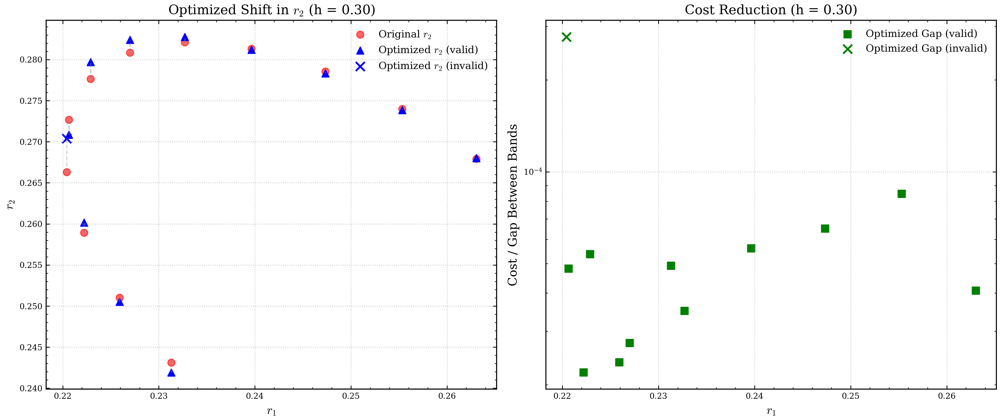

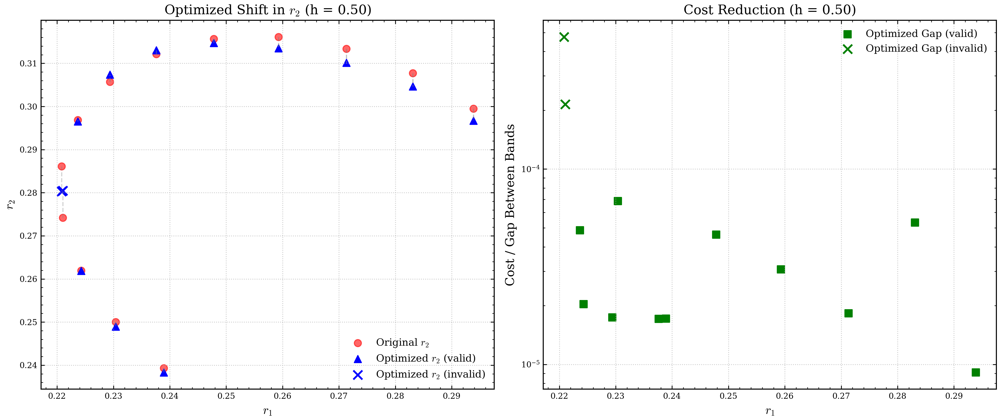

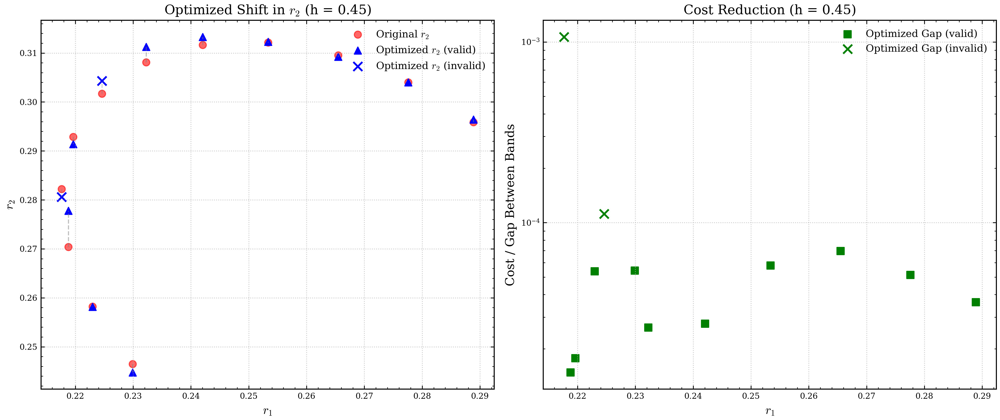

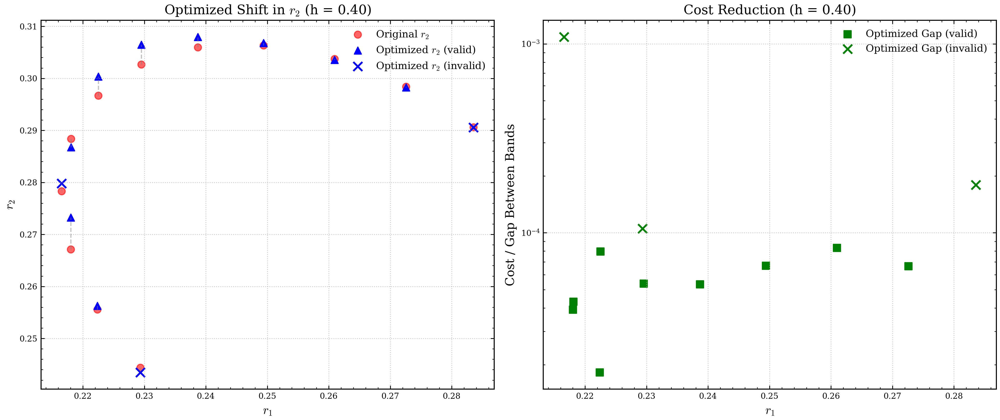

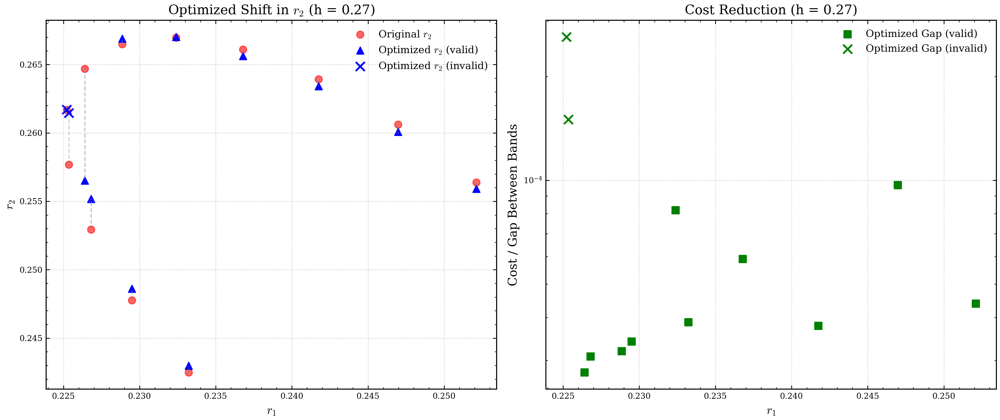

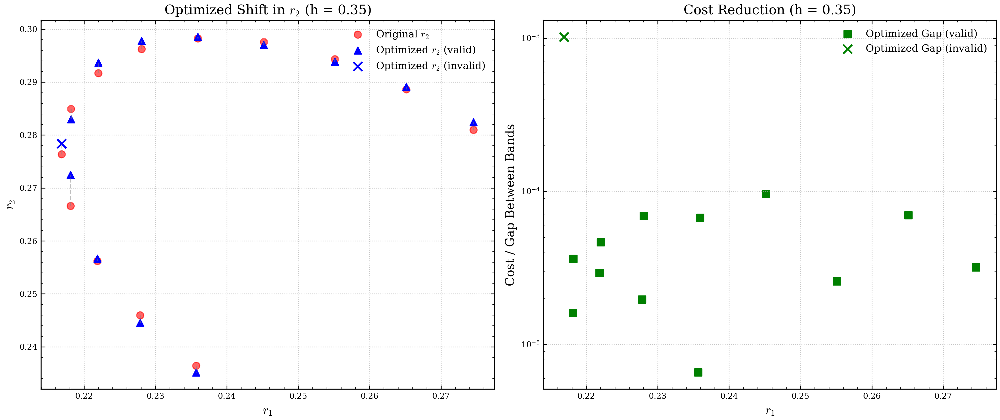

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

COST_THRESHOLD = 1e-4

required_cols = ["h", "r1_original", "r2_original", "r2_corrected",  "gap_corrected"]
missing = [c for c in required_cols if c not in df_corr_slab.columns]
if missing:
    raise KeyError(f"Missing required columns: {missing}")

# Keep originals in-place; only split corrected points into valid/invalid
invalid_points_list = []
groups = {}

for h_val, group in df_corr_slab.groupby("h", sort=False):
    g = group.copy()
    invalid_mask = g["gap_corrected"].isna() | (g["gap_corrected"] > COST_THRESHOLD)

    groups[h_val] = {
        "all": g,                         # originals are always plotted from here
        "valid_corr": g.loc[~invalid_mask].copy(),
        "invalid_corr": g.loc[invalid_mask].copy(),
    }

    if invalid_mask.any():
        invalid_points_list.append(g.loc[invalid_mask].copy())

invalid_points_df = (
    pd.concat(invalid_points_list, ignore_index=True)
    if invalid_points_list else pd.DataFrame(columns=df_corr_slab.columns)
)
print(f"Invalid corrected points: {len(invalid_points_df)} (threshold={COST_THRESHOLD:g})")

for h_val, d in groups.items():
    g_all = d["all"]
    g_valid = d["valid_corr"]
    g_invalid = d["invalid_corr"]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    # LEFT: r2 shift
    # Originals (always shown, never moved)
    ax1.scatter(
        g_all["r1_original"], g_all["r2_original"],
        color="red", marker="o", s=50, alpha=0.6, label="Original $r_2$"
    )

    # Corrected valid
    if not g_valid.empty:
        ax1.scatter(
            g_valid["r1_original"], g_valid["r2_corrected"],
            color="blue", marker="^", s=50, label="Optimized $r_2$ (valid)"
        )
        for _, row in g_valid.iterrows():
            ax1.plot(
                [row["r1_original"], row["r1_original"]],
                [row["r2_original"], row["r2_corrected"]],
                color="gray", linestyle="--", alpha=0.5
            )

    # Corrected invalid as X (originals remain circles)
    if not g_invalid.empty:
        ax1.scatter(
            g_invalid["r1_original"], g_invalid["r2_corrected"],
            color="blue", marker="x", s=80, linewidths=1.8, label="Optimized $r_2$ (invalid)"
        )
        for _, row in g_invalid.iterrows():
            ax1.plot(
                [row["r1_original"], row["r1_original"]],
                [row["r2_original"], row["r2_corrected"]],
                color="gray", linestyle="--", alpha=0.35
            )

    ax1.set_title(f"Optimized Shift in $r_2$ (h = {h_val:.2f})", fontsize=13)
    ax1.set_xlabel("$r_1$", fontsize=12)
    ax1.set_ylabel("$r_2$", fontsize=12)
    ax1.grid(True, linestyle=":", alpha=0.7)
    ax1.legend(fontsize=10)


    # Corrected valid
    if not g_valid.empty:
        ax2.scatter(
            g_valid["r1_original"], g_valid["gap_corrected"],
            color="green", marker="s", s=50, label="Optimized Gap (valid)"
        )
        for _, row in g_valid.iterrows():
            ax2.plot(
                [ row["r1_original"]],
                [ row["gap_corrected"]],
                color="gray", linestyle="--", alpha=0.5
            )

    # Corrected invalid as X (originals remain circles)
    if not g_invalid.empty:
        ax2.scatter(
            g_invalid["r1_original"], g_invalid["gap_corrected"],
            color="green", marker="x", s=80, linewidths=1.8, label="Optimized Gap (invalid)"
        )
        for _, row in g_invalid.iterrows():
            ax2.plot(
                [ row["r1_original"]],
                [ row["gap_corrected"]],
                color="gray", linestyle="--", alpha=0.35
            )

    ax2.set_title(f"Cost Reduction (h = {h_val:.2f})", fontsize=13)
    ax2.set_xlabel("$r_1$", fontsize=12)
    ax2.set_ylabel("Cost / Gap Between Bands", fontsize=12)
    ax2.set_yscale("log")
    ax2.grid(True, linestyle=":", alpha=0.7)
    ax2.legend(fontsize=10)

    plt.tight_layout()
    plt.show()

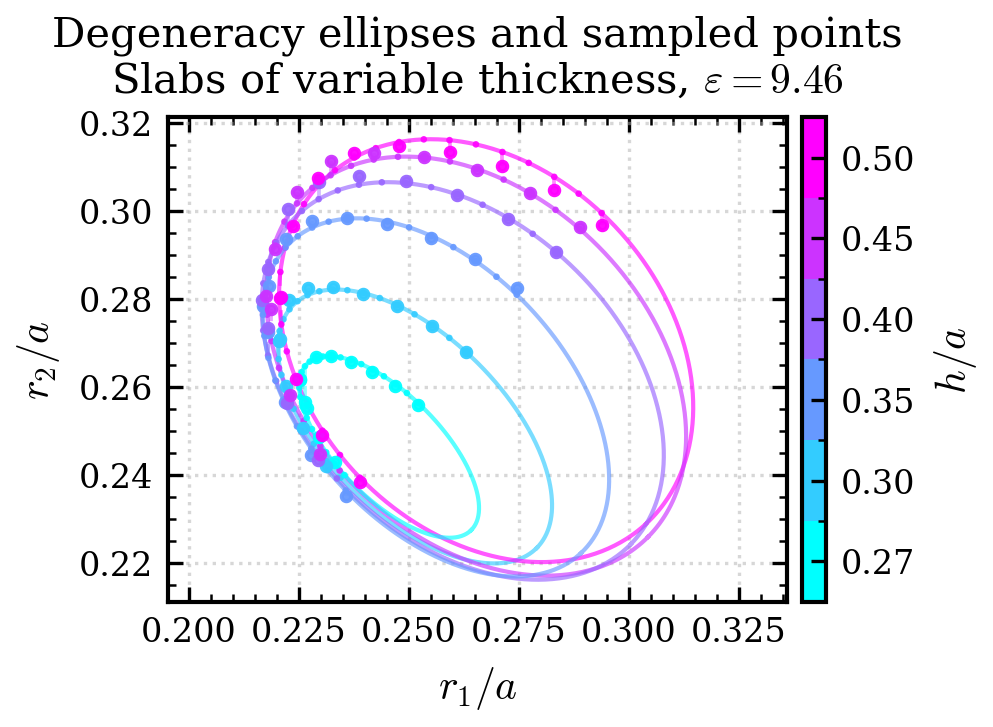

In [21]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
from matplotlib.lines import Line2D
import numpy as np

# ------------------------------------------------------------
# Single figure: ellipses + sampled circles + corrected triangles
# Uses one discrete "cool" color per h/a (same scheme throughout)
# ------------------------------------------------------------

# 1) Build a common h-grid from available sources
h_from_data = [dp["h"] for dp in data] if "data" in globals() else []
h_from_corr = (
    df_corr_slab["h"].dropna().to_list()
    if "df_corr_slab" in globals() and "h" in df_corr_slab.columns
    else []
)
unique_h = np.sort(np.unique(np.array(h_from_data + h_from_corr, dtype=float)))
n_levels = len(unique_h)

if n_levels == 0:
    raise ValueError("No h values found in `data` or `df_corr_slab`.")

# Discrete colormap setup (one color per h)
boundaries = np.arange(n_levels + 1)
norm = colors.BoundaryNorm(boundaries, n_levels)
cmap = plt.get_cmap("cool", n_levels)

fig, ax = plt.subplots(figsize=ROW1_COL1_SIZE)

# Optional tolerance for float h matching
h_tol = 1e-9

# 2) Plot ellipses and sampled points (circles)
if "data" in globals():
    for dp in data:
        h_val = float(dp["h"])
        idx = int(np.argmin(np.abs(unique_h - h_val)))
        color = cmap(norm(idx))

        # Ellipse
        dp["analyzer"].plot_ellipse_from_conic(
            *dp["conic_params"],
            plot_kwds={"color": color, "alpha": 0.65, "linewidth": 1}
        )

        # Sampled points as circles
        if "samples" in dp and dp["samples"]:
            r1_s = np.array([s["r1"] for s in dp["samples"]], dtype=float)
            r2_s = np.array([s["r2"] for s in dp["samples"]], dtype=float)
            ax.scatter(
                r1_s, r2_s,
                color=color, s=10, marker=".",
                edgecolors="none", alpha=0.9, zorder=3
            )

# 3) Overlay corrected points as triangles (same h color)
if "df_corr_slab" in globals():
    needed_cols = {"h", "r1_original", "r2_corrected"}
    missing = needed_cols - set(df_corr_slab.columns)
    if missing:
        raise KeyError(f"df_corr_slab is missing required columns: {missing}")

    # If available, draw shift guides from original -> corrected
    can_draw_shift = {"r2_original"}.issubset(df_corr_slab.columns)

    for h_val in unique_h:
        sel = np.isclose(df_corr_slab["h"].values.astype(float), h_val, atol=h_tol)
        group = df_corr_slab.loc[sel]
        if group.empty:
            continue

        idx = int(np.argmin(np.abs(unique_h - h_val)))
        color = cmap(norm(idx))

        # Corrected points as triangles
        ax.scatter(
            group["r1_original"].values.astype(float),
            group["r2_corrected"].values.astype(float),
            marker="o", s=5,
            facecolors=color,
            alpha=0.95, zorder=5
        )

        # Optional visual shift lines
        if can_draw_shift:
            for _, row in group.iterrows():
                ax.plot(
                    [row["r1_original"], row["r1_original"]],
                    [row["r2_original"], row["r2_corrected"]],
                    color=color, linestyle="--", linewidth=0.9, alpha=0.45, zorder=4
                )

# 4) Discrete colorbar labeled with actual h/a values
sm = cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, ticks=np.arange(n_levels) + 0.5, pad=0.02)
cbar.ax.set_yticklabels([f"{v:.2f}" for v in unique_h])
cbar.set_label("$h/a$")




ax.set_title(
    f"Degeneracy ellipses and sampled points\n"
    rf"Slabs of variable thickness, $\varepsilon={eps_inp}$"
)
ax.set_xlabel("$r_1/a$")
ax.set_ylabel("$r_2/a$")
ax.grid(True, linestyle=":", alpha=0.5)
ax.set_aspect("equal", "datalim")

plt.tight_layout()
plt.show()

#### Run Optimized simulations

In [22]:
SIMULATE = False

In [23]:
# Filter df_corr_slab to retain only successful optimizations
df_cleaned = df_corr_slab[
    df_corr_slab['gap_corrected'].notna() & 
    (df_corr_slab['gap_corrected'] <= COST_THRESHOLD)
].copy()

# Summary of the filtering process
removed_count = len(df_corr_slab) - len(df_cleaned)
print(f"Points removed: {removed_count}")
print(f"Points remaining: {len(df_cleaned)}")

Points removed: 11
Points remaining: 63


In [24]:
import os
from concurrent.futures import ThreadPoolExecutor, as_completed

N_WORKERS = len(df_cleaned)

# 1. Setup LSF Configuration


# 2. Initialize Simulation Objects
sims_centered = []
for i, row in df_cleaned[::1].iterrows():
    lsf_config = LSFJobConfiguration(
        walltime="01:00",
        num_processors=32, 
        span_option="hosts", 
        span_value=1, 
        queue="hpc" if i%2==0 else "fotonano",
        mem="2GB"  # Keeping this slightly higher for 3D field outputs
    )
    

    h_val = row['h']
    r1_val = row['r1_corrected']
    r2_val = row['r2_corrected']
    ff = row['ff']
    
    # FIXED NAMING CONVENTION: Use h and r1 instead of idx
    sim_name = f"{name_slab_opt}_centered_h{h_val:.2f}_r1_{r1_val:.4f}"
    sim_dir = os.path.join(data_rooth, sim_name).replace('\\', '/')
    
    # Only explicitly make the directory if we are simulating
    if SIMULATE:
        os.makedirs(sim_dir, exist_ok=True)
        
    sim = Simulation(
        simulation_name=sim_name,
        script=script_slab_opt_centered,
        directory=sim_dir
    )
    
    sims_centered.append({
        'r1': r1_val, 
        'r2': r2_val, 
        'h': h_val, 
        'sim': sim,
        'sim_name': sim_name,
        'ff': ff,
        'lsf_config': lsf_config
    })

if SIMULATE is False:
    print("SIMULATE=False → Skipping actual runs. Proceeding to post-processing.")
else:
    def run_centered_sim_lsf(args):
        j, entry = args
        
        # Unconditionally submit to LSF (SAFEGUARD removed)
        entry['sim'].run_hpc_lsf(
            mpb_command_line_params=dict(
                r1=entry['r1'], 
                r2=entry['r2'], 
                h=entry['h']
            ),
            LSFOptions=entry['lsf_config']
        )
        return j, False  # False means submitted

    print(f"Running {len(sims_centered)} centered sims on LSF with {N_WORKERS} workers...")
    from concurrent.futures import ThreadPoolExecutor, as_completed
    with ThreadPoolExecutor(max_workers=N_WORKERS) as pool:
        futures = {pool.submit(run_centered_sim_lsf, (j, e)): j for j, e in enumerate(sims_centered)}
        for fut in as_completed(futures):
            j, skipped = fut.result()
            # Since skipped is always False now, status will always be "submitted"
            status = "skipped (already exists)" if skipped else "submitted"
            print(f"  [{j+1}/{len(sims_centered)}] {sims_centered[j]['sim_name']} {status}")
            
    print(f"\nAll {len(sims_centered)} centered simulations processed.")

# --- Updated Post-processing and Data Collection ---
print("\nCollecting results from completed simulations...")
opt = MPBDataOptions(rectify=True, periods=1)
extracted_data = []
failed_sims = []  # <--- NEW: List to store entries that need rerunning

for entry in sims_centered:
    sim = entry['sim']
    sim_name = entry['sim_name']
    
    # 1. Check for directory existence
    if not os.path.exists(sim.directory):
        print(f"  -> FAILED: {sim_name} (Directory not found).")
        failed_sims.append(entry)
        continue
        
    print(f"Loading data for {sim_name}...")
    
    try:
        # Initialize the viewer
        viewer = SimulationViewer(sim)
        
        # Load frequency data (zeven polarization for 3D slab)
        df_freq = sim.load_frequency_data("zeven")
        
        extracted_data.append({
            'entry_info': entry,
            'viewer': viewer,
            'frequencies': df_freq
        })
    except Exception as e:
        print(f"  -> FAILED: {sim_name} (Error loading data: {e})")
        failed_sims.append(entry) # <--- NEW: Capture load errors (e.g., interrupted runs)

print(f"\n--- Summary ---")
print(f"Successfully loaded: {len(extracted_data)}")
print(f"Failed/Missing: {len(failed_sims)}")

if failed_sims:
    print("\nThe following simulations failed and are stored in 'failed_sims':")
    for f in failed_sims:
        print(f" - {f['sim_name']}")

SIMULATE=False → Skipping actual runs. Proceeding to post-processing.

Loading data for C4v_diatomic_holes_1_slab_opt_centered_h0.30_r1_0.2630...
Loading data for C4v_diatomic_holes_1_slab_opt_centered_h0.30_r1_0.2553...
Loading data for C4v_diatomic_holes_1_slab_opt_centered_h0.30_r1_0.2473...
Loading data for C4v_diatomic_holes_1_slab_opt_centered_h0.30_r1_0.2396...
Loading data for C4v_diatomic_holes_1_slab_opt_centered_h0.30_r1_0.2327...
Loading data for C4v_diatomic_holes_1_slab_opt_centered_h0.30_r1_0.2270...
Loading data for C4v_diatomic_holes_1_slab_opt_centered_h0.30_r1_0.2229...
Loading data for C4v_diatomic_holes_1_slab_opt_centered_h0.30_r1_0.2206...
Loading data for C4v_diatomic_holes_1_slab_opt_centered_h0.30_r1_0.2222...
Loading data for C4v_diatomic_holes_1_slab_opt_centered_h0.30_r1_0.2259...
Loading data for C4v_diatomic_holes_1_slab_opt_centered_h0.30_r1_0.2313...
Loading data for C4v_diatomic_holes_1_slab_opt_centered_h0.50_r1_0.2939...
Loading data for C4v_diatomic

In [25]:
# --- Rerunning Only Failed Simulations (Forced to fotonano) ---
from concurrent.futures import ThreadPoolExecutor, as_completed

if not failed_sims:
    print("No failed simulations found. Nothing to rerun!")
else:
    # 1. Define the submission function here to avoid NameError
    def run_centered_sim_lsf(args):
        j, entry = args
        entry['sim'].run_hpc_lsf(
            mpb_command_line_params=dict(
                r1=entry['r1'], 
                r2=entry['r2'], 
                h=entry['h']
            ),
            LSFOptions=entry['lsf_config']
        )
        return j, False

    print(f"Rerunning {len(failed_sims)} failed simulations specifically on 'fotonano'...")
    
    # 2. Update the queue for every failed entry
    for entry in failed_sims:
        entry['lsf_config'].queue = "fotonano" 

    # 3. Use an optimized worker count
    RERUN_WORKERS = min(len(failed_sims), 20) 

    with ThreadPoolExecutor(max_workers=RERUN_WORKERS) as pool:
        futures = {pool.submit(run_centered_sim_lsf, (j, e)): j for j, e in enumerate(failed_sims)}
        
        for fut in as_completed(futures):
            j, skipped = fut.result()
            print(f"  [{j+1}/{len(failed_sims)}] {failed_sims[j]['sim_name']} -> Submitted to fotonano")

    print(f"\nAll {len(failed_sims)} failed simulations have been resubmitted to 'fotonano'.")

No failed simulations found. Nothing to rerun!


Found 6 successful simulations with min FF. Plotting...
Generating plot for C4v_diatomic_holes_1_slab_opt_centered_h0.27_r1_0.2521...


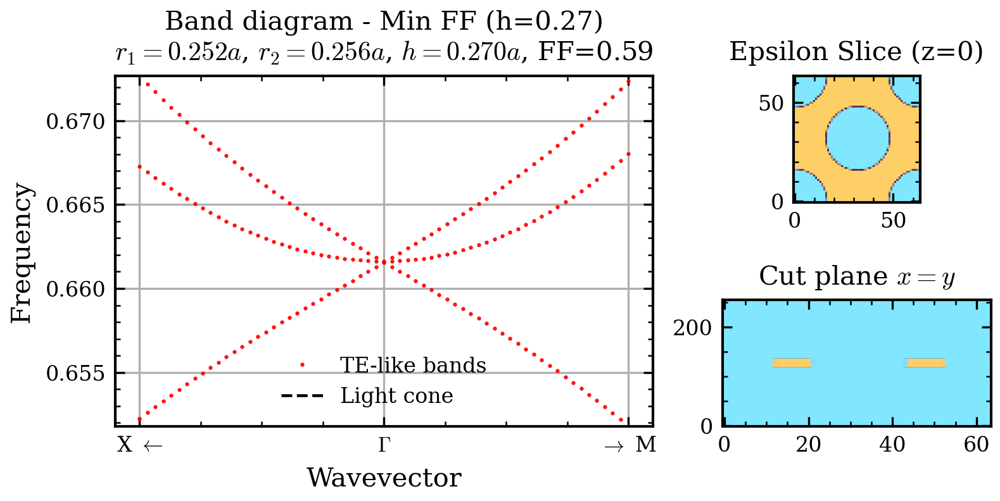

Generating plot for C4v_diatomic_holes_1_slab_opt_centered_h0.30_r1_0.2630...


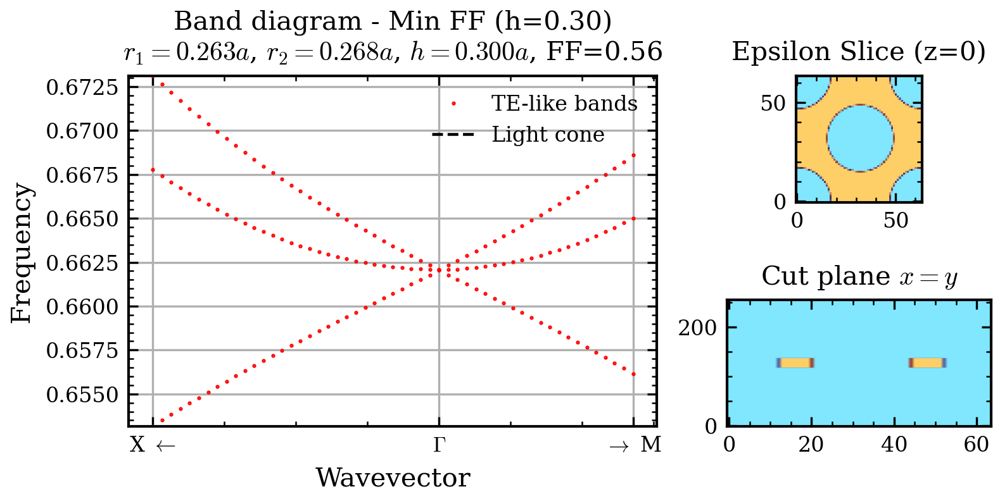

Generating plot for C4v_diatomic_holes_1_slab_opt_centered_h0.35_r1_0.2746...


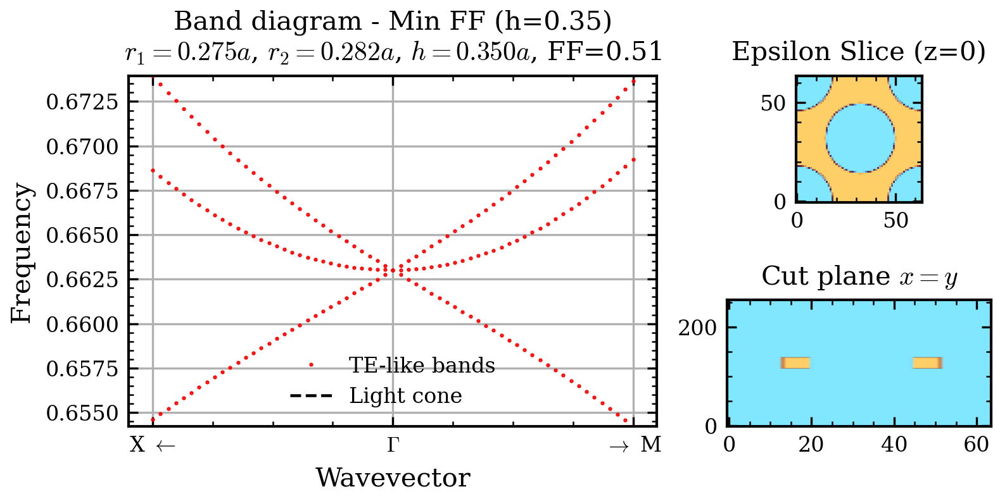

Generating plot for C4v_diatomic_holes_1_slab_opt_centered_h0.40_r1_0.2726...


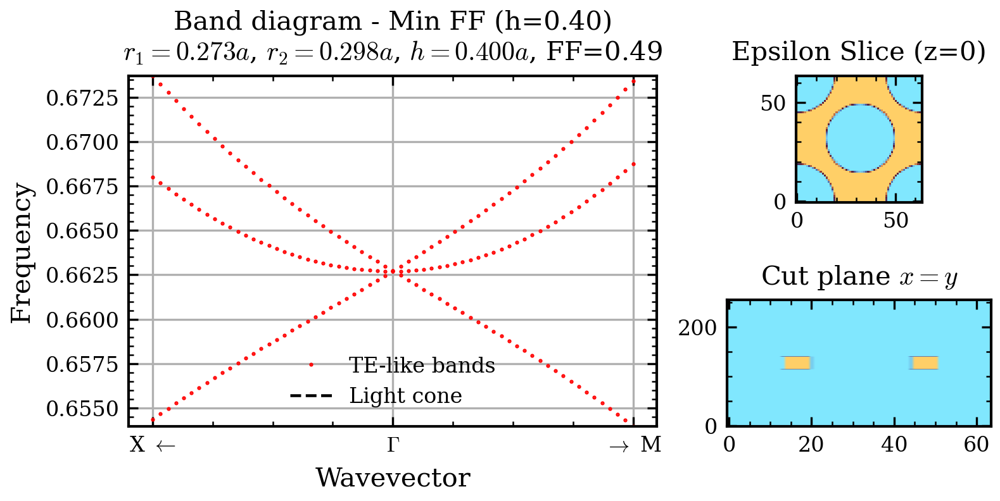

Generating plot for C4v_diatomic_holes_1_slab_opt_centered_h0.45_r1_0.2889...


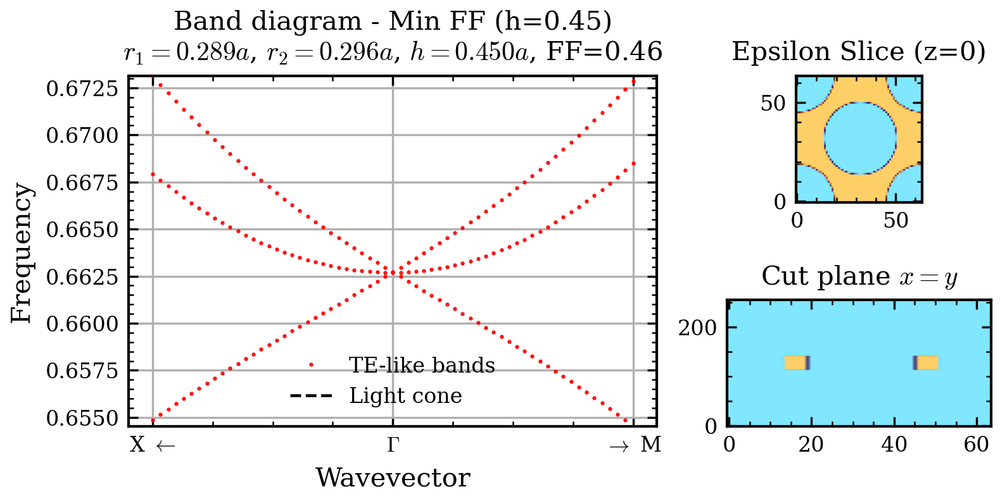

Generating plot for C4v_diatomic_holes_1_slab_opt_centered_h0.50_r1_0.2939...


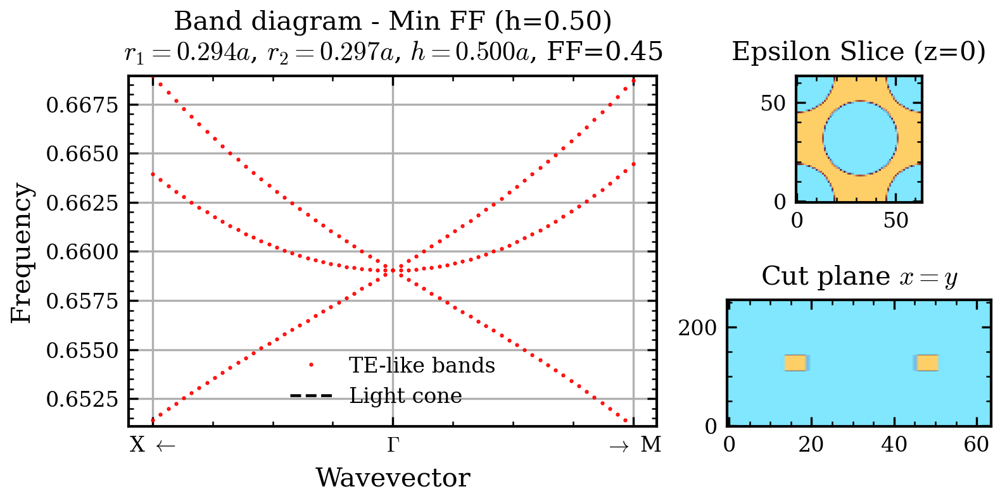

All plots generated from loaded data.


In [26]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# 1. Create a helper DataFrame from successfully loaded data
# We include the index so we can map back to the 'extracted_data' list
loaded_info = []
for i, entry in enumerate(extracted_data):
    info = entry['entry_info'].copy()
    info['extracted_idx'] = i
    loaded_info.append(info)

df_loaded = pd.DataFrame(loaded_info)

if df_loaded.empty:
    print("No data found in extracted_data. Did the previous cell succeed?")
else:
    # Identify the points with the minimum FF for each thickness (h)
    min_ff_indices = df_loaded.groupby('h')['ff'].idxmin()
    selected_entries = df_loaded.loc[min_ff_indices]

    print(f"Found {len(selected_entries)} successful simulations with min FF. Plotting...")

    # Ensure figure save directory exists
    fig_folder = os.path.join(figure_path, name_slab_opt + "_min_ff_bands")
    os.makedirs(fig_folder, exist_ok=True)

    # 2. Loop through the selected entries and plot using pre-loaded objects
    for _, row in selected_entries.iterrows():
        idx = int(row['extracted_idx'])
        data_item = extracted_data[idx]
        
        # Pull pre-loaded objects directly
        viewer_3D = data_item['viewer']
        df_zeven = data_item['frequencies']
        
        # Meta-data for labels
        h_val, r1_val, r2_val, ff_val = row['h'], row['r1'], row['r2'], row['ff']
        sim_name = data_item['entry_info']['sim_name']
        data_line = rf"$r_1={r1_val:0.3f}a$, $r_2={r2_val:0.3f}a$, $h={h_val:0.3f}a$, FF={ff_val:0.2f}"
        
        print(f"Generating plot for {sim_name}...")

        # --- Plotting Logic ---
        fig = plt.figure(figsize=ROW1_COL15_SIZE, constrained_layout=True)
        gs = gridspec.GridSpec(2, 3, figure=fig)

        # -- LEFT PANEL: Band Diagram --
        ax_band = fig.add_subplot(gs[:, 0:2])
        plt.sca(ax_band) 
        plot_options = dict(linestyle='', marker='.', markersize=1)

        # Plot pre-loaded frequency data
        viewer_3D.plot_band_diagram("zeven", k_points_path=k_points_2D_optimized, 
                                    color="red", plot_options=plot_options, custom_label="TE-like bands")
        viewer_3D.plot_light_cone(df_zeven)
        
        # Focus on the band gap region (Bands 8-10)
        ymin = df_zeven["zeven band 8"].min()
        ymax = df_zeven["zeven band 10"].max()
        ax_band.set_ylim(ymin, ymax)
        ax_band.set_title(f"Band diagram - Min FF (h={h_val:.2f})\n{data_line}")

        # -- TOP RIGHT PANEL: z=0 Slice --
        ax_lat = fig.add_subplot(gs[0, 2])
        opt_3x3 = MPBDataOptions(rectify=True, periods=1)
        eps_3x3 = data_item['entry_info']['sim'].load_and_convert_epsilon_data(options=opt_3x3)
        eps_slice = eps_3x3[:, :, eps_3x3.shape[2] // 2]

        ax_lat.imshow(eps_slice, cmap="managua_r", origin="lower") 
        ax_lat.set_title("Epsilon Slice (z=0)")

        # -- BOTTOM RIGHT PANEL: Diagonal Cut --
        ax_cut = fig.add_subplot(gs[1, 2])
        eps_cut = np.diagonal(eps_3x3, axis1=0, axis2=1)
        ax_cut.imshow(eps_cut, cmap="managua_r", origin="lower", aspect="auto") 
        ax_cut.set_title("Cut plane $x=y$")

        # Save and display
        save_path = os.path.join(fig_folder, f"min_ff_bands_h{h_val:.2f}_r1_{r1_val:.4f}.png")
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        plt.show()

print("All plots generated from loaded data.")

##### Perturbation (Single)

In [27]:
def unmix_c4_subspace(H_subspace, eps):
    """
    Unmixes a degenerate subspace of H-fields using C4 (90-degree) spatial rotation.
    H_subspace should have shape (N_bands, Nx, Ny, Nz, 3)
    """
    N_bands = H_subspace.shape[0]
    
    # 1. Rotate the spatial grid by 90 degrees in x-y plane (axes 1 and 2)
    H_rot_grid = np.rot90(H_subspace, k=1, axes=(1, 2))
    
    # 2. Rotate the vector components (H is a vector)
    # R(90 deg) maps: x -> -y, y -> x, z -> z
    H_c4 = np.zeros_like(H_rot_grid)
    H_c4[..., 0] = -H_rot_grid[..., 1]  # H'_x = -H_y
    H_c4[..., 1] =  H_rot_grid[..., 0]  # H'_y =  H_x
    H_c4[..., 2] =  H_rot_grid[..., 2]  # H'_z =  H_z
    
    # 3. Calculate Overlap Matrix: O_ij = <H_i | C_4 | H_j>
    inv_eps_4d = np.expand_dims(1.0 / eps, axis=-1)
    O_matrix = np.zeros((N_bands, N_bands), dtype=complex)
    
    for i in range(N_bands):
        for j in range(N_bands):
            integrand = np.sum(np.conj(H_subspace[i]) * inv_eps_4d * H_c4[j], axis=-1)
            O_matrix[i, j] = np.mean(integrand)
            
    # 4. Diagonalize the Unitary Overlap Matrix
    evals, evecs = np.linalg.eig(O_matrix)
    
    # Sort by the angle of the eigenvalue to consistently order them (1, i, -i)
    idx = np.argsort(np.angle(evals))
    evecs = evecs[:, idx]
    
    # 5. Apply Unitary rotation to unmix the fields
    H_unmixed = np.zeros_like(H_subspace, dtype=complex)
    for i in range(N_bands):
        for j in range(N_bands):
            H_unmixed[i] += evecs[j, i] * H_subspace[j]
            
    # 6. Re-normalize to be safe
    for i in range(N_bands):
        intensity = np.sum(np.abs(H_unmixed[i])**2, axis=-1)
        H_unmixed[i] /= np.sqrt(np.mean(intensity))
        
    return H_unmixed

In [28]:
# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib.gridspec as gridspec
# import matplotlib.patches as patches
# import pandas as pd
# import os
# from scipy.stats import linregress

# # 1. Setup Simulation and Frequencies
# entity = extracted_data[-1]
# entity = test_entity if 'test_entity' in locals() else entity
# sim = entity['entry_info']['sim']
# df_zeven = entity['frequencies']
# viewer = entity['viewer']

# # 2. Identify the Gamma point and relevant bands (8, 9, 10)
# gamma_row = df_zeven.loc[(df_zeven["k1"] == 0) & (df_zeven["k2"] == 0)]
# k_idx = int(gamma_row["k index"].iloc[0])
# band_list = [1,2,3,4,5,6,7,8, 9, 10,11,12,13,14,15]

# # 3. Load FULL 3D Vector Fields (Hx, Hy, Hz) into a 4D array H(x, y, z, u)
# H_vector_raw = []
# opt = MPBDataOptions(rectify=True, periods=1)

# for band in band_list:
#     comp_list = []
#     for comp in ['x', 'y', 'z']:
#         comp_data = sim.load_and_convert_field_data(
#             k_idx, band, comp, polarization="zeven", field_type="h", conversion_options=opt
#         )
#         comp_list.append(comp_data)
#     H_tensor = np.stack(comp_list, axis=-1)
#     H_vector_raw.append(H_tensor)

# # --- 4. 3D VECTOR NORMALIZATION ---
# H_vector_normalized = []
# for h_tensor in H_vector_raw:
#     intensity = np.sum(np.abs(h_tensor)**2, axis=-1)
#     norm_factor = np.sqrt(np.sum(intensity) / intensity.size)
#     H_vector_normalized.append(h_tensor / norm_factor)

# # 5. Get unperturbed frequencies and setup for Permittivity calculations
# eps = sim.load_and_convert_epsilon_data(opt)
# omega_0s = [df_zeven.loc[gamma_row.index[0], f"zeven band {b}"] for b in band_list]
# print("Unperturbed frequencies at Gamma:", omega_0s)

# # ==========================================
# # 6. Calculate Momentum Matrix (p_ij) for Vectors (CORRECTED FOR 3D)
# # ==========================================
# inv_eps = 1.0 / eps
# dx = 1.0 / eps.shape[0]
# dy = 1.0 / eps.shape[1]
# dz = 1.0 / eps.shape[2]  # Extracting dz for the 3D curl

# inv_eps_4d = np.expand_dims(inv_eps, axis=-1)

# # Helper function to compute the 3D curl of a vector field
# def compute_curl(F, dx, dy, dz):
#     dFx_dy = np.gradient(F[..., 0], dy, axis=1)
#     dFx_dz = np.gradient(F[..., 0], dz, axis=2)
    
#     dFy_dx = np.gradient(F[..., 1], dx, axis=0)
#     dFy_dz = np.gradient(F[..., 1], dz, axis=2)
    
#     dFz_dx = np.gradient(F[..., 2], dx, axis=0)
#     dFz_dy = np.gradient(F[..., 2], dy, axis=1)
    
#     curl_x = dFz_dy - dFy_dz
#     curl_y = dFx_dz - dFz_dx
#     curl_z = dFy_dx - dFx_dy
    
#     return np.stack([curl_x, curl_y, curl_z], axis=-1)

# # Precompute the curl for all normalized bands
# curls = [compute_curl(H, dx, dy, dz) for H in H_vector_normalized]

# num_modes = len(band_list)
# p_matrix = np.zeros((num_modes, num_modes, 2), dtype=complex)

# for i in range(num_modes):
#     for j in range(num_modes):
#         H_i_conj = np.conj(H_vector_normalized[i])
#         H_j = H_vector_normalized[j]
#         curl_H_i_conj = np.conj(curls[i])
#         curl_H_j = curls[j]
        
#         # Cross product 1: (nabla x H_j) x H_i^*
#         cross1 = np.cross(curl_H_j, H_i_conj, axis=-1)
        
#         # Cross product 2: H_j x (nabla x H_i)^*
#         cross2 = np.cross(H_j, curl_H_i_conj, axis=-1)
        
#         # Sum and multiply by 1/eps
#         integrand = inv_eps_4d * (cross1 + cross2)
        
#         # The integral over the unit cell is equivalent to the mean of the array
#         # Multiply by 1j as per the analytical derivation
#         p_matrix[i, j, 0] = 1j * np.mean(integrand[..., 0])
#         p_matrix[i, j, 1] = 1j * np.mean(integrand[..., 1])

# # ==========================================
# # 7. Calculate Quadratic Matrix (q_ij) for Vectors
# # ==========================================
# q_matrix = np.zeros((num_modes, num_modes), dtype=complex)
# for i in range(num_modes):
#     for j in range(num_modes):
#         integrand = np.sum(np.conj(H_vector_normalized[i]) * inv_eps_4d * H_vector_normalized[j], axis=-1)
#         q_matrix[i, j] = np.mean(integrand)

# # ==========================================
# # 8. Calculate Perturbed Bands
# # ==========================================
# k_range = 0.05 
# num_k = 50

# k_X_path = np.linspace(-k_range, 0, num_k)
# kx_X = k_X_path
# ky_X = np.zeros_like(k_X_path)

# k_M_path = np.linspace(0, k_range, num_k)
# kx_M = k_M_path / np.sqrt(2)
# ky_M = k_M_path / np.sqrt(2)

# kx_all = np.concatenate([kx_X[:-1], kx_M])
# ky_all = np.concatenate([ky_X[:-1], ky_M])
# k_dist = np.concatenate([k_X_path[:-1], k_M_path]) 

# bands_pert = np.zeros((len(k_dist), num_modes))

# Omega_0_sq = np.diag((2 * np.pi * np.array(omega_0s))**2)

# for idx in range(len(k_dist)):
#     kx_phys = kx_all[idx] * 2 * np.pi
#     ky_phys = ky_all[idx] * 2 * np.pi
#     k2_phys = kx_phys**2 + ky_phys**2
    
#     M_mat = Omega_0_sq - (kx_phys * p_matrix[:, :, 0] + ky_phys * p_matrix[:, :, 1]) + k2_phys * q_matrix
#     lambda_n = np.linalg.eigvals(M_mat)
#     w_n = np.sqrt(np.sort(np.real(lambda_n))) / (2 * np.pi)
#     bands_pert[idx, :] = w_n


# # ==========================================
# # 9. VG Calculations
# # ==========================================
# # Dynamically find the local index of Band 10 in the array
# band_10_idx = band_list.index(10)

# # --- Fit 1: Perturbation Theory Bands (10 pts) ---
# gamma_idx_k = num_k - 1
# num_fit_points = 10
# start_fit_idx = gamma_idx_k - num_fit_points
# end_fit_idx = gamma_idx_k

# # x arrays are negative on left side, so fit using absolute delta k
# k_fit_exact = k_dist[start_fit_idx:end_fit_idx]
# k_fit_abs = np.abs(k_fit_exact)
# omega_fit = bands_pert[start_fit_idx:end_fit_idx, band_10_idx]

# fit_result = linregress(k_fit_abs, omega_fit)
# vg_linear_fit = np.abs(fit_result.slope)

# # --- Fit 2: Raw ZEVEN Data (Gamma + first 5 pts) ---
# # Extract Gamma (k1=0, k2=0) and the first 5 strictly positive points along Gamma-X
# df_x_path = df_zeven[(df_zeven["k2"] == 0) & (df_zeven["k1"] >= 0)].sort_values("k1").head(6)

# k_zeven_fit = df_x_path["k1"].values
# omega_zeven_fit = df_x_path["zeven band 10"].values

# fit_result_zeven = linregress(k_zeven_fit, omega_zeven_fit)
# vg_zeven_fit = np.abs(fit_result_zeven.slope)

# # Reconstruct the fit lines to extend along the Gamma-X (left) path for visual plotting
# k_fit_plot = np.linspace(-k_range, 0, 50)
# v_g_line = fit_result.intercept + fit_result.slope * np.abs(k_fit_plot)
# v_g_line_zeven = fit_result_zeven.intercept + fit_result_zeven.slope * np.abs(k_fit_plot)


    
# fig = plt.figure(figsize=ROW1_COL15_SIZE, constrained_layout=True, dpi=300)
# gs = gridspec.GridSpec(2, 3, figure=fig)

# # -- LEFT PANEL: Single Band Diagram --
# ax_band = fig.add_subplot(gs[:, 0:2])
# plt.sca(ax_band)

# # Plot Perturbation Theory bands
# for b in range(num_modes):
#     lbl = "Perturbation Theory" if b == 0 else ""
#     plt.plot(k_dist, bands_pert[:, b], 'k--', alpha=0.9, linewidth=1.5, label=lbl)

# ymin, ymax = df_zeven["zeven band 8"].min(), df_zeven["zeven band 10"].max()
# plt.ylim(ymin - 0.01, ymax + 0.01)

# plt.xlabel('Wavevector')
# plt.ylabel(r'Frequency ($\omega a / 2\pi c$)')
# plt.title(f'Calculated 3D Band Dispersion around $\Gamma$')
# plt.xticks([-k_range, 0, k_range], [r'X $\leftarrow$', r'$\Gamma$', r'$\rightarrow$ M'])
# plt.grid(True)

# # Plot MPB simulation data overlay
# gamma_x_mask = (df_zeven["k2"] == 0) & (df_zeven["k1"] <= k_range) & (df_zeven["kmag/2pi"] <= k_range)
# gamma_m_mask = (df_zeven["k1"] > 0) & (df_zeven["k2"] > 0) & (df_zeven["kmag/2pi"] <= k_range)

# for b in band_list:
#     lbl = "ZEVEN Simulation Data" if b == band_list[-1] else None
#     plt.scatter(-df_zeven.loc[gamma_x_mask, "k1"], df_zeven.loc[gamma_x_mask, f"zeven band {b}"], color='r', s=2, label=None)
#     plt.scatter(df_zeven.loc[gamma_m_mask, "kmag/2pi"], df_zeven.loc[gamma_m_mask, f"zeven band {b}"], color='r', s=2, label=lbl)

# # Plot the Linear Fit for vg (Perturbation Theory)
# plt.plot(k_fit_plot, v_g_line, color='blue', linestyle=':', 
#          label=f'Perturbation Fit $v_g = {vg_linear_fit:.3f}c$')

# # Plot the Linear Fit for vg (Raw ZEVEN Data)
# plt.plot(k_fit_plot, v_g_line_zeven, color='green', linestyle='-.', 
#          label=f'ZEVEN Data Fit $v_g = {vg_zeven_fit:.3f}c$')

# plt.legend(frameon=True)

# # -- TOP RIGHT PANEL: Unit Cell Slice --
# ax_lat = fig.add_subplot(gs[0, 2])
# eps_slice = eps[:, :, eps.shape[2] // 2]
# ax_lat.imshow(eps_slice, cmap="managua_r", origin="lower") 
# ax_lat.set_xticks([])
# ax_lat.set_yticks([])
# ax_lat.set_xlabel(r"$x$")
# ax_lat.set_ylabel(r"$y$", rotation=0, labelpad=15)
# ax_lat.set_title("Unit Cell (z=0 cut)")

# # -- BOTTOM RIGHT PANEL: Brillouin Zone --
# ax_bz = fig.add_subplot(gs[1, 2])
# bz_square = patches.Rectangle((-1, -1), 2, 2, fill=False, edgecolor='black')
# ax_bz.add_patch(bz_square)
# ibz_triangle = patches.Polygon([[0, 0], [1, 0], [1, 1]], closed=True, fill=False, edgecolor='black')
# ax_bz.add_patch(ibz_triangle)

# ax_bz.axhline(0, color='black', linewidth=0.8)
# ax_bz.axvline(0, color='black', linewidth=0.8)

# ax_bz.text(-0.5, -0.5, r'$\Gamma$')
# ax_bz.text(1.4, -0.05, 'X')
# ax_bz.text(1.4, 0.95, 'M')

# arrowprops = dict(arrowstyle="-|>,head_width=0.1, head_length=0.2", color="red",)
# dist = 0.6
# ax_bz.annotate('', xy=(dist, 0), xytext=(0, 0), arrowprops=arrowprops)
# ax_bz.annotate('', xy=(dist*np.cos(np.pi/4), dist*np.sin(np.pi/4)), xytext=(0, 0), arrowprops=arrowprops)

# ax_bz.set_xlim(-1.2, 1.2)
# ax_bz.set_ylim(-1.2, 1.2)
# ax_bz.set_aspect('equal')

# for spine in ax_bz.spines.values():
#     spine.set_visible(False)

# ax_bz.tick_params(which='both', bottom=False, top=False, left=False, right=False)
# ax_bz.set_xticks([-1, 0, 1])
# ax_bz.set_xticklabels([r'$-\pi/a$', '0', r'$\pi/a$'])
# ax_bz.set_yticks([-1, 0, 1])
# ax_bz.set_yticklabels([r'$-\pi/a$', '0', r'$\pi/a$'])

# ax_bz.set_xlabel(r"$k_x$")
# ax_bz.set_ylabel(r"$k_y$", rotation=0)
# ax_bz.set_title("Brillouin zone")

# plt.show()

# # ==========================================
# # 11. Print FOM & Metrics Summary
# # ==========================================

# try:
#     # 1. FOM Calculation
#     # Safely find the indices for the degenerate triplet
#     idx_8 = band_list.index(8)
#     idx_9 = band_list.index(9)
#     idx_10 = band_list.index(10)
#     subspace_idx = [idx_8, idx_9, idx_10]
    
#     # Extract the 3x3x2 sub-matrix specifically for bands 8, 9, 10
#     reduced_p_matrix = p_matrix[np.ix_(subspace_idx, subspace_idx, [0, 1])]
    
#     print("Reduced momentum matrix - Magnitude of x-component:")
#     print(np.abs(reduced_p_matrix[:, :, 0]))
    
#     # Dirac frequency is Band 9
#     omega_dirac = omega_0s[idx_9]
    
#     fom = 0 
#     for i in range(reduced_p_matrix.shape[0]):
#         for j in range(reduced_p_matrix.shape[1]):
#             if i != j: 
#                 fom += np.abs(reduced_p_matrix[i, j, 0])**2 / (omega_dirac**2)
                
#     print(f"\nCalculated FOM for the degenerate triplet: {fom:.4e}\n")

#     # 2. Group Velocity calculation for Band 10
#     # Analytical: from P matrix eigenvalues
#     omega_10 = omega_0s[idx_10]
    
#     # Use the 3x3 x-component matrix we extracted above
#     p_x_matrix = reduced_p_matrix[:, :, 0]
#     vg_eigenvalues = np.linalg.eigvals(p_x_matrix)
    
#     vg_analytical = np.max(np.abs(np.real(vg_eigenvalues))) / (4 * np.pi * omega_10)

#     print(f"Group Velocity of Band 10 along Gamma-X:")
#     print(f"  [Analytical from P matrix]:          {vg_analytical:.4f} c")
#     print(f"  [Linear Fit Perturbation (10 pts)]:  {vg_linear_fit:.4f} c (R² = {fit_result.rvalue**2:.4f})")
#     print(f"  [Linear Fit ZEVEN Data (5 pts)]:     {vg_zeven_fit:.4f} c (R² = {fit_result_zeven.rvalue**2:.4f})")
    
# except Exception as e:
#     print(f"Could not calculate FOM or v_g: {e}")
    


# ### Plot the field profiles at Gamma for the degenerate bands (8, 9, 10)
# # We will plot the magnitude of the H-field vector in the x-y plane at z=0 for each of the three bands to visually confirm the mode symmetries and field distributions.
# fig = plt.figure(figsize=(2*len(band_list), 2), constrained_layout=True)
# gs = gridspec.GridSpec(1, len(band_list), figure=fig)
# for idx, band in enumerate(band_list):
#     ax = fig.add_subplot(gs[0, idx])
#     H = H_vector_normalized[idx]
#     Hz = H[..., 2]  # Extract the z-component for visualization (TE-like modes should have strong Hz)
#     Hz_real = np.real(Hz)
    
#     # Plot the magnitude of the H-field
#     im = ax.imshow(Hz_real[:, :, H.shape[2] // 2], cmap='inferno', origin='lower')
#     ax.set_title(f'Band {band} - H at z=0')
#     ax.set_xticks([])
#     ax.set_yticks([])
    
#     # Add a colorbar for reference
#     cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
#     cbar.set_label('H_z (normalized)', rotation=270, labelpad=15)

In [29]:
import numpy as np
from scipy.stats import linregress

def calculate_group_velocity_and_fom(entity, opt=None):
    """
    Calculates analytical and numerical group velocities (v_g) and 
    the Figure of Merit (FOM) for coupling for a 3D slab simulation.
    """
    sim = entity['entry_info']['sim']
    df_zeven = entity['frequencies']
    
    # 1. IDENTIFY GAMMA POINT (k=0) [cite: 44, 434]
    gamma_row = df_zeven.loc[(np.isclose(df_zeven["k1"], 0)) & (np.isclose(df_zeven["k2"], 0))]
    
    if gamma_row.empty:
        raise ValueError("Gamma point not found. Check simulation convergence.")
        
    k_idx = int(gamma_row["k index"].iloc[0])
    gamma_index = gamma_row.index[0]
    
    # 2. LOAD NECESSARY BANDS (8, 9, 10) [cite: 413, 468]
    band_list = [8, 9, 10]
    idx_9 = 1  # Local index for band 9 (Monopole-like) [cite: 109]
    idx_10 = 2 # Local index for band 10 (Dipole-like) [cite: 109]
    
    if opt is None:
        opt = MPBDataOptions(rectify=True, periods=1)

    # Load H-field vectors for the degenerate subspace
    H_vector_raw = []
    for band in band_list:
        comp_list = []
        for comp in ['x', 'y', 'z']:
            comp_data = sim.load_and_convert_field_data(
                k_idx, band, comp, polarization="zeven", field_type="h", conversion_options=opt
            )
            comp_list.append(comp_data)
        H_vector_raw.append(np.stack(comp_list, axis=-1))

    # Normalize fields
    H_vector_normalized = []
    for h_tensor in H_vector_raw:
        intensity = np.sum(np.abs(h_tensor)**2, axis=-1)
        norm_factor = np.sqrt(np.sum(intensity) / intensity.size)
        H_vector_normalized.append(h_tensor / norm_factor)
    H_vector_normalized = np.array(H_vector_normalized)

    eps = sim.load_and_convert_epsilon_data(opt)
    omega_0s = [df_zeven.loc[gamma_index, f"zeven band {b}"] for b in band_list]

    # 3. UNMIX THE DEGENERATE C4 SUBSPACE [cite: 109, 183]
    def unmix_c4_subspace(H_subspace, eps_arr):
        N_bands = H_subspace.shape[0]
        H_rot_grid = np.rot90(H_subspace, k=1, axes=(1, 2))
        H_c4 = np.zeros_like(H_rot_grid)
        H_c4[..., 0] = -H_rot_grid[..., 1]
        H_c4[..., 1] =  H_rot_grid[..., 0]
        H_c4[..., 2] =  H_rot_grid[..., 2]
        
        inv_eps_4d = np.expand_dims(1.0 / eps_arr, axis=-1)
        O_matrix = np.zeros((N_bands, N_bands), dtype=complex)
        for i in range(N_bands):
            for j in range(N_bands):
                integrand = np.sum(np.conj(H_subspace[i]) * inv_eps_4d * H_c4[j], axis=-1)
                O_matrix[i, j] = np.mean(integrand)
                
        evals, evecs = np.linalg.eig(O_matrix)
        idx = np.argsort(np.angle(evals))
        evecs = evecs[:, idx]
        
        H_unmixed = np.zeros_like(H_subspace, dtype=complex)
        for i in range(N_bands):
            for j in range(N_bands):
                H_unmixed[i] += evecs[j, i] * H_subspace[j]
        
        for i in range(N_bands):
            intensity = np.sum(np.abs(H_unmixed[i])**2, axis=-1)
            H_unmixed[i] /= np.sqrt(np.mean(intensity))
            
        return H_unmixed

    H_vector_normalized = unmix_c4_subspace(H_vector_normalized, eps)

    # 4. CALCULATE MOMENTUM MATRIX VIA PERMEABILITY GRADIENTS 
    inv_eps = 1.0 / eps
    shape = eps.shape
    dx, dy, dz = 1.0/shape[0], 1.0/shape[1], 1.0/shape[2]
    inv_eps_4d = np.expand_dims(inv_eps, axis=-1)

    def periodic_gradient(F, d, axis):
        return (np.roll(F, -1, axis=axis) - np.roll(F, 1, axis=axis)) / (2.0 * d)

    def compute_curl(F, dx, dy, dz):
        dFx_dy = periodic_gradient(F[..., 0], dy, axis=1)
        dFx_dz = periodic_gradient(F[..., 0], dz, axis=2)
        dFy_dx = periodic_gradient(F[..., 1], dx, axis=0)
        dFy_dz = periodic_gradient(F[..., 1], dz, axis=2)
        dFz_dx = periodic_gradient(F[..., 2], dx, axis=0)
        dFz_dy = periodic_gradient(F[..., 2], dy, axis=1)
        return np.stack([dFz_dy - dFy_dz, dFx_dz - dFz_dx, dFy_dx - dFx_dy], axis=-1)

    curls = [compute_curl(H, dx, dy, dz) for H in H_vector_normalized]
    
    num_modes = len(band_list)
    p_matrix = np.zeros((num_modes, num_modes, 2), dtype=complex)

    for i in range(num_modes):
        for j in range(num_modes):
            if i == j: continue
            H_i_conj, H_j = np.conj(H_vector_normalized[i]), H_vector_normalized[j]
            curl_H_i_conj, curl_H_j = np.conj(curls[i]), curls[j]
            
            cross1 = np.cross(curl_H_j, H_i_conj, axis=-1)
            cross2 = np.cross(H_j, curl_H_i_conj, axis=-1)
            integrand = inv_eps_4d * (cross1 + cross2)
            
            p_matrix[i, j, 0] = 1j * np.mean(integrand[..., 0])
            p_matrix[i, j, 1] = 1j * np.mean(integrand[..., 1])

    # 5. CALCULATE FIGURE OF MERIT (FOM) [cite: 13, 29]
    omega_dirac = omega_0s[idx_9]
    fom_coupling = np.sum(np.abs(p_matrix[:, :, 0])**2) / (omega_dirac**2)

    # 6. ANALYTICAL VG (Momentum Matrix) 
    omega_10 = omega_0s[idx_10]
    vg_eigenvalues = np.linalg.eigvals(p_matrix[:, :, 0])
    vg_analytical = np.max(np.abs(np.real(vg_eigenvalues))) / (4 * np.pi * omega_10)

    # 7. NUMERICAL FITS (vg_2 and vg_3) [cite: 114, 115]
    df_x_path = df_zeven[(df_zeven["k2"] == 0) & (df_zeven["k1"] >= 0)].sort_values("k1").head(6)
    
    if len(df_x_path) > 1:
        k_vals = df_x_path["k1"].values
        omega_vals = df_x_path["zeven band 10"].values
        
        # vg_2: 1st Order Linear Fit
        fit_linear = linregress(k_vals, omega_vals)
        vg_linear = np.abs(fit_linear.slope)
        
        # vg_3: 2nd Order Polyfit (Quadratic)
        # w = p[0]*k^2 + p[1]*k + p[2] -> dw/dk = 2*p[0]*k + p[1]
        # At k=0, vg = p[1]
        coeffs = np.polyfit(k_vals, omega_vals, 2)
        vg_quadratic = np.abs(coeffs[1]) 
    else:
        vg_linear = vg_quadratic = None

    return vg_analytical, vg_linear, vg_quadratic, fom_coupling

In [30]:
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.notebook import tqdm
import numpy as np

def process_entity(entity):
    """Worker function to compute group velocity for a single entity."""
    try:
        # UPDATED: Expecting four values: vg (analytical), vg_2 (linear fit), vg_3 (quadratic fit), and fom
        vg, vg_2, vg_3, fom_coupling = calculate_group_velocity_and_fom(entity)
        name = entity['entry_info']['sim'].simulation_name
        return entity, vg, vg_2, vg_3, fom_coupling, name, None
    except Exception as e:
        name = entity['entry_info']['sim'].simulation_name
        return entity, None, None, None, None, name, e

# Parallel execution for all extracted data entries
print(f"Starting parallel calculation for {len(extracted_data)} entities...")

with ThreadPoolExecutor() as executor:
    # Submit all tasks to the thread pool
    futures = [executor.submit(process_entity, entity) for entity in extracted_data]
    
    # Collect results as they complete, using tqdm for a progress bar
    for future in tqdm(as_completed(futures), total=len(extracted_data), desc="Calculating v_g"):
        entity, vg, vg_2, vg_3, fom_coupling, name, error = future.result()
        
        if error is None:
            # 1. Analytical Velocity
            entity['vg'] = vg
            entity['ng'] = 1 / vg if (vg is not None and vg != 0) else np.inf
            
            # 2. Linear Fit Velocity (1st Order)
            entity['vg_2'] = vg_2
            entity['ng_2'] = 1 / vg_2 if (vg_2 is not None and vg_2 != 0) else np.inf
            
            # 3. Quadratic Fit Velocity (2nd Order)
            # Calculated from p[1] in a fit: w = p[0]*k^2 + p[1]*k + p[2]
            entity['vg_3'] = vg_3
            entity['ng_3'] = 1 / vg_3 if (vg_3 is not None and vg_3 != 0) else np.inf
            
            entity['fom_coupling'] = fom_coupling
        else:
            print(f"Error calculating v_g for {name}: {error}")
            for key in ['vg', 'ng', 'vg_2', 'ng_2', 'vg_3', 'ng_3', 'fom_coupling']:
                entity[key] = None

print("Finished evaluating all entities.")

Starting parallel calculation for 63 entities...


Calculating v_g:   0%|          | 0/63 [00:00<?, ?it/s]

Finished evaluating all entities.


In [31]:
print(type(extracted_data))
print(f"Sample entity keys: {extracted_data[0].keys()}")
print(f"Sample entry info: {extracted_data[0]['entry_info']}"   )

<class 'list'>
Sample entity keys: dict_keys(['entry_info', 'viewer', 'frequencies', 'vg', 'ng', 'vg_2', 'ng_2', 'vg_3', 'ng_3', 'fom_coupling'])
Sample entry info: {'r1': 0.26303359137448107, 'r2': 0.2680217063826565, 'h': 0.3, 'sim': <phc_nzi.simulation_handler.Simulation object at 0x7f072a68d010>, 'sim_name': 'C4v_diatomic_holes_1_slab_opt_centered_h0.30_r1_0.2630', 'ff': 0.556965361728656, 'lsf_config': <phc_nzi.lsf_job_configurator.LSFJobConfiguration object at 0x7f072957db90>}


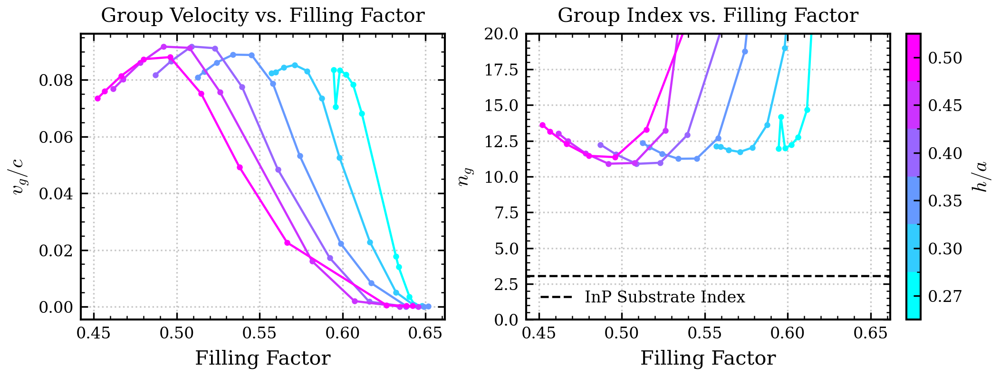

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

# ==========================================
# 0. Convert extracted_data to a DataFrame
# ==========================================
# Flatten the nested dictionaries into a list of flat dictionaries
flat_records = []
for entity in extracted_data:
    info = entity.get('entry_info', {})
    
    # Safely extract values, defaulting to NaN if they are missing
    record = {
        'h': info.get('h', np.nan),
        'ff': info.get('ff', np.nan),
        'vg': entity.get('vg_3', np.nan),
        'ng': entity.get('ng_3', np.nan),
        # Assuming fom_coupling is either in entity or info. Change as needed!
        'fom_coupling': entity.get('fom_coupling', np.nan) 
    }
    flat_records.append(record)

# Create the DataFrame your plotting code expects
df_res = pd.DataFrame(flat_records)

# Clean up any potential infinite values or zeros in vg for ng calculation
df_res['vg'] = df_res['vg'].replace(0, np.nan)
df_res['ng'] = 1.0 / df_res['vg']

# Drop rows where critical plotting data (like h or ff) is completely missing
df_res = df_res.dropna(subset=['h', 'ff'])

# ==========================================
# 1. Prepare unique levels and the mapping
# ==========================================
unique_h = np.sort(df_res['h'].unique())
n_levels = len(unique_h)

# Create integer boundaries for equal vertical spacing
boundaries = np.arange(n_levels + 1)
norm = colors.BoundaryNorm(boundaries, n_levels)
cmap = plt.get_cmap('cool', n_levels) # High contrast map

# Setup figure sizes (define these if not already defined globally)
eps_inp = 9.46  # Based on your previous logs

# ==========================================
# FIGURE 1: Group Velocity (vg)
# ==========================================
fig1, (ax1, ax2) = plt.subplots(1, 2, figsize=ROW1_COL2_SIZE, layout='constrained')

for idx, h_val in enumerate(unique_h):
    group = df_res[df_res['h'] == h_val].sort_values('ff')
    line_color = cmap(norm(idx))
    
    # Left Subplot: vg vs ff
    ax1.plot(group['ff'], group['vg'], marker='.', linestyle='-', color=line_color)
    
    

# Formatting Left
ax1.set_title('Group Velocity vs. Filling Factor')
ax1.set_xlabel('Filling Factor')
ax1.set_ylabel(r'$v_g/c$')
ax1.grid(True, linestyle=':', alpha=0.7)



# Add Colorbar for Figure 1
sm = cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar1 = fig1.colorbar(sm, ax=[ax1, ax2], ticks=np.arange(n_levels) + 0.5, pad=0.02)
cbar1.ax.set_yticklabels([f"{val:.2f}" for val in unique_h])
cbar1.set_label("$h/a$")




for idx, h_val in enumerate(unique_h):
    group = df_res[df_res['h'] == h_val].sort_values('ff')
    line_color = cmap(norm(idx))
    
    # Group Index vs ff
    ax2.plot(group['ff'], group['ng'], marker='.', linestyle='-', color=line_color)

# Formatting Figure 2
ax2.set_title('Group Index vs. Filling Factor')
ax2.set_xlabel('Filling Factor')
ax2.set_ylabel(r'$n_g$')
ax2.grid(True, linestyle=':', alpha=0.7)

# Plot a line for InP substrate index for reference
ax2.axhline(np.sqrt(eps_inp), color='black', linestyle='--', label='InP Substrate Index')
ax2.set_ylim(0, 20)
ax2.legend()


plt.show()

In [34]:
def get_entity(extracted_data, target_h, target_ff, h_tol=1e-4):
    """
    Finds the entity with a specific 'h' and the filling factor closest to 'target_ff'.
    """
    # 1. Filter the list for the specific 'h' value
    filtered_entities = []
    for entity in extracted_data:
        h_val = entity.get('entry_info', {}).get('h')
        if h_val is not None and abs(h_val - target_h) < h_tol:
            filtered_entities.append(entity)
            
    if not filtered_entities:
        print(f"No entities found with h ~ {target_h}")
        return None
        
    # 2. Find the entity with the FF closest to target_ff
    closest_entity = min(
        filtered_entities, 
        key=lambda e: abs(e.get('entry_info', {}).get('ff', float('inf')) - target_ff)
    )
    
    # Print a summary of what was found
    info = closest_entity['entry_info']
    print(f"--- Entity Found ---")
    print(f"Simulation Name : {info.get('sim_name')}")
    print(f"Target h: {target_h}  -> Actual h: {info.get('h')}")
    print(f"Target FF: {target_ff} -> Actual FF: {info.get('ff'):.4f}")
    print(f"Group Velocity  : {closest_entity.get('vg'):.4e} c")
    print(f"Coupling FOM    : {closest_entity.get('fom_coupling'):.4e}")
    
    return closest_entity

# ==========================================
# Example Usage:
# Grab the entity at h=0.50 that corresponds to the deep dip around FF=0.50
# ==========================================
test_entity = get_entity(extracted_data, target_h=0.45, target_ff=0.51)

--- Entity Found ---
Simulation Name : C4v_diatomic_holes_1_slab_opt_centered_h0.45_r1_0.2420
Target h: 0.45  -> Actual h: 0.45
Target FF: 0.51 -> Actual FF: 0.5077
Group Velocity  : 4.3087e-03 c
Coupling FOM    : 5.8568e-03


In [39]:
import pandas as pd
import numpy as np

# 1. Flatten the extracted data
optimal_points_data = []

for entity in extracted_data:
    info = entity.get('entry_info', {})
    h_val = info.get('h')
    vg_2 = entity.get('vg_2')
    
    if pd.isna(vg_2) or pd.isna(h_val) or vg_2 is None:
        continue
        
    df_zeven = entity.get('frequencies')
    gamma_row = df_zeven.loc[(np.isclose(df_zeven["k1"], 0)) & (np.isclose(df_zeven["k2"], 0))]
    wD = df_zeven.loc[gamma_row.index[0], "zeven band 9"] if not gamma_row.empty else np.nan
        
    optimal_points_data.append({
        'h': h_val,
        'FF': info.get('ff'),
        'r1': info.get('r1'),
        'r2': info.get('r2'),
        'vg_2': vg_2,
        'wD': wD
    })

df_all = pd.DataFrame(optimal_points_data)

# 2. Identify Peak and Half-Max points per group h
summary_list = []

for h, group in df_all.groupby('h'):
    # Find Max Peak
    peak_row = group.loc[group['vg_2'].idxmax()]
    
    # Find Half-Max point
    target_vg2 = peak_row['vg_2'] / 2.0
    half_max_row = group.iloc[(group['vg_2'] - target_vg2).abs().argsort()[:1]].iloc[0]
    
    summary_list.append({
        'h': h,
        'peak_wD': peak_row['wD'],
        'half_wD': half_max_row['wD'],
        'peak_vg2': peak_row['vg_2'],
        'half_vg2': half_max_row['vg_2']
    })

df_summary = pd.DataFrame(summary_list).sort_values('h')

print("Summary of Dirac Point Dispersion (Peak vs Half-Max):")
print("-" * 85)
print(df_summary.to_string(index=False))

Summary of Dirac Point Dispersion (Peak vs Half-Max):
-------------------------------------------------------------------------------------
   h  peak_wD  half_wD  peak_vg2  half_vg2
0.27 0.661001 0.649889  0.086579  0.026323
0.30 0.659946 0.652053  0.088820  0.056952
0.35 0.659698 0.647236  0.092548  0.057669
0.40 0.655682 0.640968  0.095055  0.052372
0.45 0.653065 0.619837  0.095330  0.027138
0.50 0.649075 0.632276  0.091804  0.054604


### Slab Thickness

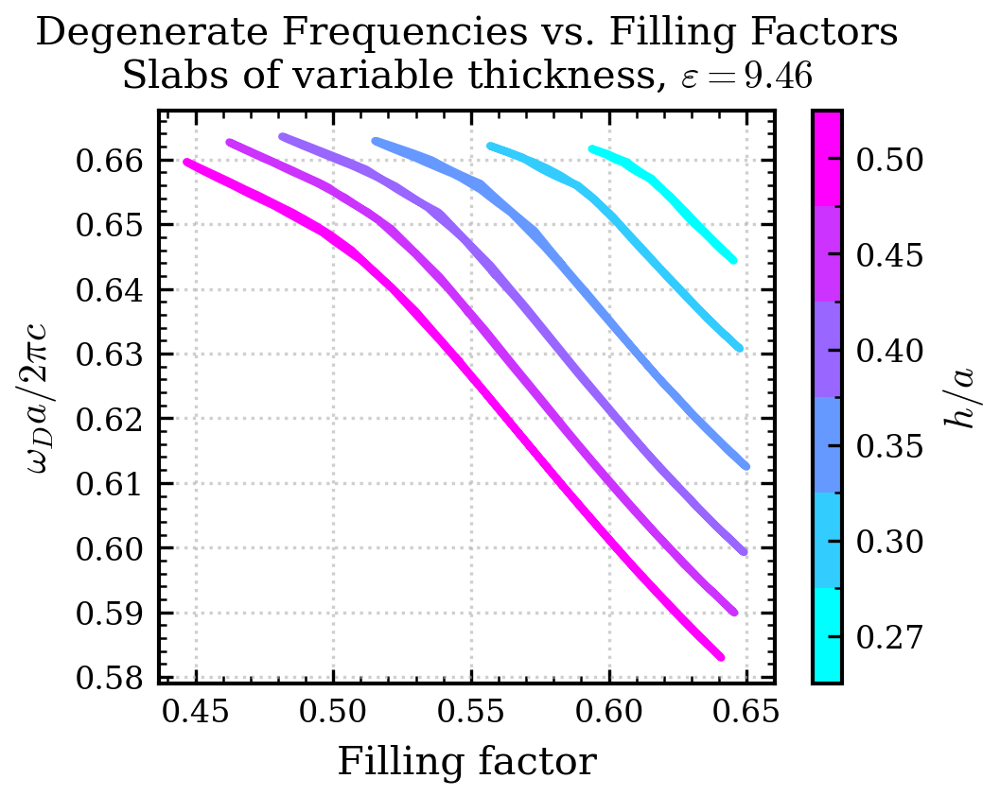

In [42]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import numpy as np

# 1. Prepare unique levels and the mapping
unique_h = np.sort(np.unique([dp["h"] for dp in data]))
n_levels = len(unique_h)

# Create integer boundaries for equal vertical spacing
boundaries = np.arange(n_levels + 1)
norm = colors.BoundaryNorm(boundaries, n_levels)
cmap = plt.get_cmap('cool', n_levels) # High contrast map

fig2 = plt.figure(figsize=ROW1_COL1_SIZE)

for i, dp in enumerate(data):
    # Extract frequency and factor data
    x, y, f = dp["analyzer"].compute_freq_dirac_along_ellipse_from_conic(
        dp["conic_params"], n_points=1000
    )
    filling_factor = 1 - (x**2 * np.pi + y**2 * np.pi)
    
    # 2. Assign color based on the index of h in unique_h
    idx = np.where(unique_h == dp["h"])[0][0]
    line_color = cmap(norm(idx))
    
    plt.plot(filling_factor, f, "-", linewidth=2, color=line_color)

    # Calculate and store f_max and f_min
    f_max = np.max(f)
    f_min = np.min(f)
    dp["f_max"] = f_max
    dp["f_min"] = f_min

# 3. Add the Equal-Spaced Colorbar
sm = cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

# Ticks are placed at 0.5, 1.5, etc. to be in the middle of color blocks
cbar = fig2.colorbar(sm, ax=plt.gca(), ticks=np.arange(n_levels) + 0.5)

# Set the actual h values as labels
cbar.ax.set_yticklabels([f"{val:.2f}" for val in unique_h])
cbar.set_label("$h/a$")

plt.title(
    f"Degenerate Frequencies vs. Filling Factors\n"
    rf"Slabs of variable thickness, $\varepsilon={eps_inp}$",
)

plt.xlabel("Filling factor")
plt.ylabel(r"$\omega_{D}a/2\pi c$")
plt.grid(True, linestyle=':', alpha=0.6)

plt.show()

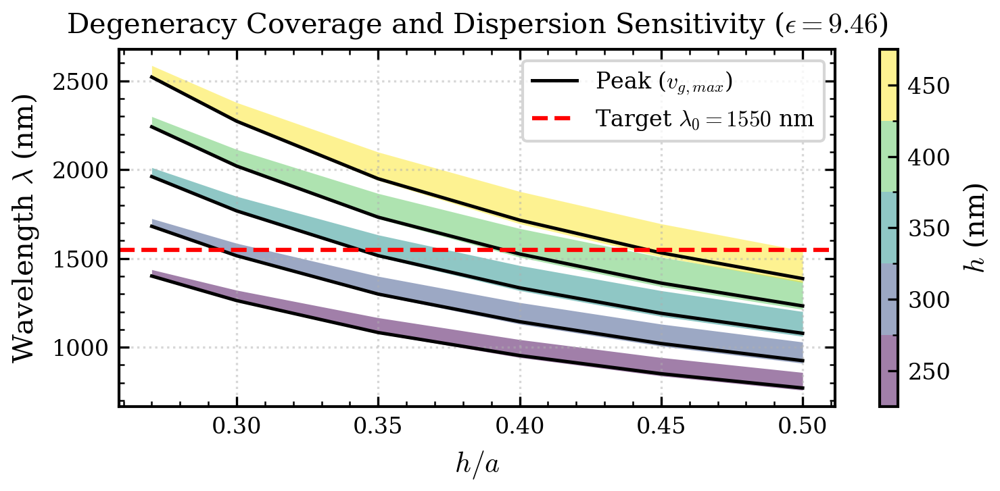

In [43]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
lam0 = 1550  # Target wavelength in nm
# Ensure data is sorted for fill_between
data_sorted = sorted(data, key=lambda x: x["h"])
h_axis = np.array([dp["h"] for dp in data_sorted])

# Map summarized frequencies to the plot axis
peak_wD_values = df_summary.set_index('h')['peak_wD'].reindex(h_axis).values
half_wD_values = df_summary.set_index('h')['half_wD'].reindex(h_axis).values

h_phy_list = [250, 300, 350, 400, 450]
n_levels = len(h_phy_list)
cmap_alpha = colors.ListedColormap(plt.get_cmap('viridis', n_levels)(np.arange(n_levels)))
cmap_alpha.colors[:, 3] = 0.5 # Apply alpha

plt.figure(figsize=ROW1_COL15_SIZE)

# Plot bands and characteristic lines
for i, hi in enumerate(h_phy_list):
    lam_mins = [hi / (dp["f_max"] * dp["h"]) for dp in data_sorted]
    lam_maxs = [hi / (dp["f_min"] * dp["h"]) for dp in data_sorted]
    
    plt.fill_between(h_axis, lam_mins, lam_maxs, color=cmap_alpha(i), linewidth=0)
    
    # Plot Peak (Solid Black)
    plt.plot(h_axis, hi / (peak_wD_values * h_axis), color="black", linewidth=1.2, 
             label="Peak ($v_{g,max}$)" if i == 0 else "")
    

plt.axhline(lam0, color="red", linestyle="--", linewidth=1.5, label=rf"Target $\lambda_0 = {lam0}$ nm")

# Colorbar setup
sm = cm.ScalarMappable(norm=colors.BoundaryNorm(np.arange(n_levels + 1), n_levels), cmap=cmap_alpha)
cbar = plt.colorbar(sm, ax=plt.gca(), ticks=np.arange(n_levels) + 0.5)
cbar.ax.set_yticklabels([f"{val}" for val in h_phy_list])
cbar.set_label("$h$ (nm)")

plt.xlabel("$h/a$")
plt.ylabel(r"Wavelength $\lambda$ (nm)")
plt.title(f"Degeneracy Coverage and Dispersion Sensitivity ($\epsilon={eps_inp}$)")
plt.grid(True, linestyle=':', alpha=0.5)
plt.legend(loc='upper right', frameon=True)

plt.tight_layout()
plt.show()

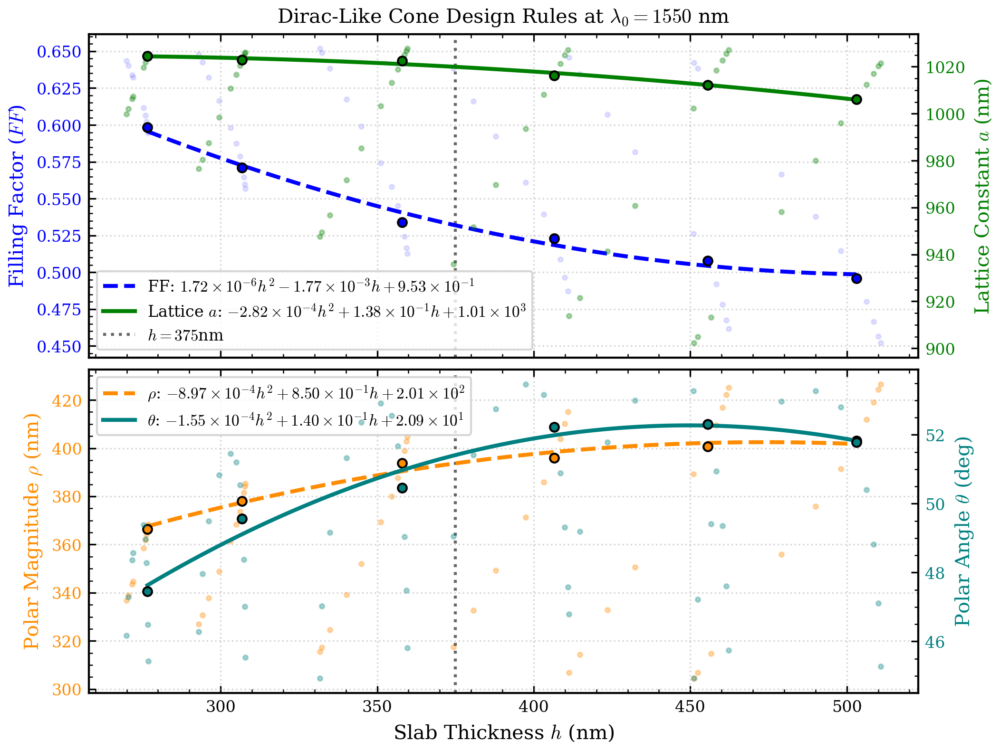

In [79]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Colors Definition for Consistency
color_ff = 'blue'
color_a = 'green'
color_rho = 'darkorange'
color_theta = 'teal'

# 2. Transform parameters to physical units for lambda0 = 1550 nm
target_lam = 1550  
df_all['a_phys'] = target_lam * df_all['wD']
df_all['h_phys'] = df_all['h'] * df_all['a_phys']
df_all['r1_phys'] = df_all['r1'] * df_all['a_phys']
df_all['r2_phys'] = df_all['r2'] * df_all['a_phys']

# Calculate Polar Coordinates
df_all['rho_phys'] = np.sqrt(df_all['r1_phys']**2 + df_all['r2_phys']**2)
df_all['theta_deg'] = np.degrees(np.arctan2(df_all['r2_phys'], df_all['r1_phys']))

# 3. Extract optimal points
h_targets = [250, 300, 350, 400, 450, 500]
df_max_vg2 = df_all.loc[df_all.groupby('h')['vg_2'].idxmax()].sort_values('h_phys')
df_inter = pd.concat([
    df_max_vg2.iloc[(df_max_vg2['h_phys'] - ht).abs().argsort()[:1]] 
    for ht in h_targets
]).drop_duplicates()

# 4. Compute Design Rules
h_range = np.linspace(df_inter['h_phys'].min(), df_inter['h_phys'].max(), 100)
p_ff    = np.polyfit(df_inter['h_phys'], df_inter['FF'], 2)
p_a     = np.polyfit(df_inter['h_phys'], df_inter['a_phys'], 2)
p_rho   = np.polyfit(df_inter['h_phys'], df_inter['rho_phys'], 2)
p_theta = np.polyfit(df_inter['h_phys'], df_inter['theta_deg'], 2)

# Function to format the polynomial coefficients into a LaTeX string
def format_latex_sci(val):
    """Converts a float to a LaTeX scientific notation string."""
    if val == 0: return "0"
    s = f"{val:.2e}"
    prefix, exponent = s.split('e')
    exponent = int(exponent)
    return rf"{prefix} \times 10^{{{exponent}}}"

def get_poly_label(p, name):
    """Generates a clean LaTeX quadratic equation for the legend."""
    # p[0]h^2 + p[1]h + p[2]
    
    # Term 1: ax^2
    term_h2 = f"{format_latex_sci(p[0])} h^2"
    
    # Term 2: bx (Handle sign to avoid '+ -')
    sign_h = " + " if p[1] >= 0 else " - "
    term_h = f"{sign_h}{format_latex_sci(abs(p[1]))} h"
    
    # Term 3: c (Handle sign)
    sign_c = " + " if p[2] >= 0 else " - "
    term_c = f"{sign_c}{format_latex_sci(abs(p[2]))}"
    
    return rf"{name}: ${term_h2}{term_h}{term_c}$"

# 5. Generate the Visualization
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=ROW2_COL2_SIZE, sharex=True, constrained_layout=True)

h_line = 375

# --- SUBPLOT 1: Filling Factor & Lattice Constant ---
# FF (Primary Y)
ax1.scatter(df_all['h_phys'], df_all['FF'], color=color_ff, s=5, alpha=0.1, zorder=1)
line_ff = ax1.plot(h_range, np.polyval(p_ff, h_range), color=color_ff, ls='--', lw=2, zorder=3, 
                   label=get_poly_label(p_ff, "FF"))
ax1.scatter(df_inter['h_phys'], df_inter['FF'], color=color_ff, s=20, edgecolors='black', zorder=5)
ax1.set_ylabel("Filling Factor ($FF$)", color=color_ff)
ax1.tick_params(axis='y', labelcolor=color_ff)
ax1.set_title(f"Dirac-Like Cone Design Rules at $\lambda_0 = {target_lam}$ nm")

# a (Twin Y)
ax1_twin = ax1.twinx()
ax1_twin.scatter(df_all['h_phys'], df_all['a_phys'], color=color_a, s=5, alpha=0.3, zorder=1)
line_a = ax1_twin.plot(h_range, np.polyval(p_a, h_range), color=color_a, lw=2, zorder=3, 
                       label=get_poly_label(p_a, "Lattice $a$"))
ax1_twin.scatter(df_inter['h_phys'], df_inter['a_phys'], color=color_a, s=20, edgecolors='black', zorder=4)
ax1_twin.set_ylabel("Lattice Constant $a$ (nm)", color=color_a)
ax1_twin.tick_params(axis='y', labelcolor=color_a)

# Vertical line at h=375nm
v_line = ax1.axvline(h_line, color='black', linestyle=':', alpha=0.6, lw=1.5, zorder=2, label=f'$h={h_line}$nm')

# Combine legends for Subplot 1
lns1 = line_ff + line_a + [v_line]
labs1 = [l.get_label() for l in lns1]
ax1.legend(lns1, labs1, loc='lower left', fontsize=8, frameon=True,framealpha=0.8)

# --- SUBPLOT 2: Polar Magnitude & Polar Angle ---
# Rho (Primary Y)
ax2.scatter(df_all['h_phys'], df_all['rho_phys'], color=color_rho, s=5, alpha=0.3, zorder=1)
line_rho = ax2.plot(h_range, np.polyval(p_rho, h_range), color=color_rho, ls='--', lw=2, zorder=3, 
                    label=get_poly_label(p_rho, r"$\rho$"))
ax2.scatter(df_inter['h_phys'], df_inter['rho_phys'], color=color_rho, s=20, edgecolors='black', zorder=5)
ax2.set_ylabel(r"Polar Magnitude $\rho$ (nm)", color=color_rho)
ax2.tick_params(axis='y', labelcolor=color_rho)
ax2.set_xlabel("Slab Thickness $h$ (nm)")

# Theta (Twin Y)
ax2_twin = ax2.twinx()
ax2_twin.scatter(df_all['h_phys'], df_all['theta_deg'], color=color_theta, s=5, alpha=0.3, zorder=1)
line_theta = ax2_twin.plot(h_range, np.polyval(p_theta, h_range), color=color_theta, ls='-', lw=2, zorder=3, 
                           label=get_poly_label(p_theta, r"$\theta$"))
ax2_twin.scatter(df_inter['h_phys'], df_inter['theta_deg'], color=color_theta, s=20, edgecolors='black', zorder=4)
ax2_twin.set_ylabel(r"Polar Angle $\theta$ (deg)", color=color_theta)
ax2_twin.tick_params(axis='y', labelcolor=color_theta)

# Vertical line at h=375nm
ax2.axvline(h_line, color='black', linestyle=':', alpha=0.6, lw=1.5, zorder=2)

# Combine legends for Subplot 2
lns2 = line_rho + line_theta
labs2 = [l.get_label() for l in lns2]
ax2.legend(lns2, labs2, loc='upper left', fontsize=8, frameon=True, framealpha=0.8)

# Formatting
ax1.grid(True, ls=':', alpha=0.5)
ax2.grid(True, ls=':', alpha=0.5)

plt.show()

In [49]:
SIMULATE = False

In [48]:
# --- 1. Calculate Optimized Parameters for h = 375 nm ---
h_target_phys = 375

# Evaluate design rules (from your previous polyfits)
a_opt_phys   = np.polyval(p_a, h_target_phys)
rho_opt_phys = np.polyval(p_rho, h_target_phys)
theta_opt_deg = np.polyval(p_theta, h_target_phys)

# Convert to Cartesian (physical nm)
r1_opt_phys = rho_opt_phys * np.cos(np.radians(theta_opt_deg))
r2_opt_phys = rho_opt_phys * np.sin(np.radians(theta_opt_deg))

# Normalize for MPB (parameters are typically relative to 'a')
r1_norm = r1_opt_phys / a_opt_phys
r2_norm = r2_opt_phys / a_opt_phys
h_norm  = h_target_phys / a_opt_phys

# --- 2. Configuration & Paths ---
lsf_config = LSFJobConfiguration(num_processors=32, span_option="hosts", span_value=1, queue="fotonano", mem="4GB")

# Updated label to reflect optimized status
data_line = rf"Optimized: $r_1={r1_norm:0.3f}a$, $r_2={r2_norm:0.3f}a$, $h={h_norm:0.3f}a$ (h_phys={h_target_phys}nm)"
fig_folder = os.path.join(figure_path, name_slab + "_optimized")
os.makedirs(fig_folder, exist_ok=True)

# --- 3. Simulation Setup ---
simulation_3D_optimized = Simulation(
    simulation_name=name_slab + "_optimized",
    script=script_slab_opt_centered,
    directory=os.path.join(data_rooth, name_slab + "_optimized")
)

if SIMULATE is True:
    print(f"Starting optimized 3D simulation for h = {h_target_phys} nm...")
    # Pass the normalized parameters to the MPB script
    simulation_3D_optimized.run_hpc_lsf(
        mpb_command_line_params=dict(r1=r1_norm, r2=r2_norm, h=h_norm), 
        LSFOptions=lsf_config
    )
    print("Done.")

# --- 4. Results Collection ---
print("Collecting results from ", simulation_3D_optimized.directory)
viewer_3D = SimulationViewer(simulation_3D_optimized) 
opt = MPBDataOptions(rectify=True, periods=1)

Starting optimized 3D simulation for h = 375 nm...


2026-03-30 16:57:24,495 - INFO - Job submitted with ID: 28124949


Done.


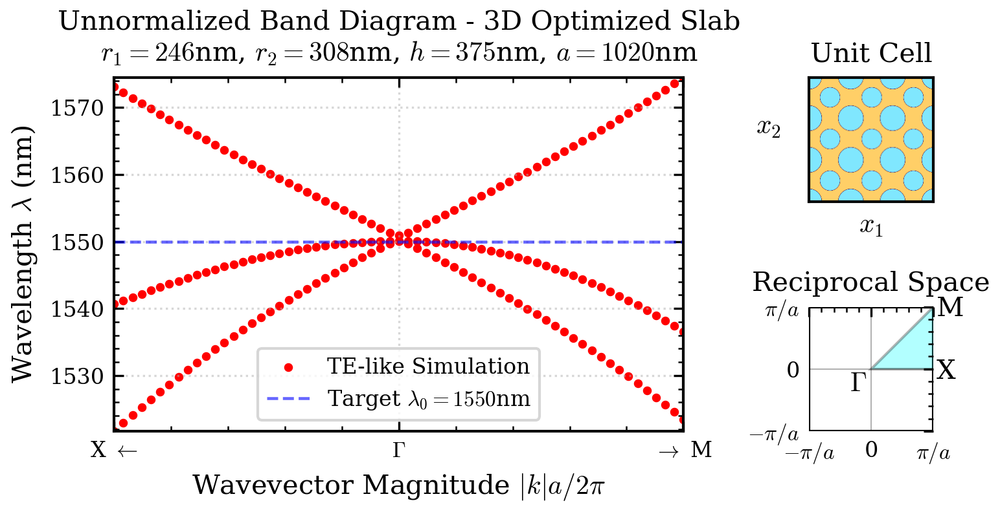

In [72]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
import numpy as np
import os

# --- 1. PARAMETER EXTRACTION (h = 375 nm) ---
h_target_phys = 375

# Evaluate design rules from polyfits (p_a, p_rho, p_theta must be defined)
a_opt_phys   = np.polyval(p_a, h_target_phys)
rho_opt_phys = np.polyval(p_rho, h_target_phys)
theta_opt_deg = np.polyval(p_theta, h_target_phys)

# Convert to Cartesian (nm) and then Normalize for simulation inputs
theta_rad = np.radians(theta_opt_deg)
r1_opt_phys = rho_opt_phys * np.cos(theta_rad)
r2_opt_phys = rho_opt_phys * np.sin(theta_rad)

r1_norm = r1_opt_phys / a_opt_phys
r2_norm = r2_opt_phys / a_opt_phys
h_norm  = h_target_phys / a_opt_phys

data_line = rf"$r_1={r1_opt_phys:0.0f}$nm, $r_2={r2_opt_phys:0.0f}$nm, $h={h_target_phys:0.0f}$nm, $a={a_opt_phys:0.0f}$nm"

# --- 2. DATA LOADING & TRANSFORMATION ---
df_zeven = simulation_3D_optimized.load_frequency_data("zeven")
band_cols = [c for c in df_zeven.columns if "zeven band" in c]

# Create wavelength DataFrame: Lambda (nm) = a_phys (nm) / Freq_norm
df_lambda = df_zeven.copy()
for col in band_cols:
    df_lambda[col] = a_opt_phys / df_zeven[col]

# --- 3. FIGURE SETUP ---
fig = plt.figure(figsize=(ROW1_COL15_SIZE), constrained_layout=True)
gs = gridspec.GridSpec(2, 3, figure=fig)

# -- 1. LEFT PANEL: Band Diagram (Wavelength vs. Symmetric Wavevector) --
ax_band = fig.add_subplot(gs[:, 0:2])

# Define the k-range to display (e.g., 0.1 to zoom in on Gamma, or 0.5 for full BZ)
k_range = 0.1

# Masks for the two paths: X <--- Gamma and Gamma ---> M
# Assuming 'kmag/2pi' represents the normalized wavevector magnitude |k|a/2pi
gamma_x_mask = (df_zeven["k2"] == 0) & (df_zeven["kmag/2pi"] <= k_range)
gamma_m_mask = (df_zeven["k1"] > 0) & (df_zeven["k2"] > 0) & (df_zeven["kmag/2pi"] <= k_range)

# Calculate Y-limits in wavelength (nm) based on your target bands (e.g., 8 to 10)
y_freq_min = df_zeven["zeven band 8"].min()
y_freq_max = df_zeven["zeven band 10"].max()
lambda_min, lambda_max = a_opt_phys/y_freq_max, a_opt_phys/y_freq_min

# Find the specific index for the vertical reference line (e.g., degeneracy point)
# Logic: find point where k2 is 0 and k1 is at its minimum non-zero value (closest to Gamma)
df_target_idx = df_zeven.loc[(df_zeven["k2"] == 0) & (df_zeven["k1"] > 0), "k1"].idxmin()

# Plot each band column
for i, col in enumerate(band_cols):
    lbl = "TE-like Simulation" if i == 0 else None
    
    # Path: X <--- Gamma (Plotting negative magnitude)
    ax_band.scatter(-df_lambda.loc[gamma_x_mask, "kmag/2pi"], df_lambda.loc[gamma_x_mask, col], 
                    color='red', s=5, marker='o', label=None)
    
    # Path: Gamma ---> M (Plotting positive magnitude)
    ax_band.scatter(df_lambda.loc[gamma_m_mask, "kmag/2pi"], df_lambda.loc[gamma_m_mask, col], 
                    color='red', s=5, marker='o', label=lbl)

# Add Target Wavelength and Vertical Degeneracy Line
ax_band.axhline(1550, color='blue', linestyle='--', alpha=0.6, label=r'Target $\lambda_0=1550$nm')


# Formatting the axes
ax_band.set_xlim(-k_range, k_range)
ax_band.set_ylim(lambda_min, lambda_max)

ax_band.set_xticks([-k_range, 0, k_range])
ax_band.set_xticklabels([r'X $\leftarrow$', r'$\Gamma$', r'$\rightarrow$ M'])

ax_band.set_xlabel('Wavevector Magnitude $|k|a/2\pi$')
ax_band.set_ylabel(r"Wavelength $\lambda$ (nm)")
ax_band.set_title("Unnormalized Band Diagram - 3D Optimized Slab\n" + data_line)
ax_band.grid(True, ls=':', alpha=0.5)
ax_band.legend(loc="lower center", frameon=True)

# -- PANEL 2: Square Lattice (Physical Slice) --
ax_lat = fig.add_subplot(gs[0, 2])
opt_3x3 = MPBDataOptions(rectify=True, periods=3)
eps_3x3 = simulation_3D_optimized.load_and_convert_epsilon_data(options=opt_3x3)
# Middle slice of the slab
eps_slice = eps_3x3[:, :, eps_3x3.shape[2] // 2]

ax_lat.imshow(eps_slice, cmap="managua_r", origin="lower") 
ax_lat.set_xticks([])
ax_lat.set_yticks([])
ax_lat.set_xlabel(r"$x_1$")
ax_lat.set_ylabel(r"$x_2$", rotation=0, labelpad=15)
ax_lat.set_title("Unit Cell")

# -- PANEL 3: Brillouin Zone --
ax_bz = fig.add_subplot(gs[1, 2])
# BZ Boundary
ax_bz.add_patch(patches.Rectangle((-1, -1), 2, 2, fill=False, edgecolor='black', lw=1))
# IBZ Triangle
ax_bz.add_patch(patches.Polygon([[0, 0], [1, 0], [1, 1]], closed=True, fill=True, facecolor='cyan', alpha=0.3, edgecolor='black'))

# Labels & Cleanup
ax_bz.axhline(0, color='black', linewidth=0.5, alpha=0.3)
ax_bz.axvline(0, color='black', linewidth=0.5, alpha=0.3)
ax_bz.text(-0.35, -0.35, r'$\Gamma$')
ax_bz.text(1.05, -0.15, 'X')
ax_bz.text(1.05, 0.85, 'M')

for spine in ax_bz.spines.values(): spine.set_visible(False)
ax_bz.tick_params(which='both', bottom=False, left=False)
ax_bz.set_xticks([-1, 0, 1])
ax_bz.set_xticklabels([r'$-\pi/a$', '0', r'$\pi/a$'])
ax_bz.set_yticks([-1, 0, 1])
ax_bz.set_yticklabels([r'$-\pi/a$', '0', r'$\pi/a$'])

ax_bz.set_aspect('equal')
ax_bz.set_title("Reciprocal Space")

# Save and show
output_name = f"unnormalized_bands_h{h_target_phys}.png"
plt.savefig(os.path.join(fig_folder, output_name), dpi=300)
plt.show()